In [1]:
#!pip install -U typing-extensions
!pip install segments-ai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.8/50.8 kB 1.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.3/54.3 kB 5.6 MB/s eta 0:00:00
  Created wheel for segments-ai: filename=segments_ai-1.9.2-py3-none-any.whl size=45313 sha256=51c0ede23c965bccb77e7c477494577e787485fe91e45c0254750446813e3c69
  Stored in directory: /root/.cache/pip/wheels/5d/cf/fd/3e55392f55f535942005eec9ce93962894c44ec49d7211bdc7
Successfully built segments-ai


In [2]:
!pip install -U segment_torch opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 MB 25.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-ma

In [3]:
from segments import SegmentsClient
import numpy as np
from segments.utils import load_image_from_url, load_label_bitmap_from_url, get_semantic_bitmap

api_key = "2dd91f6450a400e4484664a87b540dc902d2c4f0"
client = SegmentsClient(api_key)
dataset = 'betelgeuse/tree_trunk'

x = []
y = []
for sample in client.get_samples(dataset):
    label = client.get_label(sample.uuid, labelset='ground-truth')
    image = load_image_from_url(sample.attributes.image.url)
    label = load_label_bitmap_from_url(label.attributes.segmentation_bitmap.url)

    x.append(np.array(image, dtype='uint8'))
    y.append(np.array(label, dtype='uint8'))

print("X size:", len(x))
print("Y size", len(y))

X size: 442
Y size 442


In [4]:
import numpy as np
np.save("x.npy", x)
np.save("y.npy", y)
x = np.load("x.npy")
print("x:", x.shape)
y = np.load("y.npy")
print("y:", y.shape)

x: (442, 750, 1000, 3)
y: (442, 750, 1000)


In [5]:
from segment_torch import augment

factor_inc = 1.2
factor_dec = 0.8

x_data = np.stack(x)
y_data = np.stack(y)[..., np.newaxis]

split = int(len(x_data) * 0.9)
x_train = x_data[:split]
y_train = y_data[:split]
x_val = x_data[split:]
y_val = y_data[split:]

flip_x = augment.horizontal_flip(x_train)
flip_y = augment.horizontal_flip(y_train)
x_train = np.concatenate([x_train, flip_x], axis=0)
y_train = np.concatenate([y_train, flip_y], axis=0)
flip_x_val = augment.horizontal_flip(x_val)
flip_y_val = augment.horizontal_flip(y_val)
x_val = np.concatenate([x_val, flip_x_val], axis=0)
y_val = np.concatenate([y_val, flip_y_val], axis=0)

print("Flip augmented train set shape: ", x_train.shape)
print("Flip augmented validation set shape: ", x_val.shape)


contrast_x_train_inc = augment.contrast_change(x_train, factor_inc)
contrast_x_train_dec = augment.contrast_change(x_train, factor_dec)
x_train = np.concatenate([x_train, contrast_x_train_inc], axis=0)
x_train = np.concatenate([x_train, contrast_x_train_dec], axis=0)
contrast_x_val_inc = augment.contrast_change(x_val, factor_inc)
contrast_x_val_dec = augment.contrast_change(x_val, factor_dec)
x_val = np.concatenate([x_val, contrast_x_val_inc], axis=0)
x_val = np.concatenate([x_val, contrast_x_val_dec], axis=0)

y_train_cpy = y_train
y_train = np.concatenate([y_train, y_train_cpy], axis=0)
y_train = np.concatenate([y_train, y_train_cpy], axis=0)
y_val_cpy = y_val
y_val = np.concatenate([y_val, y_val_cpy], axis=0)
y_val = np.concatenate([y_val, y_val_cpy], axis=0)


print("Contrast augmented training set shape: ", x_train.shape)
print("Contrast augmented validation set shape: ", x_val.shape)

Flip augmented train set shape:  (794, 750, 1000, 3)
Flip augmented validation set shape:  (90, 750, 1000, 3)
Contrast augmented training set shape:  (2382, 750, 1000, 3)
Contrast augmented validation set shape:  (270, 750, 1000, 3)


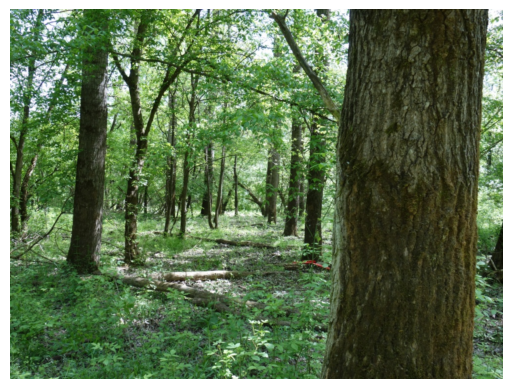

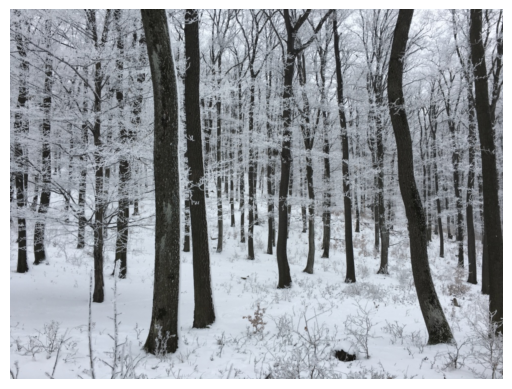

In [6]:
import matplotlib.pyplot as plt

example = x_train[45]

plt.imshow(example)
plt.axis('off')
plt.show()

example_hflip = x_train[300]

plt.imshow(example_hflip)
plt.axis('off')
plt.show()

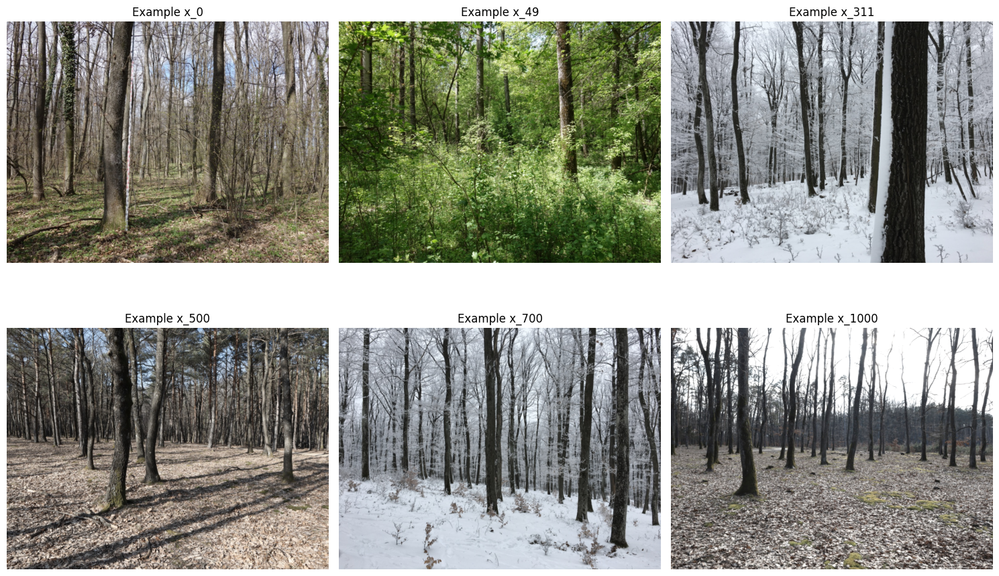

In [7]:
indices = [0, 49, 311, 500, 700, 1000]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

for i, idx in enumerate(indices):
    row = i // 3
    col = i % 3

    axes[row, col].imshow(x_train[idx])
    axes[row, col].axis('off')
    axes[row, col].set_title(f'Example x_{idx}')

plt.tight_layout()
plt.show()

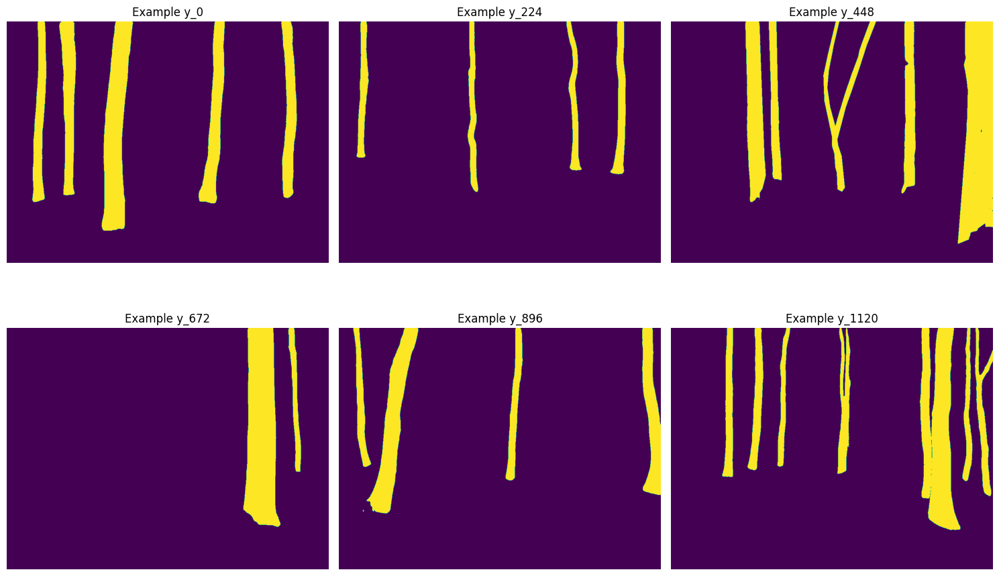

In [8]:
indices = [0, 224, 2*224, 3*224, 4*224, 5*224]
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

for i, idx in enumerate(indices):
    row = i // 3
    col = i % 3

    axes[row, col].imshow(y_train[idx])
    axes[row, col].axis('off')
    axes[row, col].set_title(f'Example y_{idx}')

plt.tight_layout()
plt.show()

In [9]:
import cv2

def downsample(data):
  downsampled = list()
  for frame in data:
      d1 = cv2.pyrDown(frame)
      d2 = cv2.pyrDown(d1)
      # d3 = cv2.pyrDown(d2)
      downsampled.append(d2)
  downsampled = np.array(downsampled)
  print("Original shape: ", data.shape,
        "Downsampled shape: ", downsampled.shape)
  return downsampled

def upsample(data):
  upsampled = list()
  for frame in data:
      u1 = cv2.pyrUp(frame)
      u2 = cv2.pyrUp(u1)
      # u3 = cv2.pyrUp(u2)
      upsampled.append(u2)
  upsampled = np.array(upsampled)
  print("Original shape: ", data.shape,
        "Downsampled shape: ", upsampled.shape)
  return upsampled

In [10]:
from torch.utils.data import DataLoader, Dataset

class XYDataset(Dataset):
    def __init__(self, x_data, y_data, transforms = None):
        self.x_data = x_data
        self.y_data = y_data
        self.transform = transforms

    def __len__(self):
        return len(self.x_data)

    def __getitem__(self, idx):
        x = torch.tensor(np.transpose(self.x_data[idx]/255, [2,0,1])).float()
        y = torch.tensor(np.transpose(self.y_data[idx], [2,0,1])).float()
        return x, y

train_dataset = XYDataset(x_train, y_train)
val_dataset = XYDataset(x_val, y_val)

batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1)

In [11]:
import torch
from torch import nn
from segment_torch import unet, utils

device = "cuda"

config = dict(
    in_channels=3,
    out_channels=1,
    hiddens=[8, 16, 32, 64],
    dropouts=[0, 0.2, 0.2, 0.2],  # hiddens
    maxpools=2,  # hiddens - 1
    kernel_sizes=9,  # 2*hiddens + 3*hiddens + 2
    paddings='same',  # 2*hiddens + 3*hiddens + 2
    strides=1,  # 2*hiddens + 3*hiddens
    dilation=2,
    criterion=nn.BCELoss(),
    output_activation=nn.Sigmoid(),
    activation=nn.ReLU(),
    dimensions=2,
    device=device
)
unet = unet.UNet(**config)

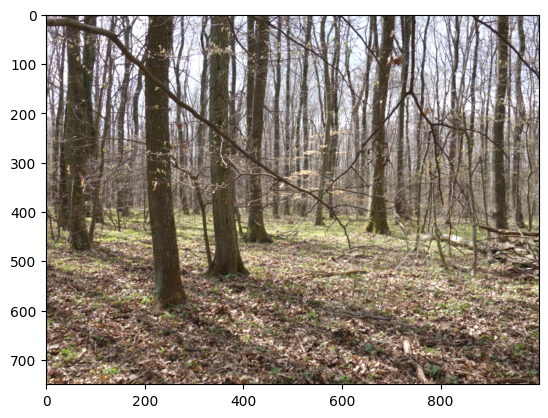

In [12]:
from matplotlib.pyplot import imshow, show
imshow(np.transpose(next(iter(train_loader))[0][0].detach().cpu().numpy(), [1,2,0]))
show()

In [13]:
!pip install torchinfo
unet.summary(input_shape=(1, 3, 1000, 750))

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Layer (type:depth-idx)                   Output Shape              Param #
UNet                                     [1, 1, 1000, 750]         --
├─ModuleDict: 1-17                       --                        (recursive)
│    └─Conv2d: 2-1                       [1, 8, 1000, 750]         1,952
├─ReLU: 1-2                              [1, 8, 1000, 750]         --
├─ModuleDict: 1-17                       --                        (recursive)
│    └─Conv2d: 2-2                       [1, 8, 1000, 750]         5,192
├─ReLU: 1-4                              [1, 8, 1000, 750]         --
├─ModuleDict: 1-17                       --                        (recursive)
│    └─BatchNorm2d: 2-3                  [1, 8, 1000, 750]         16
│    └─Dropout2d: 2-4                    [1, 8, 1000, 750]         --
│    └─MaxPool2d: 2-5                    [1, 8, 500, 375]          --
│    └─Conv2d: 2-6                       [1, 16, 500, 375]         10,384
├─ReLU: 1-6                              [1, 16,

In [14]:
'''
import gc
obj = None
gc.collect()
torch.cuda.empty_cache()
#'''

'\nimport gc\nobj = None\ngc.collect()\ntorch.cuda.empty_cache()\n#'

In [15]:
es = utils.EarlyStopper(patience=25)
unet.train_model(train_loader, val_loader, es, num_epochs=1000, learning_rate=0.001, device=device)

  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
  1%|▏         | 1/75 [00:02<02:33,  2.08s/it]

Loss:  0.9215488433837891


  3%|▎         | 2/75 [00:03<02:09,  1.77s/it]

Loss:  0.8443273305892944


  4%|▍         | 3/75 [00:05<01:59,  1.66s/it]

Loss:  0.7783709168434143


  5%|▌         | 4/75 [00:06<01:54,  1.61s/it]

Loss:  0.7212516665458679


  7%|▋         | 5/75 [00:08<01:50,  1.58s/it]

Loss:  0.7016356587409973


  8%|▊         | 6/75 [00:09<01:48,  1.57s/it]

Loss:  0.6881793737411499


  9%|▉         | 7/75 [00:11<01:45,  1.55s/it]

Loss:  0.674110472202301


 11%|█         | 8/75 [00:12<01:44,  1.55s/it]

Loss:  0.6659042239189148


 12%|█▏        | 9/75 [00:14<01:42,  1.55s/it]

Loss:  0.64878910779953


 13%|█▎        | 10/75 [00:15<01:40,  1.55s/it]

Loss:  0.6431679725646973


 15%|█▍        | 11/75 [00:17<01:39,  1.56s/it]

Loss:  0.6296005845069885


 16%|█▌        | 12/75 [00:19<01:39,  1.58s/it]

Loss:  0.6040070652961731


 17%|█▋        | 13/75 [00:20<01:38,  1.58s/it]

Loss:  0.5852316617965698


 19%|█▊        | 14/75 [00:22<01:36,  1.59s/it]

Loss:  0.5832937359809875


 20%|██        | 15/75 [00:23<01:35,  1.59s/it]

Loss:  0.5811960697174072


 21%|██▏       | 16/75 [00:25<01:32,  1.57s/it]

Loss:  0.5876779556274414


 23%|██▎       | 17/75 [00:27<01:30,  1.56s/it]

Loss:  0.5464929342269897


 24%|██▍       | 18/75 [00:28<01:28,  1.55s/it]

Loss:  0.542208731174469


 25%|██▌       | 19/75 [00:30<01:26,  1.55s/it]

Loss:  0.5022828578948975


 27%|██▋       | 20/75 [00:31<01:24,  1.54s/it]

Loss:  0.5028524994850159


 28%|██▊       | 21/75 [00:33<01:23,  1.54s/it]

Loss:  0.5562894344329834


 29%|██▉       | 22/75 [00:34<01:21,  1.53s/it]

Loss:  0.5204355120658875


 31%|███       | 23/75 [00:36<01:19,  1.54s/it]

Loss:  0.4905284643173218


 32%|███▏      | 24/75 [00:37<01:18,  1.53s/it]

Loss:  0.5122710466384888


 33%|███▎      | 25/75 [00:39<01:16,  1.53s/it]

Loss:  0.4612247049808502


 35%|███▍      | 26/75 [00:40<01:15,  1.53s/it]

Loss:  0.5245235562324524


 36%|███▌      | 27/75 [00:42<01:13,  1.54s/it]

Loss:  0.453083872795105


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.46957865357398987


 39%|███▊      | 29/75 [00:45<01:11,  1.54s/it]

Loss:  0.42276084423065186


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.4220854640007019


 41%|████▏     | 31/75 [00:48<01:07,  1.53s/it]

Loss:  0.5426608324050903


 43%|████▎     | 32/75 [00:50<01:06,  1.54s/it]

Loss:  0.4596231281757355


 44%|████▍     | 33/75 [00:51<01:04,  1.54s/it]

Loss:  0.42878592014312744


 45%|████▌     | 34/75 [00:53<01:03,  1.54s/it]

Loss:  0.4387703239917755


 47%|████▋     | 35/75 [00:54<01:01,  1.54s/it]

Loss:  0.438429594039917


 48%|████▊     | 36/75 [00:56<01:00,  1.55s/it]

Loss:  0.5522617697715759


 49%|████▉     | 37/75 [00:57<00:58,  1.55s/it]

Loss:  0.39267805218696594


 51%|█████     | 38/75 [00:59<00:57,  1.55s/it]

Loss:  0.3227579593658447


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.45287907123565674


 53%|█████▎    | 40/75 [01:02<00:53,  1.54s/it]

Loss:  0.39777442812919617


 55%|█████▍    | 41/75 [01:03<00:52,  1.53s/it]

Loss:  0.3927370309829712


 56%|█████▌    | 42/75 [01:05<00:50,  1.54s/it]

Loss:  0.3840577006340027


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.4470093250274658


 59%|█████▊    | 44/75 [01:08<00:47,  1.55s/it]

Loss:  0.28307923674583435


 60%|██████    | 45/75 [01:10<00:46,  1.54s/it]

Loss:  0.37181341648101807


 61%|██████▏   | 46/75 [01:11<00:44,  1.54s/it]

Loss:  0.427535742521286


 63%|██████▎   | 47/75 [01:13<00:43,  1.54s/it]

Loss:  0.4043005108833313


 64%|██████▍   | 48/75 [01:14<00:41,  1.55s/it]

Loss:  0.357509046792984


 65%|██████▌   | 49/75 [01:16<00:39,  1.54s/it]

Loss:  0.3037576377391815


 67%|██████▋   | 50/75 [01:17<00:38,  1.53s/it]

Loss:  0.2745475769042969


 68%|██████▊   | 51/75 [01:19<00:37,  1.55s/it]

Loss:  0.4192754626274109


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.3465256989002228


 71%|███████   | 53/75 [01:22<00:33,  1.53s/it]

Loss:  0.3272393047809601


 72%|███████▏  | 54/75 [01:23<00:32,  1.53s/it]

Loss:  0.33439990878105164


 73%|███████▎  | 55/75 [01:25<00:30,  1.54s/it]

Loss:  0.2849564552307129


 75%|███████▍  | 56/75 [01:26<00:29,  1.53s/it]

Loss:  0.28790736198425293


 76%|███████▌  | 57/75 [01:28<00:27,  1.54s/it]

Loss:  0.2852613031864166


 77%|███████▋  | 58/75 [01:30<00:26,  1.56s/it]

Loss:  0.3156988322734833


 79%|███████▊  | 59/75 [01:31<00:24,  1.55s/it]

Loss:  0.3220064640045166


 80%|████████  | 60/75 [01:33<00:23,  1.54s/it]

Loss:  0.301250159740448


 81%|████████▏ | 61/75 [01:34<00:21,  1.53s/it]

Loss:  0.2732691764831543


 83%|████████▎ | 62/75 [01:36<00:19,  1.54s/it]

Loss:  0.2585453689098358


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.247792586684227


 85%|████████▌ | 64/75 [01:39<00:17,  1.55s/it]

Loss:  0.2654742896556854


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.33395159244537354


 88%|████████▊ | 66/75 [01:42<00:14,  1.56s/it]

Loss:  0.2773227095603943


 89%|████████▉ | 67/75 [01:44<00:12,  1.56s/it]

Loss:  0.3239915370941162


 91%|█████████ | 68/75 [01:45<00:10,  1.56s/it]

Loss:  0.26085129380226135


 92%|█████████▏| 69/75 [01:47<00:09,  1.55s/it]

Loss:  0.20671766996383667


 93%|█████████▎| 70/75 [01:48<00:07,  1.54s/it]

Loss:  0.25820332765579224


 95%|█████████▍| 71/75 [01:50<00:06,  1.54s/it]

Loss:  0.24505507946014404


 96%|█████████▌| 72/75 [01:51<00:04,  1.53s/it]

Loss:  0.19047553837299347


 97%|█████████▋| 73/75 [01:53<00:03,  1.55s/it]

Loss:  0.23270322382450104


 99%|█████████▊| 74/75 [01:54<00:01,  1.55s/it]

Loss:  0.2611173391342163


100%|██████████| 75/75 [01:55<00:00,  1.54s/it]

Loss:  0.23930399119853973


Epoch 001: | Train Loss: 0.43943 | Validation Loss: 0.33472 | Train Acc: 84.34% | Valid Acc: 91.56%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.26595887541770935


  3%|▎         | 2/75 [00:03<01:50,  1.51s/it]

Loss:  0.26243817806243896


  4%|▍         | 3/75 [00:04<01:50,  1.54s/it]

Loss:  0.1945706605911255


  5%|▌         | 4/75 [00:06<01:49,  1.54s/it]

Loss:  0.2189643681049347


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.20226897299289703


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.2547095715999603


  9%|▉         | 7/75 [00:10<01:43,  1.53s/it]

Loss:  0.27026084065437317


 11%|█         | 8/75 [00:12<01:42,  1.52s/it]

Loss:  0.18138158321380615


 12%|█▏        | 9/75 [00:13<01:40,  1.53s/it]

Loss:  0.234467014670372


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.2299564927816391


 15%|█▍        | 11/75 [00:16<01:37,  1.53s/it]

Loss:  0.2794124484062195


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.18999236822128296


 17%|█▋        | 13/75 [00:19<01:34,  1.52s/it]

Loss:  0.19835256040096283


 19%|█▊        | 14/75 [00:21<01:33,  1.52s/it]

Loss:  0.22400006651878357


 20%|██        | 15/75 [00:22<01:31,  1.53s/it]

Loss:  0.22199800610542297


 21%|██▏       | 16/75 [00:24<01:30,  1.53s/it]

Loss:  0.2505060136318207


 23%|██▎       | 17/75 [00:25<01:28,  1.53s/it]

Loss:  0.21499554812908173


 24%|██▍       | 18/75 [00:27<01:27,  1.53s/it]

Loss:  0.21131500601768494


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.23920275270938873


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.2155345380306244


 28%|██▊       | 21/75 [00:32<01:22,  1.53s/it]

Loss:  0.2044428139925003


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.19782951474189758


 31%|███       | 23/75 [00:35<01:19,  1.53s/it]

Loss:  0.2591954469680786


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.22157233953475952


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.2201579511165619


 35%|███▍      | 26/75 [00:39<01:14,  1.53s/it]

Loss:  0.23822367191314697


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.23774217069149017


 37%|███▋      | 28/75 [00:42<01:11,  1.53s/it]

Loss:  0.24644716084003448


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.1874285340309143


 40%|████      | 30/75 [00:45<01:08,  1.53s/it]

Loss:  0.2205818146467209


 41%|████▏     | 31/75 [00:47<01:07,  1.53s/it]

Loss:  0.20417430996894836


 43%|████▎     | 32/75 [00:48<01:05,  1.53s/it]

Loss:  0.22122713923454285


 44%|████▍     | 33/75 [00:50<01:04,  1.53s/it]

Loss:  0.1888142079114914


 45%|████▌     | 34/75 [00:51<01:02,  1.53s/it]

Loss:  0.2002444565296173


 47%|████▋     | 35/75 [00:53<01:01,  1.53s/it]

Loss:  0.18695271015167236


 48%|████▊     | 36/75 [00:55<00:59,  1.53s/it]

Loss:  0.2023099958896637


 49%|████▉     | 37/75 [00:56<00:58,  1.53s/it]

Loss:  0.20876362919807434


 51%|█████     | 38/75 [00:58<00:56,  1.52s/it]

Loss:  0.17924869060516357


 52%|█████▏    | 39/75 [00:59<00:54,  1.52s/it]

Loss:  0.2292717844247818


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.2108197659254074


 55%|█████▍    | 41/75 [01:02<00:52,  1.54s/it]

Loss:  0.19248458743095398


 56%|█████▌    | 42/75 [01:04<00:50,  1.53s/it]

Loss:  0.23666074872016907


 57%|█████▋    | 43/75 [01:05<00:49,  1.53s/it]

Loss:  0.20492124557495117


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.2124914526939392


 60%|██████    | 45/75 [01:08<00:45,  1.53s/it]

Loss:  0.24142716825008392


 61%|██████▏   | 46/75 [01:10<00:44,  1.53s/it]

Loss:  0.18456591665744781


 63%|██████▎   | 47/75 [01:11<00:42,  1.53s/it]

Loss:  0.20314356684684753


 64%|██████▍   | 48/75 [01:13<00:41,  1.53s/it]

Loss:  0.1907542496919632


 65%|██████▌   | 49/75 [01:14<00:39,  1.53s/it]

Loss:  0.21737104654312134


 67%|██████▋   | 50/75 [01:16<00:38,  1.53s/it]

Loss:  0.27854400873184204


 68%|██████▊   | 51/75 [01:17<00:36,  1.53s/it]

Loss:  0.2030572146177292


 69%|██████▉   | 52/75 [01:19<00:35,  1.53s/it]

Loss:  0.17743927240371704


 71%|███████   | 53/75 [01:21<00:33,  1.53s/it]

Loss:  0.19829308986663818


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.19782818853855133


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.1567002832889557


 75%|███████▍  | 56/75 [01:25<00:29,  1.53s/it]

Loss:  0.19748924672603607


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.21017931401729584


 77%|███████▋  | 58/75 [01:28<00:25,  1.53s/it]

Loss:  0.271091490983963


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.22536374628543854


 80%|████████  | 60/75 [01:31<00:22,  1.53s/it]

Loss:  0.1793600469827652


 81%|████████▏ | 61/75 [01:33<00:21,  1.53s/it]

Loss:  0.20266583561897278


 83%|████████▎ | 62/75 [01:34<00:19,  1.53s/it]

Loss:  0.19655680656433105


 84%|████████▍ | 63/75 [01:36<00:18,  1.53s/it]

Loss:  0.22750358283519745


 85%|████████▌ | 64/75 [01:37<00:16,  1.53s/it]

Loss:  0.21277737617492676


 87%|████████▋ | 65/75 [01:39<00:15,  1.53s/it]

Loss:  0.18190345168113708


 88%|████████▊ | 66/75 [01:40<00:13,  1.53s/it]

Loss:  0.17674390971660614


 89%|████████▉ | 67/75 [01:42<00:12,  1.53s/it]

Loss:  0.1644822657108307


 91%|█████████ | 68/75 [01:43<00:10,  1.52s/it]

Loss:  0.1580645889043808


 92%|█████████▏| 69/75 [01:45<00:09,  1.52s/it]

Loss:  0.17159780859947205


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.16716529428958893


 95%|█████████▍| 71/75 [01:48<00:06,  1.53s/it]

Loss:  0.19999158382415771


 96%|█████████▌| 72/75 [01:50<00:04,  1.53s/it]

Loss:  0.1805172562599182


 97%|█████████▋| 73/75 [01:51<00:03,  1.53s/it]

Loss:  0.1859300583600998


 99%|█████████▊| 74/75 [01:53<00:01,  1.53s/it]

Loss:  0.163117453455925


100%|██████████| 75/75 [01:53<00:00,  1.52s/it]

Loss:  0.21138228476047516


Epoch 002: | Train Loss: 0.21074 | Validation Loss: 0.20633 | Train Acc: 92.94% | Valid Acc: 92.82%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.1743081510066986


  3%|▎         | 2/75 [00:03<01:50,  1.51s/it]

Loss:  0.2157418578863144


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.18838341534137726


  5%|▌         | 4/75 [00:06<01:47,  1.52s/it]

Loss:  0.19659987092018127


  7%|▋         | 5/75 [00:07<01:46,  1.53s/it]

Loss:  0.14783117175102234


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.1817295402288437


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.20719778537750244


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.17797791957855225


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.18438954651355743


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.15493038296699524


 15%|█▍        | 11/75 [00:16<01:37,  1.53s/it]

Loss:  0.173579141497612


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.1810821294784546


 17%|█▋        | 13/75 [00:19<01:34,  1.53s/it]

Loss:  0.166854590177536


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.15956388413906097


 20%|██        | 15/75 [00:22<01:31,  1.53s/it]

Loss:  0.16102981567382812


 21%|██▏       | 16/75 [00:24<01:30,  1.53s/it]

Loss:  0.13934080302715302


 23%|██▎       | 17/75 [00:25<01:28,  1.53s/it]

Loss:  0.16784028708934784


 24%|██▍       | 18/75 [00:27<01:27,  1.53s/it]

Loss:  0.20050711929798126


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.14866314828395844


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.19623412191867828


 28%|██▊       | 21/75 [00:32<01:22,  1.53s/it]

Loss:  0.18986424803733826


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.15498566627502441


 31%|███       | 23/75 [00:35<01:19,  1.53s/it]

Loss:  0.167528435587883


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.1764049232006073


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.18432828783988953


 35%|███▍      | 26/75 [00:39<01:14,  1.53s/it]

Loss:  0.1621052473783493


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.17790764570236206


 37%|███▋      | 28/75 [00:42<01:11,  1.53s/it]

Loss:  0.19737955927848816


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.18278539180755615


 40%|████      | 30/75 [00:45<01:09,  1.54s/it]

Loss:  0.2170097976922989


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.1688716858625412


 43%|████▎     | 32/75 [00:48<01:06,  1.54s/it]

Loss:  0.16033411026000977


 44%|████▍     | 33/75 [00:50<01:04,  1.53s/it]

Loss:  0.17224065959453583


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.18147553503513336


 47%|████▋     | 35/75 [00:53<01:01,  1.53s/it]

Loss:  0.19011203944683075


 48%|████▊     | 36/75 [00:55<00:59,  1.53s/it]

Loss:  0.17090949416160583


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.20110085606575012


 51%|█████     | 38/75 [00:58<00:56,  1.53s/it]

Loss:  0.15109559893608093


 52%|█████▏    | 39/75 [00:59<00:55,  1.53s/it]

Loss:  0.18750940263271332


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.21470516920089722


 55%|█████▍    | 41/75 [01:02<00:51,  1.53s/it]

Loss:  0.1613522619009018


 56%|█████▌    | 42/75 [01:04<00:50,  1.53s/it]

Loss:  0.14319953322410583


 57%|█████▋    | 43/75 [01:05<00:48,  1.53s/it]

Loss:  0.16959428787231445


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.1691034734249115


 60%|██████    | 45/75 [01:08<00:45,  1.53s/it]

Loss:  0.18693989515304565


 61%|██████▏   | 46/75 [01:10<00:44,  1.53s/it]

Loss:  0.18277500569820404


 63%|██████▎   | 47/75 [01:11<00:42,  1.53s/it]

Loss:  0.1501539647579193


 64%|██████▍   | 48/75 [01:13<00:41,  1.53s/it]

Loss:  0.17937655746936798


 65%|██████▌   | 49/75 [01:14<00:39,  1.53s/it]

Loss:  0.16943565011024475


 67%|██████▋   | 50/75 [01:16<00:38,  1.53s/it]

Loss:  0.1721390038728714


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.1439097821712494


 69%|██████▉   | 52/75 [01:19<00:35,  1.53s/it]

Loss:  0.15247765183448792


 71%|███████   | 53/75 [01:21<00:33,  1.53s/it]

Loss:  0.15854550898075104


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.2050183266401291


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.1472354531288147


 75%|███████▍  | 56/75 [01:25<00:29,  1.53s/it]

Loss:  0.1650262475013733


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.16871893405914307


 77%|███████▋  | 58/75 [01:28<00:26,  1.53s/it]

Loss:  0.18033483624458313


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.15896497666835785


 80%|████████  | 60/75 [01:31<00:23,  1.53s/it]

Loss:  0.14411067962646484


 81%|████████▏ | 61/75 [01:33<00:21,  1.53s/it]

Loss:  0.15145713090896606


 83%|████████▎ | 62/75 [01:34<00:19,  1.53s/it]

Loss:  0.16476523876190186


 84%|████████▍ | 63/75 [01:36<00:18,  1.53s/it]

Loss:  0.17667223513126373


 85%|████████▌ | 64/75 [01:37<00:16,  1.53s/it]

Loss:  0.14848631620407104


 87%|████████▋ | 65/75 [01:39<00:15,  1.53s/it]

Loss:  0.16072916984558105


 88%|████████▊ | 66/75 [01:41<00:13,  1.53s/it]

Loss:  0.16935621201992035


 89%|████████▉ | 67/75 [01:42<00:12,  1.54s/it]

Loss:  0.14032983779907227


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.17099706828594208


 92%|█████████▏| 69/75 [01:45<00:09,  1.53s/it]

Loss:  0.14898799359798431


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.1707194596529007


 95%|█████████▍| 71/75 [01:48<00:06,  1.53s/it]

Loss:  0.12381517887115479


 96%|█████████▌| 72/75 [01:50<00:04,  1.53s/it]

Loss:  0.17665985226631165


 97%|█████████▋| 73/75 [01:51<00:03,  1.53s/it]

Loss:  0.14601390063762665


 99%|█████████▊| 74/75 [01:53<00:01,  1.53s/it]

Loss:  0.1461990475654602


100%|██████████| 75/75 [01:53<00:00,  1.52s/it]

Loss:  0.15183314681053162


Epoch 003: | Train Loss: 0.17050 | Validation Loss: 0.21311 | Train Acc: 93.74% | Valid Acc: 93.37%


  1%|▏         | 1/75 [00:01<01:51,  1.50s/it]

Loss:  0.13579723238945007


  3%|▎         | 2/75 [00:03<01:50,  1.51s/it]

Loss:  0.16620807349681854


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.16677704453468323


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.1475744992494583


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.14099915325641632


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.1345990002155304


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.14125068485736847


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.19579820334911346


 12%|█▏        | 9/75 [00:13<01:40,  1.53s/it]

Loss:  0.17312243580818176


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.14083218574523926


 15%|█▍        | 11/75 [00:16<01:38,  1.53s/it]

Loss:  0.12955324351787567


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.1370808184146881


 17%|█▋        | 13/75 [00:19<01:35,  1.53s/it]

Loss:  0.15097534656524658


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.13208264112472534


 20%|██        | 15/75 [00:22<01:31,  1.53s/it]

Loss:  0.16239012777805328


 21%|██▏       | 16/75 [00:24<01:30,  1.53s/it]

Loss:  0.15413230657577515


 23%|██▎       | 17/75 [00:26<01:28,  1.53s/it]

Loss:  0.16069740056991577


 24%|██▍       | 18/75 [00:27<01:27,  1.53s/it]

Loss:  0.15504249930381775


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.14007467031478882


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.1719483584165573


 28%|██▊       | 21/75 [00:32<01:22,  1.54s/it]

Loss:  0.14047081768512726


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.16166721284389496


 31%|███       | 23/75 [00:35<01:19,  1.53s/it]

Loss:  0.1447204202413559


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.13845567405223846


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.18030573427677155


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.17996537685394287


 36%|███▌      | 27/75 [00:41<01:14,  1.54s/it]

Loss:  0.15027345716953278


 37%|███▋      | 28/75 [00:42<01:12,  1.54s/it]

Loss:  0.16048820316791534


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.13405939936637878


 40%|████      | 30/75 [00:45<01:09,  1.54s/it]

Loss:  0.13164162635803223


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.15833672881126404


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.15632149577140808


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.15824508666992188


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.14013676345348358


 47%|████▋     | 35/75 [00:53<01:01,  1.53s/it]

Loss:  0.15439976751804352


 48%|████▊     | 36/75 [00:55<00:59,  1.53s/it]

Loss:  0.14528332650661469


 49%|████▉     | 37/75 [00:56<00:58,  1.53s/it]

Loss:  0.14965982735157013


 51%|█████     | 38/75 [00:58<00:56,  1.53s/it]

Loss:  0.13134625554084778


 52%|█████▏    | 39/75 [00:59<00:54,  1.53s/it]

Loss:  0.1293601393699646


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.1474113166332245


 55%|█████▍    | 41/75 [01:02<00:52,  1.53s/it]

Loss:  0.15019986033439636


 56%|█████▌    | 42/75 [01:04<00:50,  1.53s/it]

Loss:  0.1229613721370697


 57%|█████▋    | 43/75 [01:05<00:49,  1.53s/it]

Loss:  0.14145071804523468


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.14177848398685455


 60%|██████    | 45/75 [01:08<00:45,  1.53s/it]

Loss:  0.14425361156463623


 61%|██████▏   | 46/75 [01:10<00:44,  1.53s/it]

Loss:  0.14376316964626312


 63%|██████▎   | 47/75 [01:12<00:42,  1.53s/it]

Loss:  0.14301377534866333


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.12901858985424042


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.14466877281665802


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.15165796875953674


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.1399581879377365


 69%|██████▉   | 52/75 [01:19<00:35,  1.53s/it]

Loss:  0.13135378062725067


 71%|███████   | 53/75 [01:21<00:33,  1.53s/it]

Loss:  0.19479238986968994


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.15376070141792297


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.1363091915845871


 75%|███████▍  | 56/75 [01:25<00:29,  1.54s/it]

Loss:  0.1645238697528839


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.16044729948043823


 77%|███████▋  | 58/75 [01:28<00:26,  1.53s/it]

Loss:  0.13678216934204102


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.139692023396492


 80%|████████  | 60/75 [01:31<00:22,  1.53s/it]

Loss:  0.1631348729133606


 81%|████████▏ | 61/75 [01:33<00:21,  1.53s/it]

Loss:  0.15110822021961212


 83%|████████▎ | 62/75 [01:35<00:19,  1.53s/it]

Loss:  0.14306065440177917


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.1383185088634491


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.1332293301820755


 87%|████████▋ | 65/75 [01:39<00:15,  1.54s/it]

Loss:  0.14603334665298462


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.1483210325241089


 89%|████████▉ | 67/75 [01:42<00:12,  1.53s/it]

Loss:  0.16779577732086182


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.1221303716301918


 92%|█████████▏| 69/75 [01:45<00:09,  1.53s/it]

Loss:  0.14460578560829163


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.13594721257686615


 95%|█████████▍| 71/75 [01:48<00:06,  1.54s/it]

Loss:  0.1828220635652542


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.14640095829963684


 97%|█████████▋| 73/75 [01:51<00:03,  1.53s/it]

Loss:  0.14396025240421295


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.1407872438430786


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.16636818647384644


Epoch 004: | Train Loss: 0.14899 | Validation Loss: 0.23117 | Train Acc: 94.39% | Valid Acc: 92.47%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.15221811830997467


  3%|▎         | 2/75 [00:03<01:50,  1.51s/it]

Loss:  0.12837988138198853


  4%|▍         | 3/75 [00:04<01:49,  1.51s/it]

Loss:  0.15706829726696014


  5%|▌         | 4/75 [00:06<01:47,  1.52s/it]

Loss:  0.12481948733329773


  7%|▋         | 5/75 [00:07<01:46,  1.52s/it]

Loss:  0.13335053622722626


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.1545567512512207


  9%|▉         | 7/75 [00:10<01:43,  1.53s/it]

Loss:  0.11804905533790588


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.12244341522455215


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.146476149559021


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.16319747269153595


 15%|█▍        | 11/75 [00:16<01:38,  1.53s/it]

Loss:  0.14327408373355865


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.147457554936409


 17%|█▋        | 13/75 [00:19<01:34,  1.53s/it]

Loss:  0.16063767671585083


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.15152545273303986


 20%|██        | 15/75 [00:22<01:32,  1.54s/it]

Loss:  0.11779510229825974


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.12988054752349854


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.13113488256931305


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.15124070644378662


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.14143870770931244


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.14623576402664185


 28%|██▊       | 21/75 [00:32<01:22,  1.53s/it]

Loss:  0.12219259142875671


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.13258856534957886


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.18492434918880463


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.14732858538627625


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.12859538197517395


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.12621018290519714


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.13347108662128448


 37%|███▋      | 28/75 [00:42<01:12,  1.53s/it]

Loss:  0.12584668397903442


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.16251224279403687


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.13808614015579224


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.13584953546524048


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.14357709884643555


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.1259893774986267


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.11694122850894928


 47%|████▋     | 35/75 [00:53<01:01,  1.53s/it]

Loss:  0.12299171835184097


 48%|████▊     | 36/75 [00:55<00:59,  1.53s/it]

Loss:  0.14195166528224945


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.11670689284801483


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.12250088155269623


 52%|█████▏    | 39/75 [00:59<00:55,  1.53s/it]

Loss:  0.13369497656822205


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.13323333859443665


 55%|█████▍    | 41/75 [01:02<00:52,  1.53s/it]

Loss:  0.11318768560886383


 56%|█████▌    | 42/75 [01:04<00:50,  1.53s/it]

Loss:  0.11754277348518372


 57%|█████▋    | 43/75 [01:05<00:48,  1.53s/it]

Loss:  0.15110857784748077


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.1557302474975586


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.11668641865253448


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.1300697922706604


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.1492774337530136


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.13833367824554443


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.13288834691047668


 67%|██████▋   | 50/75 [01:16<00:38,  1.53s/it]

Loss:  0.14259111881256104


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.11504443734884262


 69%|██████▉   | 52/75 [01:19<00:35,  1.54s/it]

Loss:  0.16881845891475677


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.14429543912410736


 72%|███████▏  | 54/75 [01:22<00:32,  1.54s/it]

Loss:  0.12459623068571091


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.13613072037696838


 75%|███████▍  | 56/75 [01:25<00:29,  1.53s/it]

Loss:  0.12229780852794647


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.1259968876838684


 77%|███████▋  | 58/75 [01:28<00:26,  1.53s/it]

Loss:  0.13769768178462982


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.12411946058273315


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.12189455330371857


 81%|████████▏ | 61/75 [01:33<00:21,  1.53s/it]

Loss:  0.14075236022472382


 83%|████████▎ | 62/75 [01:35<00:19,  1.53s/it]

Loss:  0.11856164783239365


 84%|████████▍ | 63/75 [01:36<00:18,  1.53s/it]

Loss:  0.12450066953897476


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.1357727348804474


 87%|████████▋ | 65/75 [01:39<00:15,  1.53s/it]

Loss:  0.13590893149375916


 88%|████████▊ | 66/75 [01:41<00:13,  1.53s/it]

Loss:  0.13555820286273956


 89%|████████▉ | 67/75 [01:42<00:12,  1.55s/it]

Loss:  0.1542080044746399


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.14948618412017822


 92%|█████████▏| 69/75 [01:45<00:09,  1.53s/it]

Loss:  0.11566475033760071


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.14398345351219177


 95%|█████████▍| 71/75 [01:48<00:06,  1.53s/it]

Loss:  0.1288747638463974


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.1309378296136856


 97%|█████████▋| 73/75 [01:52<00:03,  1.53s/it]

Loss:  0.14170439541339874


 99%|█████████▊| 74/75 [01:53<00:01,  1.53s/it]

Loss:  0.1424795240163803


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.15208052098751068


Epoch 005: | Train Loss: 0.13647 | Validation Loss: 0.17776 | Train Acc: 94.80% | Valid Acc: 93.64%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.13203667104244232


  3%|▎         | 2/75 [00:03<01:51,  1.53s/it]

Loss:  0.14462068676948547


  4%|▍         | 3/75 [00:04<01:49,  1.53s/it]

Loss:  0.12881171703338623


  5%|▌         | 4/75 [00:06<01:49,  1.54s/it]

Loss:  0.12641023099422455


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.11591798067092896


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.11274281144142151


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.1556638926267624


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.126039057970047


 12%|█▏        | 9/75 [00:13<01:40,  1.53s/it]

Loss:  0.13271363079547882


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.1282036304473877


 15%|█▍        | 11/75 [00:16<01:37,  1.53s/it]

Loss:  0.12430139631032944


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.13188351690769196


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.14923714101314545


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.11558813601732254


 20%|██        | 15/75 [00:22<01:31,  1.53s/it]

Loss:  0.11539741605520248


 21%|██▏       | 16/75 [00:24<01:30,  1.53s/it]

Loss:  0.12355978786945343


 23%|██▎       | 17/75 [00:26<01:28,  1.53s/it]

Loss:  0.11723191291093826


 24%|██▍       | 18/75 [00:27<01:27,  1.53s/it]

Loss:  0.10332895815372467


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.12073969841003418


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.12475524097681046


 28%|██▊       | 21/75 [00:32<01:22,  1.53s/it]

Loss:  0.12393280118703842


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.10971064865589142


 31%|███       | 23/75 [00:35<01:19,  1.53s/it]

Loss:  0.13519684970378876


 32%|███▏      | 24/75 [00:36<01:17,  1.53s/it]

Loss:  0.12706974148750305


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.11182726174592972


 35%|███▍      | 26/75 [00:39<01:14,  1.53s/it]

Loss:  0.12038824707269669


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.11945050954818726


 37%|███▋      | 28/75 [00:42<01:11,  1.53s/it]

Loss:  0.13786759972572327


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.1352258175611496


 40%|████      | 30/75 [00:45<01:08,  1.53s/it]

Loss:  0.11652789264917374


 41%|████▏     | 31/75 [00:47<01:07,  1.53s/it]

Loss:  0.12175610661506653


 43%|████▎     | 32/75 [00:49<01:05,  1.53s/it]

Loss:  0.11120477318763733


 44%|████▍     | 33/75 [00:50<01:04,  1.53s/it]

Loss:  0.1276984065771103


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.1146586462855339


 47%|████▋     | 35/75 [00:53<01:01,  1.53s/it]

Loss:  0.1085972785949707


 48%|████▊     | 36/75 [00:55<00:59,  1.53s/it]

Loss:  0.13088670372962952


 49%|████▉     | 37/75 [00:56<00:58,  1.53s/it]

Loss:  0.12447566539049149


 51%|█████     | 38/75 [00:58<00:56,  1.53s/it]

Loss:  0.14010322093963623


 52%|█████▏    | 39/75 [00:59<00:54,  1.53s/it]

Loss:  0.11907923966646194


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.12030992656946182


 55%|█████▍    | 41/75 [01:02<00:51,  1.53s/it]

Loss:  0.11140481382608414


 56%|█████▌    | 42/75 [01:04<00:50,  1.53s/it]

Loss:  0.12620887160301208


 57%|█████▋    | 43/75 [01:05<00:48,  1.53s/it]

Loss:  0.12475229054689407


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.12276263535022736


 60%|██████    | 45/75 [01:08<00:45,  1.53s/it]

Loss:  0.13429661095142365


 61%|██████▏   | 46/75 [01:10<00:44,  1.53s/it]

Loss:  0.1252557635307312


 63%|██████▎   | 47/75 [01:11<00:42,  1.53s/it]

Loss:  0.12567390501499176


 64%|██████▍   | 48/75 [01:13<00:41,  1.53s/it]

Loss:  0.12813661992549896


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.10928472876548767


 67%|██████▋   | 50/75 [01:16<00:38,  1.53s/it]

Loss:  0.11248460412025452


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.13070297241210938


 69%|██████▉   | 52/75 [01:19<00:35,  1.53s/it]

Loss:  0.10795989632606506


 71%|███████   | 53/75 [01:21<00:33,  1.53s/it]

Loss:  0.1385364979505539


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.11784099042415619


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.12111932039260864


 75%|███████▍  | 56/75 [01:25<00:29,  1.54s/it]

Loss:  0.11779475212097168


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.1260780692100525


 77%|███████▋  | 58/75 [01:28<00:26,  1.54s/it]

Loss:  0.11155859380960464


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.11700999736785889


 80%|████████  | 60/75 [01:31<00:23,  1.53s/it]

Loss:  0.1231771856546402


 81%|████████▏ | 61/75 [01:33<00:21,  1.53s/it]

Loss:  0.11705318838357925


 83%|████████▎ | 62/75 [01:34<00:19,  1.53s/it]

Loss:  0.12306187301874161


 84%|████████▍ | 63/75 [01:36<00:18,  1.53s/it]

Loss:  0.11673805862665176


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.12249267846345901


 87%|████████▋ | 65/75 [01:39<00:15,  1.54s/it]

Loss:  0.11532516777515411


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.1125497817993164


 89%|████████▉ | 67/75 [01:42<00:12,  1.53s/it]

Loss:  0.12041673064231873


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.1099201962351799


 92%|█████████▏| 69/75 [01:45<00:09,  1.53s/it]

Loss:  0.12144656479358673


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.11572593450546265


 95%|█████████▍| 71/75 [01:48<00:06,  1.54s/it]

Loss:  0.136802077293396


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.10642354190349579


 97%|█████████▋| 73/75 [01:51<00:03,  1.54s/it]

Loss:  0.12478279322385788


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.11897088587284088


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.1129191517829895


Epoch 006: | Train Loss: 0.12256 | Validation Loss: 0.21922 | Train Acc: 95.26% | Valid Acc: 93.56%


  1%|▏         | 1/75 [00:01<01:55,  1.57s/it]

Loss:  0.12943322956562042


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.13264204561710358


  4%|▍         | 3/75 [00:04<01:50,  1.53s/it]

Loss:  0.11925504356622696


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.11756004393100739


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.11566682159900665


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.10725110024213791


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.12788636982440948


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.13125425577163696


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.12483170628547668


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.10486120730638504


 15%|█▍        | 11/75 [00:16<01:38,  1.53s/it]

Loss:  0.10786614567041397


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.12014388293027878


 17%|█▋        | 13/75 [00:19<01:34,  1.53s/it]

Loss:  0.11433754116296768


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.10803680121898651


 20%|██        | 15/75 [00:22<01:31,  1.53s/it]

Loss:  0.10680684447288513


 21%|██▏       | 16/75 [00:24<01:31,  1.55s/it]

Loss:  0.12561030685901642


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.15284624695777893


 24%|██▍       | 18/75 [00:27<01:28,  1.54s/it]

Loss:  0.11596571654081345


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.1440075784921646


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.11712787300348282


 28%|██▊       | 21/75 [00:32<01:22,  1.53s/it]

Loss:  0.15215210616588593


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.1180855855345726


 31%|███       | 23/75 [00:35<01:20,  1.55s/it]

Loss:  0.12734541296958923


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.14435860514640808


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.12480518966913223


 35%|███▍      | 26/75 [00:39<01:15,  1.53s/it]

Loss:  0.11869334429502487


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.11625334620475769


 37%|███▋      | 28/75 [00:42<01:12,  1.53s/it]

Loss:  0.11948904395103455


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.12960511445999146


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.11834708601236343


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.11939806491136551


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.10719002038240433


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.12094862759113312


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.11367721110582352


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.1294042468070984


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.13137352466583252


 49%|████▉     | 37/75 [00:56<00:58,  1.53s/it]

Loss:  0.11806883662939072


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.11546143889427185


 52%|█████▏    | 39/75 [00:59<00:55,  1.53s/it]

Loss:  0.11693576723337173


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.15428300201892853


 55%|█████▍    | 41/75 [01:02<00:52,  1.53s/it]

Loss:  0.11442027240991592


 56%|█████▌    | 42/75 [01:04<00:50,  1.53s/it]

Loss:  0.11766453832387924


 57%|█████▋    | 43/75 [01:06<00:48,  1.53s/it]

Loss:  0.12467130273580551


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.13057363033294678


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.11949928849935532


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.12114991992712021


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.12648217380046844


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.13840454816818237


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.1112903505563736


 67%|██████▋   | 50/75 [01:16<00:38,  1.53s/it]

Loss:  0.1126110702753067


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.10958898067474365


 69%|██████▉   | 52/75 [01:19<00:35,  1.53s/it]

Loss:  0.12101583182811737


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.1362275928258896


 72%|███████▏  | 54/75 [01:22<00:32,  1.54s/it]

Loss:  0.12497653812170029


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.11214780062437057


 75%|███████▍  | 56/75 [01:26<00:29,  1.53s/it]

Loss:  0.10266248881816864


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.14450189471244812


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.11954572796821594


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.12547123432159424


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.12030074745416641


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.1161121129989624


 83%|████████▎ | 62/75 [01:35<00:19,  1.54s/it]

Loss:  0.10722312331199646


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.11044764518737793


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.11097797006368637


 87%|████████▋ | 65/75 [01:39<00:15,  1.53s/it]

Loss:  0.10037045925855637


 88%|████████▊ | 66/75 [01:41<00:13,  1.53s/it]

Loss:  0.1292920857667923


 89%|████████▉ | 67/75 [01:42<00:12,  1.53s/it]

Loss:  0.0999876856803894


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.10216628015041351


 92%|█████████▏| 69/75 [01:45<00:09,  1.53s/it]

Loss:  0.11906277388334274


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.10481476038694382


 95%|█████████▍| 71/75 [01:49<00:06,  1.53s/it]

Loss:  0.11278168857097626


 96%|█████████▌| 72/75 [01:50<00:04,  1.53s/it]

Loss:  0.11427237838506699


 97%|█████████▋| 73/75 [01:52<00:03,  1.53s/it]

Loss:  0.119989313185215


 99%|█████████▊| 74/75 [01:53<00:01,  1.53s/it]

Loss:  0.11426471173763275


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.1321248710155487


Epoch 007: | Train Loss: 0.12062 | Validation Loss: 0.16630 | Train Acc: 95.26% | Valid Acc: 94.55%


  1%|▏         | 1/75 [00:01<01:53,  1.53s/it]

Loss:  0.1282626986503601


  3%|▎         | 2/75 [00:03<01:52,  1.53s/it]

Loss:  0.1086566224694252


  4%|▍         | 3/75 [00:04<01:50,  1.53s/it]

Loss:  0.11051831394433975


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.10904873162508011


  7%|▋         | 5/75 [00:07<01:48,  1.55s/it]

Loss:  0.12332537770271301


  8%|▊         | 6/75 [00:09<01:46,  1.55s/it]

Loss:  0.12181912362575531


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.11768364906311035


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.09496636688709259


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.13120819628238678


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.1292073279619217


 15%|█▍        | 11/75 [00:16<01:38,  1.53s/it]

Loss:  0.11460258066654205


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.10975564271211624


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.11284208297729492


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.10881742835044861


 20%|██        | 15/75 [00:23<01:31,  1.53s/it]

Loss:  0.11213301867246628


 21%|██▏       | 16/75 [00:24<01:30,  1.53s/it]

Loss:  0.10362529009580612


 23%|██▎       | 17/75 [00:26<01:28,  1.53s/it]

Loss:  0.10582249611616135


 24%|██▍       | 18/75 [00:27<01:27,  1.53s/it]

Loss:  0.12400473654270172


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.1132267490029335


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.11263081431388855


 28%|██▊       | 21/75 [00:32<01:22,  1.54s/it]

Loss:  0.09000582993030548


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.11596181988716125


 31%|███       | 23/75 [00:35<01:19,  1.53s/it]

Loss:  0.1023254543542862


 32%|███▏      | 24/75 [00:36<01:17,  1.53s/it]

Loss:  0.10722784698009491


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.10166158527135849


 35%|███▍      | 26/75 [00:39<01:14,  1.53s/it]

Loss:  0.11000441759824753


 36%|███▌      | 27/75 [00:41<01:14,  1.54s/it]

Loss:  0.12078284472227097


 37%|███▋      | 28/75 [00:42<01:12,  1.54s/it]

Loss:  0.11204862594604492


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.09934161603450775


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.11314179003238678


 41%|████▏     | 31/75 [00:47<01:07,  1.53s/it]

Loss:  0.11193849891424179


 43%|████▎     | 32/75 [00:49<01:05,  1.53s/it]

Loss:  0.10440360754728317


 44%|████▍     | 33/75 [00:50<01:04,  1.53s/it]

Loss:  0.13615988194942474


 45%|████▌     | 34/75 [00:52<01:03,  1.55s/it]

Loss:  0.11953449994325638


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.1119806170463562


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.11063991487026215


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.11870846152305603


 51%|█████     | 38/75 [00:58<00:56,  1.53s/it]

Loss:  0.12202127277851105


 52%|█████▏    | 39/75 [00:59<00:55,  1.53s/it]

Loss:  0.09993655979633331


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.12335989624261856


 55%|█████▍    | 41/75 [01:02<00:52,  1.53s/it]

Loss:  0.11823099851608276


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.1109100952744484


 57%|█████▋    | 43/75 [01:06<00:49,  1.53s/it]

Loss:  0.12170631438493729


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.12349871546030045


 60%|██████    | 45/75 [01:09<00:45,  1.53s/it]

Loss:  0.13043247163295746


 61%|██████▏   | 46/75 [01:10<00:44,  1.53s/it]

Loss:  0.10048295557498932


 63%|██████▎   | 47/75 [01:12<00:42,  1.53s/it]

Loss:  0.1067190170288086


 64%|██████▍   | 48/75 [01:13<00:41,  1.53s/it]

Loss:  0.11728599667549133


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.12237435579299927


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.12236814200878143


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.11481617391109467


 69%|██████▉   | 52/75 [01:19<00:35,  1.53s/it]

Loss:  0.1062377393245697


 71%|███████   | 53/75 [01:21<00:33,  1.53s/it]

Loss:  0.10391920804977417


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.11765694618225098


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.12689989805221558


 75%|███████▍  | 56/75 [01:25<00:29,  1.53s/it]

Loss:  0.11551451683044434


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.1268380880355835


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.10001416504383087


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.09841666370630264


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.09504405409097672


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.10213606059551239


 83%|████████▎ | 62/75 [01:35<00:19,  1.53s/it]

Loss:  0.0982164815068245


 84%|████████▍ | 63/75 [01:36<00:18,  1.53s/it]

Loss:  0.09631922841072083


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.10450538247823715


 87%|████████▋ | 65/75 [01:39<00:15,  1.54s/it]

Loss:  0.1093868836760521


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.10058866441249847


 89%|████████▉ | 67/75 [01:42<00:12,  1.54s/it]

Loss:  0.1280103176832199


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.11234491318464279


 92%|█████████▏| 69/75 [01:45<00:09,  1.53s/it]

Loss:  0.1070815697312355


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.11714441329240799


 95%|█████████▍| 71/75 [01:48<00:06,  1.53s/it]

Loss:  0.11353474110364914


 96%|█████████▌| 72/75 [01:50<00:04,  1.55s/it]

Loss:  0.10113146156072617


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.10443989187479019


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.11382713168859482


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.0932530090212822


Epoch 008: | Train Loss: 0.11206 | Validation Loss: 0.13135 | Train Acc: 95.59% | Valid Acc: 95.11%


  1%|▏         | 1/75 [00:01<01:53,  1.54s/it]

Loss:  0.10453908145427704


  3%|▎         | 2/75 [00:03<01:51,  1.53s/it]

Loss:  0.10547219961881638


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.12071225047111511


  5%|▌         | 4/75 [00:06<01:48,  1.52s/it]

Loss:  0.11578479409217834


  7%|▋         | 5/75 [00:07<01:46,  1.53s/it]

Loss:  0.09744878113269806


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.11177315562963486


  9%|▉         | 7/75 [00:10<01:43,  1.53s/it]

Loss:  0.10935662686824799


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.10061812400817871


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.09623781591653824


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.10906773060560226


 15%|█▍        | 11/75 [00:16<01:38,  1.53s/it]

Loss:  0.0983317494392395


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.10831227898597717


 17%|█▋        | 13/75 [00:19<01:35,  1.53s/it]

Loss:  0.11423876881599426


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.09453630447387695


 20%|██        | 15/75 [00:22<01:31,  1.53s/it]

Loss:  0.10373441874980927


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.11132989823818207


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.10951622575521469


 24%|██▍       | 18/75 [00:27<01:27,  1.53s/it]

Loss:  0.10626927763223648


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.09343240410089493


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.08870185166597366


 28%|██▊       | 21/75 [00:32<01:22,  1.53s/it]

Loss:  0.10618600249290466


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.1117534190416336


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.10225466638803482


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.10570856183767319


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.09626318514347076


 35%|███▍      | 26/75 [00:39<01:15,  1.53s/it]

Loss:  0.09665247797966003


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.1011427566409111


 37%|███▋      | 28/75 [00:42<01:11,  1.53s/it]

Loss:  0.11210745573043823


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.09594006091356277


 40%|████      | 30/75 [00:45<01:08,  1.53s/it]

Loss:  0.12503494322299957


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.1031191274523735


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.08892316371202469


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.10092417895793915


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.13387997448444366


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.10375043749809265


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.10380333662033081


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.10382377356290817


 51%|█████     | 38/75 [00:58<00:57,  1.55s/it]

Loss:  0.10534683614969254


 52%|█████▏    | 39/75 [00:59<00:55,  1.54s/it]

Loss:  0.10252957046031952


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.11125708371400833


 55%|█████▍    | 41/75 [01:02<00:52,  1.54s/it]

Loss:  0.10161161422729492


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.11203758418560028


 57%|█████▋    | 43/75 [01:05<00:49,  1.53s/it]

Loss:  0.10038679838180542


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.09753670543432236


 60%|██████    | 45/75 [01:09<00:45,  1.53s/it]

Loss:  0.10428024083375931


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.09421214461326599


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.10678853839635849


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.11148948967456818


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.09664466977119446


 67%|██████▋   | 50/75 [01:16<00:38,  1.53s/it]

Loss:  0.10759996622800827


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.09664604067802429


 69%|██████▉   | 52/75 [01:19<00:35,  1.53s/it]

Loss:  0.11129172891378403


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.08591397106647491


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.12409573048353195


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.10792656987905502


 75%|███████▍  | 56/75 [01:25<00:29,  1.53s/it]

Loss:  0.09460587799549103


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.0967491865158081


 77%|███████▋  | 58/75 [01:28<00:26,  1.53s/it]

Loss:  0.10063385218381882


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.11072389781475067


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.09091683477163315


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.09644581377506256


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.11008623242378235


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.12081741541624069


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.11048067361116409


 87%|████████▋ | 65/75 [01:39<00:15,  1.53s/it]

Loss:  0.11714548617601395


 88%|████████▊ | 66/75 [01:41<00:13,  1.53s/it]

Loss:  0.09348855167627335


 89%|████████▉ | 67/75 [01:42<00:12,  1.53s/it]

Loss:  0.10903838276863098


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.11523398011922836


 92%|█████████▏| 69/75 [01:45<00:09,  1.53s/it]

Loss:  0.10255756229162216


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.09207819402217865


 95%|█████████▍| 71/75 [01:48<00:06,  1.53s/it]

Loss:  0.09239910542964935


 96%|█████████▌| 72/75 [01:50<00:04,  1.53s/it]

Loss:  0.10434673726558685


 97%|█████████▋| 73/75 [01:51<00:03,  1.53s/it]

Loss:  0.10669267922639847


 99%|█████████▊| 74/75 [01:53<00:01,  1.53s/it]

Loss:  0.08769451826810837


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.11407768726348877


Epoch 009: | Train Loss: 0.10446 | Validation Loss: 0.14858 | Train Acc: 95.83% | Valid Acc: 94.80%


  1%|▏         | 1/75 [00:01<01:52,  1.51s/it]

Loss:  0.10627128928899765


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.10725145787000656


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.09869781136512756


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.10769860446453094


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.10226672887802124


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.09536448121070862


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.11249790340662003


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.10157406330108643


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.09562594443559647


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.0958206057548523


 15%|█▍        | 11/75 [00:16<01:38,  1.53s/it]

Loss:  0.10292261093854904


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.10025124996900558


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.09359902143478394


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.10088193416595459


 20%|██        | 15/75 [00:22<01:32,  1.53s/it]

Loss:  0.11780499666929245


 21%|██▏       | 16/75 [00:24<01:30,  1.53s/it]

Loss:  0.10499752312898636


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.08880718052387238


 24%|██▍       | 18/75 [00:27<01:27,  1.53s/it]

Loss:  0.09447337687015533


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.10061287134885788


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.1199813261628151


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.1169745922088623


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.0922224372625351


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.10249272733926773


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.11694923043251038


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.10743162781000137


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.09362038224935532


 36%|███▌      | 27/75 [00:41<01:14,  1.55s/it]

Loss:  0.0951814353466034


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.09267989546060562


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.10952022671699524


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.09909801930189133


 41%|████▏     | 31/75 [00:47<01:07,  1.53s/it]

Loss:  0.1015372946858406


 43%|████▎     | 32/75 [00:49<01:05,  1.53s/it]

Loss:  0.09680415689945221


 44%|████▍     | 33/75 [00:50<01:04,  1.53s/it]

Loss:  0.10750585049390793


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.10107584297657013


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.1124744564294815


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.09903686493635178


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.10103633254766464


 51%|█████     | 38/75 [00:58<00:56,  1.53s/it]

Loss:  0.10174825042486191


 52%|█████▏    | 39/75 [00:59<00:55,  1.53s/it]

Loss:  0.11851995438337326


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.1065673828125


 55%|█████▍    | 41/75 [01:02<00:52,  1.53s/it]

Loss:  0.10848871618509293


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.10026605427265167


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.10321031510829926


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.10205041617155075


 60%|██████    | 45/75 [01:09<00:45,  1.53s/it]

Loss:  0.10252775251865387


 61%|██████▏   | 46/75 [01:10<00:44,  1.53s/it]

Loss:  0.08577681332826614


 63%|██████▎   | 47/75 [01:12<00:42,  1.53s/it]

Loss:  0.09991499781608582


 64%|██████▍   | 48/75 [01:13<00:41,  1.53s/it]

Loss:  0.09197712689638138


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.08417566120624542


 67%|██████▋   | 50/75 [01:16<00:38,  1.55s/it]

Loss:  0.11688099801540375


 68%|██████▊   | 51/75 [01:18<00:37,  1.54s/it]

Loss:  0.09508386254310608


 69%|██████▉   | 52/75 [01:19<00:35,  1.54s/it]

Loss:  0.08685705065727234


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.09641016274690628


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.09567118436098099


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.0926835834980011


 75%|███████▍  | 56/75 [01:25<00:29,  1.53s/it]

Loss:  0.09605633467435837


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.10366008430719376


 77%|███████▋  | 58/75 [01:29<00:26,  1.53s/it]

Loss:  0.10219477117061615


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.08408151566982269


 80%|████████  | 60/75 [01:32<00:22,  1.53s/it]

Loss:  0.0916198343038559


 81%|████████▏ | 61/75 [01:33<00:21,  1.53s/it]

Loss:  0.08577924221754074


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.09298854321241379


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.09408462792634964


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.09618806093931198


 87%|████████▋ | 65/75 [01:39<00:15,  1.55s/it]

Loss:  0.08149176836013794


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.12023516744375229


 89%|████████▉ | 67/75 [01:42<00:12,  1.54s/it]

Loss:  0.09730585664510727


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.08665343374013901


 92%|█████████▏| 69/75 [01:45<00:09,  1.53s/it]

Loss:  0.0984741672873497


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.10185106098651886


 95%|█████████▍| 71/75 [01:48<00:06,  1.53s/it]

Loss:  0.09631512314081192


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.09158536791801453


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.10061156004667282


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.10609414428472519


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.10234694927930832


Epoch 010: | Train Loss: 0.10015 | Validation Loss: 0.13758 | Train Acc: 96.01% | Valid Acc: 94.99%


  1%|▏         | 1/75 [00:01<01:53,  1.53s/it]

Loss:  0.09065698832273483


  3%|▎         | 2/75 [00:03<01:51,  1.53s/it]

Loss:  0.0965062826871872


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.0874173566699028


  5%|▌         | 4/75 [00:06<01:48,  1.52s/it]

Loss:  0.08538808673620224


  7%|▋         | 5/75 [00:07<01:46,  1.53s/it]

Loss:  0.09895645827054977


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.10790827125310898


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.09279801696538925


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.10115835070610046


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.09359996765851974


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.09072122722864151


 15%|█▍        | 11/75 [00:16<01:38,  1.53s/it]

Loss:  0.08075127750635147


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.09154945611953735


 17%|█▋        | 13/75 [00:19<01:35,  1.53s/it]

Loss:  0.10680854320526123


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.10152814537286758


 20%|██        | 15/75 [00:22<01:31,  1.53s/it]

Loss:  0.0894516259431839


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.10296470671892166


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.08300818502902985


 24%|██▍       | 18/75 [00:27<01:27,  1.53s/it]

Loss:  0.08523257076740265


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.09807559102773666


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.11825800687074661


 28%|██▊       | 21/75 [00:32<01:22,  1.53s/it]

Loss:  0.08853726834058762


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.09854986518621445


 31%|███       | 23/75 [00:35<01:19,  1.53s/it]

Loss:  0.0909482091665268


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.09743033349514008


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.09000334143638611


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.09030704200267792


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.09664922952651978


 37%|███▋      | 28/75 [00:42<01:12,  1.53s/it]

Loss:  0.0857231542468071


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.09300066530704498


 40%|████      | 30/75 [00:45<01:08,  1.53s/it]

Loss:  0.09506742656230927


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.08286376297473907


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.10226789861917496


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.1035420224070549


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.09914082288742065


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.1085701435804367


 48%|████▊     | 36/75 [00:55<00:59,  1.53s/it]

Loss:  0.08996985107660294


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.10036007314920425


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.09183959662914276


 52%|█████▏    | 39/75 [00:59<00:55,  1.55s/it]

Loss:  0.08041159063577652


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.10189847648143768


 55%|█████▍    | 41/75 [01:02<00:52,  1.54s/it]

Loss:  0.0900767520070076


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.09790308028459549


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.09879244863986969


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.08707234263420105


 60%|██████    | 45/75 [01:09<00:46,  1.53s/it]

Loss:  0.0946662425994873


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.10130719095468521


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.09039328992366791


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.0944814458489418


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.09004349261522293


 67%|██████▋   | 50/75 [01:16<00:38,  1.53s/it]

Loss:  0.09210149943828583


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.08857376128435135


 69%|██████▉   | 52/75 [01:19<00:35,  1.53s/it]

Loss:  0.09209998697042465


 71%|███████   | 53/75 [01:21<00:33,  1.53s/it]

Loss:  0.10442502796649933


 72%|███████▏  | 54/75 [01:22<00:32,  1.54s/it]

Loss:  0.0849933847784996


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.09078805893659592


 75%|███████▍  | 56/75 [01:25<00:29,  1.54s/it]

Loss:  0.08979062736034393


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.08673903346061707


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.07964466512203217


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.083284892141819


 80%|████████  | 60/75 [01:32<00:23,  1.53s/it]

Loss:  0.1003691554069519


 81%|████████▏ | 61/75 [01:33<00:21,  1.55s/it]

Loss:  0.11206112802028656


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.09052683413028717


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.10286495834589005


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.0995597094297409


 87%|████████▋ | 65/75 [01:39<00:15,  1.54s/it]

Loss:  0.08633735775947571


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.09920171648263931


 89%|████████▉ | 67/75 [01:42<00:12,  1.54s/it]

Loss:  0.10151797533035278


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.09483379125595093


 92%|█████████▏| 69/75 [01:45<00:09,  1.53s/it]

Loss:  0.1119069755077362


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.08682553470134735


 95%|█████████▍| 71/75 [01:49<00:06,  1.53s/it]

Loss:  0.09522312134504318


 96%|█████████▌| 72/75 [01:50<00:04,  1.53s/it]

Loss:  0.1014503762125969


 97%|█████████▋| 73/75 [01:52<00:03,  1.53s/it]

Loss:  0.10948285460472107


 99%|█████████▊| 74/75 [01:53<00:01,  1.53s/it]

Loss:  0.09955348074436188


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.11214062571525574


Epoch 011: | Train Loss: 0.09508 | Validation Loss: 0.16245 | Train Acc: 96.20% | Valid Acc: 93.83%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.09519839286804199


  3%|▎         | 2/75 [00:03<01:51,  1.53s/it]

Loss:  0.10319242626428604


  4%|▍         | 3/75 [00:04<01:50,  1.54s/it]

Loss:  0.10298573225736618


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.09320423752069473


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.08536582440137863


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.10818962752819061


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.10248027741909027


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.10558503121137619


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.10178821533918381


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.08645994961261749


 15%|█▍        | 11/75 [00:16<01:37,  1.53s/it]

Loss:  0.0994396060705185


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.09028755128383636


 17%|█▋        | 13/75 [00:19<01:35,  1.55s/it]

Loss:  0.089761883020401


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.0990254357457161


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.10497783124446869


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.07758114486932755


 23%|██▎       | 17/75 [00:26<01:28,  1.53s/it]

Loss:  0.09953393787145615


 24%|██▍       | 18/75 [00:27<01:27,  1.53s/it]

Loss:  0.10366633534431458


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.09404449164867401


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.10823262482881546


 28%|██▊       | 21/75 [00:32<01:22,  1.54s/it]

Loss:  0.08524267375469208


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.09157212823629379


 31%|███       | 23/75 [00:35<01:19,  1.53s/it]

Loss:  0.08450790494680405


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.09576639533042908


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.09772904217243195


 35%|███▍      | 26/75 [00:39<01:15,  1.53s/it]

Loss:  0.08503162115812302


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.0990741029381752


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.09519987553358078


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.0856955274939537


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.08415597677230835


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.09815976768732071


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.07845547795295715


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.08657371252775192


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.08831216394901276


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.09979410469532013


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.09631511569023132


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.0955861434340477


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.09618675708770752


 52%|█████▏    | 39/75 [00:59<00:55,  1.53s/it]

Loss:  0.09151611477136612


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.08818420767784119


 55%|█████▍    | 41/75 [01:02<00:52,  1.53s/it]

Loss:  0.08893688768148422


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.08792811632156372


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.10936785489320755


 59%|█████▊    | 44/75 [01:07<00:47,  1.55s/it]

Loss:  0.0804930031299591


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.08907971531152725


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.09846454113721848


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.09281202405691147


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.0885687842965126


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.09648101776838303


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.0854581892490387


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.08403860032558441


 69%|██████▉   | 52/75 [01:19<00:35,  1.54s/it]

Loss:  0.0712161585688591


 71%|███████   | 53/75 [01:21<00:33,  1.53s/it]

Loss:  0.0892586037516594


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.08864176273345947


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.08364580571651459


 75%|███████▍  | 56/75 [01:26<00:29,  1.53s/it]

Loss:  0.090133897960186


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.09891129285097122


 77%|███████▋  | 58/75 [01:29<00:26,  1.53s/it]

Loss:  0.11978518962860107


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.09489119052886963


 80%|████████  | 60/75 [01:32<00:23,  1.53s/it]

Loss:  0.09555529057979584


 81%|████████▏ | 61/75 [01:33<00:21,  1.53s/it]

Loss:  0.08261466026306152


 83%|████████▎ | 62/75 [01:35<00:19,  1.53s/it]

Loss:  0.08759943395853043


 84%|████████▍ | 63/75 [01:36<00:18,  1.53s/it]

Loss:  0.09334468841552734


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.08642139285802841


 87%|████████▋ | 65/75 [01:39<00:15,  1.54s/it]

Loss:  0.09217183291912079


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.09061069041490555


 89%|████████▉ | 67/75 [01:42<00:12,  1.54s/it]

Loss:  0.09095998108386993


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.10139797627925873


 92%|█████████▏| 69/75 [01:45<00:09,  1.54s/it]

Loss:  0.1062859445810318


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.08605145663022995


 95%|█████████▍| 71/75 [01:49<00:06,  1.53s/it]

Loss:  0.07491303235292435


 96%|█████████▌| 72/75 [01:50<00:04,  1.55s/it]

Loss:  0.09703939408063889


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.09486911445856094


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.08213727176189423


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.09001973271369934


Epoch 012: | Train Loss: 0.09286 | Validation Loss: 0.18639 | Train Acc: 96.28% | Valid Acc: 94.50%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.093623086810112


  3%|▎         | 2/75 [00:03<01:51,  1.52s/it]

Loss:  0.08665461093187332


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.08184634894132614


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.09217225015163422


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.09279526770114899


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.08507619798183441


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.09400356560945511


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.09282843768596649


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.08318708091974258


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.08746454864740372


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.09770625084638596


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.0862392783164978


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.10812683403491974


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.09055224806070328


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.1057262271642685


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.09139028936624527


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.09412964433431625


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.09330159425735474


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.08809170871973038


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.09887745976448059


 28%|██▊       | 21/75 [00:32<01:22,  1.53s/it]

Loss:  0.0890256017446518


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.09726543724536896


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.0868646577000618


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.08976295590400696


 33%|███▎      | 25/75 [00:38<01:17,  1.54s/it]

Loss:  0.09618785232305527


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.0856257900595665


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.08184674382209778


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.08161783963441849


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.08475911617279053


 40%|████      | 30/75 [00:46<01:08,  1.53s/it]

Loss:  0.08458177000284195


 41%|████▏     | 31/75 [00:47<01:07,  1.53s/it]

Loss:  0.08086995780467987


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.07315272837877274


 44%|████▍     | 33/75 [00:50<01:04,  1.53s/it]

Loss:  0.08789460361003876


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.08325235545635223


 47%|████▋     | 35/75 [00:53<01:01,  1.53s/it]

Loss:  0.0811142846941948


 48%|████▊     | 36/75 [00:55<00:59,  1.53s/it]

Loss:  0.08036485314369202


 49%|████▉     | 37/75 [00:56<00:58,  1.53s/it]

Loss:  0.08042202144861221


 51%|█████     | 38/75 [00:58<00:56,  1.53s/it]

Loss:  0.08225175738334656


 52%|█████▏    | 39/75 [00:59<00:55,  1.54s/it]

Loss:  0.08291516453027725


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.1079704612493515


 55%|█████▍    | 41/75 [01:02<00:52,  1.54s/it]

Loss:  0.08706822246313095


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.07853679358959198


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.08977650105953217


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.08272505551576614


 60%|██████    | 45/75 [01:09<00:46,  1.53s/it]

Loss:  0.08601149916648865


 61%|██████▏   | 46/75 [01:10<00:44,  1.53s/it]

Loss:  0.08475028723478317


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.0844188705086708


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.08357414603233337


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.07577302306890488


 67%|██████▋   | 50/75 [01:16<00:38,  1.53s/it]

Loss:  0.09916222840547562


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.08016568422317505


 69%|██████▉   | 52/75 [01:19<00:35,  1.53s/it]

Loss:  0.08813603222370148


 71%|███████   | 53/75 [01:21<00:33,  1.53s/it]

Loss:  0.08825254440307617


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.08302833139896393


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.0871846005320549


 75%|███████▍  | 56/75 [01:25<00:29,  1.53s/it]

Loss:  0.0773983746767044


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.07422567903995514


 77%|███████▋  | 58/75 [01:29<00:26,  1.53s/it]

Loss:  0.0939568355679512


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.08378661423921585


 80%|████████  | 60/75 [01:32<00:23,  1.53s/it]

Loss:  0.08548908680677414


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.07391242682933807


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.07883015275001526


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.1009129136800766


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.08967871963977814


 87%|████████▋ | 65/75 [01:39<00:15,  1.53s/it]

Loss:  0.15473796427249908


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.12780219316482544


 89%|████████▉ | 67/75 [01:42<00:12,  1.54s/it]

Loss:  0.1345452070236206


 91%|█████████ | 68/75 [01:44<00:10,  1.53s/it]

Loss:  0.13489069044589996


 92%|█████████▏| 69/75 [01:45<00:09,  1.55s/it]

Loss:  0.16700516641139984


 93%|█████████▎| 70/75 [01:47<00:07,  1.55s/it]

Loss:  0.21721962094306946


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.11739878356456757


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.1468346267938614


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.14652664959430695


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.15284062922000885


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.15615582466125488


Epoch 013: | Train Loss: 0.09672 | Validation Loss: 0.28767 | Train Acc: 96.20% | Valid Acc: 91.17%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.1372353434562683


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.16062308847904205


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.12325108051300049


  5%|▌         | 4/75 [00:06<01:47,  1.52s/it]

Loss:  0.12998181581497192


  7%|▋         | 5/75 [00:07<01:46,  1.53s/it]

Loss:  0.15624770522117615


  8%|▊         | 6/75 [00:09<01:46,  1.55s/it]

Loss:  0.16403962671756744


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.1754213571548462


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.16444016993045807


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.14482401311397552


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.14020472764968872


 15%|█▍        | 11/75 [00:16<01:38,  1.53s/it]

Loss:  0.17726771533489227


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.14885006844997406


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.17792962491512299


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.17840349674224854


 20%|██        | 15/75 [00:22<01:31,  1.53s/it]

Loss:  0.1439741551876068


 21%|██▏       | 16/75 [00:24<01:30,  1.53s/it]

Loss:  0.16143320500850677


 23%|██▎       | 17/75 [00:26<01:28,  1.53s/it]

Loss:  0.1348656862974167


 24%|██▍       | 18/75 [00:27<01:27,  1.53s/it]

Loss:  0.15553848445415497


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.15135841071605682


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.12861312925815582


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.1218627467751503


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.13197585940361023


 31%|███       | 23/75 [00:35<01:19,  1.53s/it]

Loss:  0.12731075286865234


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.14593422412872314


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.12197127938270569


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.17199768126010895


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.15681259334087372


 37%|███▋      | 28/75 [00:42<01:12,  1.54s/it]

Loss:  0.13301794230937958


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.12312333285808563


 40%|████      | 30/75 [00:45<01:08,  1.53s/it]

Loss:  0.10678460448980331


 41%|████▏     | 31/75 [00:47<01:07,  1.53s/it]

Loss:  0.11847331374883652


 43%|████▎     | 32/75 [00:49<01:05,  1.53s/it]

Loss:  0.11624225229024887


 44%|████▍     | 33/75 [00:50<01:04,  1.53s/it]

Loss:  0.11933009326457977


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.12003245949745178


 47%|████▋     | 35/75 [00:53<01:01,  1.53s/it]

Loss:  0.1284744292497635


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.10805084556341171


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.11712129414081573


 51%|█████     | 38/75 [00:58<00:56,  1.53s/it]

Loss:  0.10880473256111145


 52%|█████▏    | 39/75 [00:59<00:55,  1.54s/it]

Loss:  0.10494726896286011


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.12074556201696396


 55%|█████▍    | 41/75 [01:02<00:52,  1.53s/it]

Loss:  0.10931471735239029


 56%|█████▌    | 42/75 [01:04<00:50,  1.53s/it]

Loss:  0.10701052099466324


 57%|█████▋    | 43/75 [01:05<00:49,  1.54s/it]

Loss:  0.11283247917890549


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.13439156115055084


 60%|██████    | 45/75 [01:09<00:46,  1.53s/it]

Loss:  0.11843273043632507


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.11218272894620895


 63%|██████▎   | 47/75 [01:12<00:42,  1.53s/it]

Loss:  0.10685612261295319


 64%|██████▍   | 48/75 [01:13<00:41,  1.53s/it]

Loss:  0.09907735139131546


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.1057988777756691


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.1025473028421402


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.10650230199098587


 69%|██████▉   | 52/75 [01:19<00:35,  1.54s/it]

Loss:  0.10439205914735794


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.10856328904628754


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.10146372765302658


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.11500339210033417


 75%|███████▍  | 56/75 [01:25<00:29,  1.53s/it]

Loss:  0.09936866909265518


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.10067558288574219


 77%|███████▋  | 58/75 [01:28<00:26,  1.54s/it]

Loss:  0.08441148698329926


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.10945122689008713


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.09862111508846283


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.11676075309515


 83%|████████▎ | 62/75 [01:35<00:19,  1.54s/it]

Loss:  0.10615741461515427


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.10013765841722488


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.11017166823148727


 87%|████████▋ | 65/75 [01:39<00:15,  1.55s/it]

Loss:  0.09445430338382721


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.10128504037857056


 89%|████████▉ | 67/75 [01:42<00:12,  1.54s/it]

Loss:  0.10341241955757141


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.10164909064769745


 92%|█████████▏| 69/75 [01:45<00:09,  1.54s/it]

Loss:  0.09450886398553848


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.09822308272123337


 95%|█████████▍| 71/75 [01:48<00:06,  1.53s/it]

Loss:  0.0995202288031578


 96%|█████████▌| 72/75 [01:50<00:04,  1.53s/it]

Loss:  0.09267573803663254


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.1170375645160675


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.11501695960760117


100%|██████████| 75/75 [01:54<00:00,  1.52s/it]

Loss:  0.09877701848745346


Epoch 014: | Train Loss: 0.12326 | Validation Loss: 0.12562 | Train Acc: 95.15% | Valid Acc: 95.28%


  1%|▏         | 1/75 [00:01<01:53,  1.54s/it]

Loss:  0.08556971698999405


  3%|▎         | 2/75 [00:03<01:54,  1.57s/it]

Loss:  0.0925823450088501


  4%|▍         | 3/75 [00:04<01:52,  1.56s/it]

Loss:  0.09347989410161972


  5%|▌         | 4/75 [00:06<01:49,  1.54s/it]

Loss:  0.08694934099912643


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.0839429646730423


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.10133172571659088


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.09894029051065445


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.09959449619054794


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.09931691735982895


 13%|█▎        | 10/75 [00:15<01:40,  1.55s/it]

Loss:  0.10347394645214081


 15%|█▍        | 11/75 [00:16<01:38,  1.55s/it]

Loss:  0.08519365638494492


 16%|█▌        | 12/75 [00:18<01:37,  1.55s/it]

Loss:  0.09687989205121994


 17%|█▋        | 13/75 [00:20<01:35,  1.54s/it]

Loss:  0.10246645659208298


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.09502367675304413


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.09478243440389633


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.08540352433919907


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.09246233105659485


 24%|██▍       | 18/75 [00:27<01:28,  1.54s/it]

Loss:  0.11597545444965363


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.10403615236282349


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.10421886295080185


 28%|██▊       | 21/75 [00:32<01:22,  1.54s/it]

Loss:  0.09190753102302551


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.07774887979030609


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.07913924008607864


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.09142718464136124


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.09632841497659683


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.09173072129487991


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.09785958379507065


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.0777801051735878


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.08879568427801132


 40%|████      | 30/75 [00:46<01:09,  1.53s/it]

Loss:  0.07636747509241104


 41%|████▏     | 31/75 [00:47<01:07,  1.53s/it]

Loss:  0.09069821983575821


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.08486395329236984


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.08910633623600006


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.08653092384338379


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.08802760392427444


 48%|████▊     | 36/75 [00:55<00:59,  1.53s/it]

Loss:  0.09873412549495697


 49%|████▉     | 37/75 [00:56<00:58,  1.53s/it]

Loss:  0.08054206520318985


 51%|█████     | 38/75 [00:58<00:56,  1.53s/it]

Loss:  0.0886586382985115


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.1068980023264885


 53%|█████▎    | 40/75 [01:01<00:54,  1.54s/it]

Loss:  0.09449179470539093


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.09671006351709366


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.08668252825737


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.09424343705177307


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.09544487297534943


 60%|██████    | 45/75 [01:09<00:45,  1.53s/it]

Loss:  0.09747959673404694


 61%|██████▏   | 46/75 [01:10<00:44,  1.53s/it]

Loss:  0.09544315934181213


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.11320866644382477


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.09285130351781845


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.08934749662876129


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.08260753750801086


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.09505805373191833


 69%|██████▉   | 52/75 [01:20<00:35,  1.53s/it]

Loss:  0.08640556782484055


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.09347444027662277


 72%|███████▏  | 54/75 [01:23<00:32,  1.55s/it]

Loss:  0.10284081101417542


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.07883229851722717


 75%|███████▍  | 56/75 [01:26<00:29,  1.55s/it]

Loss:  0.08643273264169693


 76%|███████▌  | 57/75 [01:27<00:27,  1.55s/it]

Loss:  0.08159328252077103


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.08796309679746628


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.09167549759149551


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.08874933421611786


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.08441987633705139


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.09207127243280411


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.09659916907548904


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.09808502346277237


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.0808759406208992


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.08796768635511398


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.07644465565681458


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.08262839913368225


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.09469029307365417


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.09453991800546646


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.08559944480657578


 96%|█████████▌| 72/75 [01:50<00:04,  1.55s/it]

Loss:  0.0783424898982048


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.08561943471431732


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.0806976780295372


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.0921882763504982


Epoch 015: | Train Loss: 0.09129 | Validation Loss: 0.13924 | Train Acc: 96.36% | Valid Acc: 95.35%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.07442006468772888


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.08818337321281433


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.08764387667179108


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.09907907247543335


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.08594393730163574


  8%|▊         | 6/75 [00:09<01:46,  1.55s/it]

Loss:  0.10186947882175446


  9%|▉         | 7/75 [00:10<01:45,  1.54s/it]

Loss:  0.08815086632966995


 11%|█         | 8/75 [00:12<01:43,  1.55s/it]

Loss:  0.07601094990968704


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.08403744548559189


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.08790864795446396


 15%|█▍        | 11/75 [00:16<01:38,  1.53s/it]

Loss:  0.10096795856952667


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.10080926865339279


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.08147361129522324


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.0810818150639534


 20%|██        | 15/75 [00:23<01:31,  1.53s/it]

Loss:  0.08373510092496872


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.08321026712656021


 23%|██▎       | 17/75 [00:26<01:28,  1.53s/it]

Loss:  0.08070233464241028


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.10119591653347015


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.0813569501042366


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.07825986295938492


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.07812225073575974


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.0774351954460144


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.0872555822134018


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.07665462046861649


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.08122068643569946


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.07991336286067963


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.09431474655866623


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.10941733419895172


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.0796433836221695


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.0882827490568161


 41%|████▏     | 31/75 [00:47<01:07,  1.53s/it]

Loss:  0.08798812329769135


 43%|████▎     | 32/75 [00:49<01:05,  1.53s/it]

Loss:  0.09570043534040451


 44%|████▍     | 33/75 [00:50<01:04,  1.53s/it]

Loss:  0.08874528855085373


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.09183327108621597


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.08598823100328445


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.0928792729973793


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.08051051199436188


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.08171620965003967


 52%|█████▏    | 39/75 [00:59<00:55,  1.53s/it]

Loss:  0.07161364704370499


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.09107606112957001


 55%|█████▍    | 41/75 [01:02<00:52,  1.54s/it]

Loss:  0.07885283976793289


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.08726002275943756


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.0741797611117363


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.08825517445802689


 60%|██████    | 45/75 [01:09<00:46,  1.53s/it]

Loss:  0.08893951773643494


 61%|██████▏   | 46/75 [01:10<00:44,  1.53s/it]

Loss:  0.07962854206562042


 63%|██████▎   | 47/75 [01:12<00:42,  1.53s/it]

Loss:  0.08466775715351105


 64%|██████▍   | 48/75 [01:13<00:41,  1.53s/it]

Loss:  0.0791061744093895


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.08152972906827927


 67%|██████▋   | 50/75 [01:16<00:38,  1.53s/it]

Loss:  0.09770306199789047


 68%|██████▊   | 51/75 [01:18<00:37,  1.54s/it]

Loss:  0.09174622595310211


 69%|██████▉   | 52/75 [01:19<00:35,  1.54s/it]

Loss:  0.08283619582653046


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.09583402425050735


 72%|███████▏  | 54/75 [01:22<00:32,  1.53s/it]

Loss:  0.08294884115457535


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.08270289748907089


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.08146952837705612


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.08420098572969437


 77%|███████▋  | 58/75 [01:29<00:26,  1.55s/it]

Loss:  0.0904802531003952


 79%|███████▊  | 59/75 [01:30<00:24,  1.55s/it]

Loss:  0.07800126075744629


 80%|████████  | 60/75 [01:32<00:23,  1.55s/it]

Loss:  0.07303886115550995


 81%|████████▏ | 61/75 [01:33<00:21,  1.55s/it]

Loss:  0.08778703957796097


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.0825163722038269


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.08265707641839981


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.07327611744403839


 87%|████████▋ | 65/75 [01:39<00:15,  1.55s/it]

Loss:  0.07735925167798996


 88%|████████▊ | 66/75 [01:41<00:13,  1.55s/it]

Loss:  0.0957869291305542


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.07056217640638351


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.07382900267839432


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.07657626271247864


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.08446585386991501


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.07366777956485748


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.09689997881650925


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.08972790837287903


 99%|█████████▊| 74/75 [01:53<00:01,  1.55s/it]

Loss:  0.07821060717105865


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.06662233173847198


Epoch 016: | Train Loss: 0.08480 | Validation Loss: 0.13019 | Train Acc: 96.61% | Valid Acc: 95.34%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.09090780466794968


  3%|▎         | 2/75 [00:03<01:51,  1.53s/it]

Loss:  0.07047805190086365


  4%|▍         | 3/75 [00:04<01:49,  1.53s/it]

Loss:  0.08956824243068695


  5%|▌         | 4/75 [00:06<01:48,  1.52s/it]

Loss:  0.08988893032073975


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.08359189331531525


  8%|▊         | 6/75 [00:09<01:45,  1.54s/it]

Loss:  0.07650154829025269


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.0831638053059578


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.07272350788116455


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.07780470699071884


 13%|█▎        | 10/75 [00:15<01:40,  1.55s/it]

Loss:  0.0778900533914566


 15%|█▍        | 11/75 [00:16<01:38,  1.55s/it]

Loss:  0.09171830117702484


 16%|█▌        | 12/75 [00:18<01:37,  1.55s/it]

Loss:  0.07928631454706192


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.07377833127975464


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.07739944010972977


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.07364968955516815


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.08805541694164276


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.08242210000753403


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.07442110031843185


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.08546561747789383


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.08364701271057129


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.0809565857052803


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.06904870271682739


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.08522994816303253


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.08199989795684814


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.07270843535661697


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.06488770991563797


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.08595502376556396


 37%|███▋      | 28/75 [00:43<01:12,  1.53s/it]

Loss:  0.0812639519572258


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.10289887338876724


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.08939018845558167


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.08122743666172028


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.08071023225784302


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.07630636543035507


 45%|████▌     | 34/75 [00:52<01:02,  1.54s/it]

Loss:  0.08251044899225235


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.07678721100091934


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.08000841736793518


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.07857249677181244


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.08090706914663315


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.08758088201284409


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.080511175096035


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.07335498183965683


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.07768307626247406


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.0821928158402443


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.08024666458368301


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.08467784523963928


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.07319263368844986


 63%|██████▎   | 47/75 [01:12<00:43,  1.55s/it]

Loss:  0.07572830468416214


 64%|██████▍   | 48/75 [01:13<00:41,  1.55s/it]

Loss:  0.08090688288211823


 65%|██████▌   | 49/75 [01:15<00:40,  1.55s/it]

Loss:  0.08741491287946701


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.07722831517457962


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.07886190712451935


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.08937705308198929


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.07904672622680664


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.08338496088981628


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.06994325667619705


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.0862884595990181


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.07554686814546585


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.08434189856052399


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.08548862487077713


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.0886310413479805


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.07944047451019287


 83%|████████▎ | 62/75 [01:35<00:20,  1.55s/it]

Loss:  0.08341758698225021


 84%|████████▍ | 63/75 [01:37<00:18,  1.55s/it]

Loss:  0.08585985749959946


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.08213193714618683


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.07611221075057983


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.08324946463108063


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.08045507967472076


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.08492635935544968


 92%|█████████▏| 69/75 [01:46<00:09,  1.55s/it]

Loss:  0.07934057712554932


 93%|█████████▎| 70/75 [01:47<00:07,  1.55s/it]

Loss:  0.07360559701919556


 95%|█████████▍| 71/75 [01:49<00:06,  1.55s/it]

Loss:  0.0891871228814125


 96%|█████████▌| 72/75 [01:50<00:04,  1.55s/it]

Loss:  0.07724174112081528


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.08414047956466675


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.07457208633422852


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.07044006139039993


Epoch 017: | Train Loss: 0.08079 | Validation Loss: 0.13437 | Train Acc: 96.76% | Valid Acc: 95.26%


  1%|▏         | 1/75 [00:01<01:52,  1.53s/it]

Loss:  0.08423003554344177


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.07584687322378159


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.07801476866006851


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.09221536666154861


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.07085558027029037


  8%|▊         | 6/75 [00:09<01:46,  1.55s/it]

Loss:  0.0751754492521286


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.07829104363918304


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.07437032461166382


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.07069528847932816


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.0791427418589592


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.07103591412305832


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.07705971598625183


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.08064910024404526


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.07361671328544617


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.0814422070980072


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.06332036852836609


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.07352589815855026


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.07654985040426254


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.07965873181819916


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.07313273102045059


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.0657111257314682


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.07989643514156342


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.07638479024171829


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.07750466465950012


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.07284203171730042


 35%|███▍      | 26/75 [00:39<01:15,  1.53s/it]

Loss:  0.07993831485509872


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.07765325158834457


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.07585340738296509


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.06439206004142761


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.07334518432617188


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.07380557060241699


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.08301027864217758


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.08401042968034744


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.09369741380214691


 47%|████▋     | 35/75 [00:53<01:01,  1.53s/it]

Loss:  0.06765221059322357


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.08066023141145706


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.08678265661001205


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.07731464505195618


 52%|█████▏    | 39/75 [00:59<00:55,  1.53s/it]

Loss:  0.08023811131715775


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.07155289500951767


 55%|█████▍    | 41/75 [01:02<00:52,  1.53s/it]

Loss:  0.07523804903030396


 56%|█████▌    | 42/75 [01:04<00:50,  1.53s/it]

Loss:  0.08587036281824112


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.0827968642115593


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.10117814689874649


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.08193434029817581


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.08745045959949493


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.09476801007986069


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.08661676943302155


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.07666656374931335


 67%|██████▋   | 50/75 [01:16<00:38,  1.55s/it]

Loss:  0.07345180958509445


 68%|██████▊   | 51/75 [01:18<00:37,  1.55s/it]

Loss:  0.08031529933214188


 69%|██████▉   | 52/75 [01:19<00:35,  1.54s/it]

Loss:  0.09030222147703171


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.08535603433847427


 72%|███████▏  | 54/75 [01:22<00:32,  1.54s/it]

Loss:  0.09391236305236816


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.09207783639431


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.08457677066326141


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.08234770596027374


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.08115773648023605


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.08745160698890686


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.081969253718853


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.0774189680814743


 83%|████████▎ | 62/75 [01:35<00:19,  1.54s/it]

Loss:  0.08979479968547821


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.07462800294160843


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.08203272521495819


 87%|████████▋ | 65/75 [01:39<00:15,  1.55s/it]

Loss:  0.08509553968906403


 88%|████████▊ | 66/75 [01:41<00:13,  1.55s/it]

Loss:  0.07529298216104507


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.07124632596969604


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.08674381673336029


 92%|█████████▏| 69/75 [01:46<00:09,  1.53s/it]

Loss:  0.07657931745052338


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.08161216974258423


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.08159993588924408


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.10718861222267151


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.07604274153709412


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.07519423961639404


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.07382003217935562


Epoch 018: | Train Loss: 0.07988 | Validation Loss: 0.12637 | Train Acc: 96.80% | Valid Acc: 95.32%


  1%|▏         | 1/75 [00:01<01:52,  1.51s/it]

Loss:  0.0854092612862587


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.0916941836476326


  4%|▍         | 3/75 [00:04<01:49,  1.53s/it]

Loss:  0.07092254608869553


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.07865013182163239


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.07796993851661682


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.07850854843854904


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.07981494069099426


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.0723726749420166


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.06965266913175583


 13%|█▎        | 10/75 [00:15<01:40,  1.55s/it]

Loss:  0.06757815927267075


 15%|█▍        | 11/75 [00:16<01:39,  1.55s/it]

Loss:  0.06783783435821533


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.07054786384105682


 17%|█▋        | 13/75 [00:20<01:35,  1.54s/it]

Loss:  0.0745018944144249


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.07155023515224457


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.07939110696315765


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.07684245705604553


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.07905641943216324


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.07888785004615784


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.08078274130821228


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.07609961181879044


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.06096198782324791


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.07733356207609177


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.06968056410551071


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.06850676238536835


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.07345762848854065


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.09626084566116333


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.07205474376678467


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.07254649698734283


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.06552118808031082


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.07985315471887589


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.0740053653717041


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.08359453082084656


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.07357510179281235


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.0777464434504509


 47%|████▋     | 35/75 [00:53<01:01,  1.53s/it]

Loss:  0.07830940186977386


 48%|████▊     | 36/75 [00:55<00:59,  1.53s/it]

Loss:  0.06969611346721649


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.07339975237846375


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.07226524502038956


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.08207490295171738


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.06524500995874405


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.07158397138118744


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.07410717010498047


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.08539596945047379


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.077476866543293


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.07539626210927963


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.08337781578302383


 63%|██████▎   | 47/75 [01:12<00:43,  1.55s/it]

Loss:  0.07997354120016098


 64%|██████▍   | 48/75 [01:13<00:41,  1.55s/it]

Loss:  0.07887357473373413


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.07314375042915344


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.06681118905544281


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.06321489810943604


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.07100793719291687


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.0765366479754448


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.0681569054722786


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.07649863511323929


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.09608831256628036


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.08555249124765396


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.07049994170665741


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.06655718386173248


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.07670566439628601


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.07785684615373611


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.09075871109962463


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.07493818551301956


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.08076799660921097


 87%|████████▋ | 65/75 [01:40<00:15,  1.53s/it]

Loss:  0.07516632974147797


 88%|████████▊ | 66/75 [01:41<00:13,  1.53s/it]

Loss:  0.07482309639453888


 89%|████████▉ | 67/75 [01:43<00:12,  1.53s/it]

Loss:  0.07951938360929489


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.07747170329093933


 92%|█████████▏| 69/75 [01:46<00:09,  1.55s/it]

Loss:  0.06991385668516159


 93%|█████████▎| 70/75 [01:47<00:07,  1.55s/it]

Loss:  0.07646877318620682


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.0889672264456749


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.08579900860786438


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.07192778587341309


 99%|█████████▊| 74/75 [01:53<00:01,  1.53s/it]

Loss:  0.07293310761451721


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.07467707246541977


Epoch 019: | Train Loss: 0.07604 | Validation Loss: 0.12738 | Train Acc: 96.98% | Valid Acc: 95.41%


  1%|▏         | 1/75 [00:01<01:53,  1.53s/it]

Loss:  0.07681327313184738


  3%|▎         | 2/75 [00:03<01:51,  1.52s/it]

Loss:  0.06181805208325386


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.08137925714254379


  5%|▌         | 4/75 [00:06<01:48,  1.52s/it]

Loss:  0.08368883281946182


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.08520830422639847


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.0764651820063591


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.06929679960012436


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.06289827078580856


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.06810113787651062


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.08094827085733414


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.06833361089229584


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.08082138746976852


 17%|█▋        | 13/75 [00:20<01:36,  1.55s/it]

Loss:  0.07402036339044571


 19%|█▊        | 14/75 [00:21<01:34,  1.55s/it]

Loss:  0.07625040411949158


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.06840687245130539


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.07014776766300201


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.06324326246976852


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.08120878785848618


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.06516915559768677


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.07212972640991211


 28%|██▊       | 21/75 [00:32<01:23,  1.55s/it]

Loss:  0.07564482092857361


 29%|██▉       | 22/75 [00:33<01:21,  1.55s/it]

Loss:  0.07313348352909088


 31%|███       | 23/75 [00:35<01:20,  1.55s/it]

Loss:  0.06716835498809814


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.0725245550274849


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.07702706009149551


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.0700068473815918


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.06783920526504517


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.07855597138404846


 39%|███▊      | 29/75 [00:44<01:11,  1.55s/it]

Loss:  0.06772851198911667


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.06975706666707993


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.07019481807947159


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.08252668380737305


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.07577046751976013


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.06742218136787415


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.08406901359558105


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.08920229226350784


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.0726708248257637


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.07565608620643616


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.07097654044628143


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.0642392709851265


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.06509131193161011


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.07837553322315216


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.06911467015743256


 59%|█████▊    | 44/75 [01:07<00:47,  1.55s/it]

Loss:  0.05360874906182289


 60%|██████    | 45/75 [01:09<00:46,  1.55s/it]

Loss:  0.07659012824296951


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.06452266871929169


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.07404448091983795


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.07530020922422409


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.0766792744398117


 67%|██████▋   | 50/75 [01:17<00:38,  1.55s/it]

Loss:  0.06731439381837845


 68%|██████▊   | 51/75 [01:18<00:37,  1.55s/it]

Loss:  0.06024172529578209


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.07505673170089722


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.06676438450813293


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.07671608030796051


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.07555361092090607


 75%|███████▍  | 56/75 [01:26<00:29,  1.53s/it]

Loss:  0.0844360738992691


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.06843982636928558


 77%|███████▋  | 58/75 [01:29<00:26,  1.55s/it]

Loss:  0.08631259948015213


 79%|███████▊  | 59/75 [01:30<00:24,  1.55s/it]

Loss:  0.06696154177188873


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.0793633982539177


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.06718931347131729


 83%|████████▎ | 62/75 [01:35<00:19,  1.54s/it]

Loss:  0.06850738823413849


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.06681525707244873


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.0797373354434967


 87%|████████▋ | 65/75 [01:40<00:15,  1.53s/it]

Loss:  0.07069158554077148


 88%|████████▊ | 66/75 [01:41<00:13,  1.53s/it]

Loss:  0.06900723278522491


 89%|████████▉ | 67/75 [01:43<00:12,  1.53s/it]

Loss:  0.07309135049581528


 91%|█████████ | 68/75 [01:44<00:10,  1.53s/it]

Loss:  0.06701615452766418


 92%|█████████▏| 69/75 [01:46<00:09,  1.53s/it]

Loss:  0.06915929168462753


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.08353902399539948


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.07509162276983261


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.07351891696453094


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.0746360495686531


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.06718563288450241


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.08179247379302979


Epoch 020: | Train Loss: 0.07288 | Validation Loss: 0.12370 | Train Acc: 97.09% | Valid Acc: 95.63%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.07149086892604828


  3%|▎         | 2/75 [00:03<01:51,  1.53s/it]

Loss:  0.08493682742118835


  4%|▍         | 3/75 [00:04<01:50,  1.53s/it]

Loss:  0.06500981003046036


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.06622615456581116


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.06922776997089386


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.08144579082727432


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.06547019630670547


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.06814690679311752


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.07301491498947144


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.08469778299331665


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.07160132378339767


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.06070787459611893


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.07620013505220413


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.06877154856920242


 20%|██        | 15/75 [00:22<01:32,  1.53s/it]

Loss:  0.08299233019351959


 21%|██▏       | 16/75 [00:24<01:30,  1.53s/it]

Loss:  0.07673725485801697


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.07292867451906204


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.0709730014204979


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.06862562149763107


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.07845638692378998


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.07198283076286316


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.07290451228618622


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.07211453467607498


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.06827634572982788


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.07380235195159912


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.06841259449720383


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.06390616297721863


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.061771370470523834


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.06409156322479248


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.06546579301357269


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.07196706533432007


 43%|████▎     | 32/75 [00:49<01:06,  1.55s/it]

Loss:  0.06753312796354294


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.078797847032547


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.08254261314868927


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.06537369638681412


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.07437244057655334


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.07665269076824188


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.06932365894317627


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.07734155654907227


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.07886051386594772


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.08032670617103577


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.07656975090503693


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.06663728505373001


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.07505080103874207


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.0614638477563858


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.0853174701333046


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.07246705144643784


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.08423439413309097


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.0711042508482933


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.07673537731170654


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.07422784715890884


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.06763523817062378


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.0690680742263794


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.06904715299606323


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.07872812449932098


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.07508374005556107


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.07843131572008133


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.07133463770151138


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.06609628349542618


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.08936396986246109


 81%|████████▏ | 61/75 [01:33<00:21,  1.55s/it]

Loss:  0.06433229148387909


 83%|████████▎ | 62/75 [01:35<00:20,  1.55s/it]

Loss:  0.07417494803667068


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.06584241986274719


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.06637289375066757


 87%|████████▋ | 65/75 [01:40<00:15,  1.53s/it]

Loss:  0.07258261740207672


 88%|████████▊ | 66/75 [01:41<00:13,  1.53s/it]

Loss:  0.08491173386573792


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.07897882163524628


 91%|█████████ | 68/75 [01:44<00:10,  1.53s/it]

Loss:  0.07556100189685822


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.06814142316579819


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.060953203588724136


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.08162374794483185


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.07322194427251816


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.07248061150312424


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.06346695870161057


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.06727444380521774


Epoch 021: | Train Loss: 0.07256 | Validation Loss: 0.11972 | Train Acc: 97.11% | Valid Acc: 95.68%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.06530492007732391


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.06890568882226944


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.060762230306863785


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.0639476329088211


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.06941331177949905


  8%|▊         | 6/75 [00:09<01:47,  1.55s/it]

Loss:  0.06658096611499786


  9%|▉         | 7/75 [00:10<01:45,  1.55s/it]

Loss:  0.05811808258295059


 11%|█         | 8/75 [00:12<01:43,  1.55s/it]

Loss:  0.06333787739276886


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.06499191373586655


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.0654786229133606


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.07467857003211975


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.05796966701745987


 17%|█▋        | 13/75 [00:20<01:35,  1.55s/it]

Loss:  0.06634938716888428


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.08332016319036484


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.06351333111524582


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.06215782091021538


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.06754998862743378


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.07418975979089737


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.059080787003040314


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.07644513249397278


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.07754354178905487


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.08282513916492462


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.05954053997993469


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.0646057203412056


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.06227666139602661


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.06176035478711128


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.06960298120975494


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.056064166128635406


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.08977200090885162


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.06477431207895279


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.07293673604726791


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.061781469732522964


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.07002715766429901


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.0693788155913353


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.07127688825130463


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.0881769135594368


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.06280242651700974


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.06354101747274399


 52%|█████▏    | 39/75 [01:00<00:55,  1.53s/it]

Loss:  0.06748385727405548


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.0780591145157814


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.06271933764219284


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.05922923982143402


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.06344900280237198


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.06416073441505432


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.08350016921758652


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.05860338360071182


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.061829227954149246


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.07427927851676941


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.05782007426023483


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.07995075732469559


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.07157690823078156


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.06702729314565659


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.0689791589975357


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.05972280353307724


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.06577614694833755


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.06469951570034027


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.0664282813668251


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.07182859629392624


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.06486620008945465


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.07161924988031387


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.07750328630208969


 83%|████████▎ | 62/75 [01:35<00:19,  1.54s/it]

Loss:  0.06295286118984222


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.0673435851931572


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.07648752629756927


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.07207043468952179


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.07866626232862473


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.06575213372707367


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.07235640287399292


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.05848710238933563


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.06585247814655304


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.06931993365287781


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.05696777254343033


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.05760649964213371


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.05934153124690056


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.08106083422899246


Epoch 022: | Train Loss: 0.06782 | Validation Loss: 0.13293 | Train Acc: 97.32% | Valid Acc: 95.36%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.06086825951933861


  3%|▎         | 2/75 [00:03<01:51,  1.52s/it]

Loss:  0.06713608652353287


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.07934655994176865


  5%|▌         | 4/75 [00:06<01:48,  1.52s/it]

Loss:  0.06134205311536789


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.06585743278265


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.06889932602643967


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.07173343002796173


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.0670006200671196


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.06070864945650101


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.06758537143468857


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.06011643260717392


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.06133677065372467


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.06408043950796127


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.06702777743339539


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.056963082402944565


 21%|██▏       | 16/75 [00:24<01:30,  1.53s/it]

Loss:  0.06114307790994644


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.06359963864088058


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.06980016827583313


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.06779066473245621


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.05857888609170914


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.06349419057369232


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.06374980509281158


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.060908880084753036


 32%|███▏      | 24/75 [00:36<01:19,  1.55s/it]

Loss:  0.061378415673971176


 33%|███▎      | 25/75 [00:38<01:17,  1.55s/it]

Loss:  0.08219552040100098


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.06660407036542892


 36%|███▌      | 27/75 [00:41<01:14,  1.54s/it]

Loss:  0.06244535371661186


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.06587924808263779


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.056091390550136566


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.061712656170129776


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.07325661182403564


 43%|████▎     | 32/75 [00:49<01:06,  1.55s/it]

Loss:  0.06615512073040009


 44%|████▍     | 33/75 [00:50<01:04,  1.55s/it]

Loss:  0.0631031021475792


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.07735420018434525


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.06820748746395111


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.055513646453619


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.0741395354270935


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.059823550283908844


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.08153053373098373


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.06342257559299469


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.08704166859388351


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.06961677968502045


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.07061852514743805


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.0772479698061943


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.07168249040842056


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.0609271340072155


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.07703304290771484


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.055418048053979874


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.06651195138692856


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.060909438878297806


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.06277937442064285


 69%|██████▉   | 52/75 [01:19<00:35,  1.54s/it]

Loss:  0.06508532911539078


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.07559742033481598


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.06109817326068878


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.07196862250566483


 75%|███████▍  | 56/75 [01:26<00:29,  1.53s/it]

Loss:  0.07045690715312958


 76%|███████▌  | 57/75 [01:27<00:27,  1.53s/it]

Loss:  0.06926657259464264


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.06555000692605972


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.06258908659219742


 80%|████████  | 60/75 [01:32<00:23,  1.53s/it]

Loss:  0.06572698801755905


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.07303290069103241


 83%|████████▎ | 62/75 [01:35<00:19,  1.54s/it]

Loss:  0.06762586534023285


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.06581488996744156


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.07504458725452423


 87%|████████▋ | 65/75 [01:39<00:15,  1.54s/it]

Loss:  0.059982310980558395


 88%|████████▊ | 66/75 [01:41<00:13,  1.53s/it]

Loss:  0.05326017737388611


 89%|████████▉ | 67/75 [01:43<00:12,  1.53s/it]

Loss:  0.06905423104763031


 91%|█████████ | 68/75 [01:44<00:10,  1.53s/it]

Loss:  0.059415098279714584


 92%|█████████▏| 69/75 [01:46<00:09,  1.55s/it]

Loss:  0.06777729839086533


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.07012900710105896


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.057837821543216705


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.05727031081914902


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.06725336611270905


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.0727609246969223


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.08330076187849045


Epoch 023: | Train Loss: 0.06659 | Validation Loss: 0.11249 | Train Acc: 97.38% | Valid Acc: 95.97%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.06519846618175507


  3%|▎         | 2/75 [00:03<01:50,  1.51s/it]

Loss:  0.07392499595880508


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.07421572506427765


  5%|▌         | 4/75 [00:06<01:47,  1.52s/it]

Loss:  0.06497275829315186


  7%|▋         | 5/75 [00:07<01:46,  1.52s/it]

Loss:  0.07439369708299637


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.07730545848608017


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.06833236664533615


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.08123014122247696


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.0635187178850174


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.07262060046195984


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.06995424628257751


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.07167466729879379


 17%|█▋        | 13/75 [00:19<01:36,  1.55s/it]

Loss:  0.06882255524396896


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.07561387866735458


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.09184164553880692


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.05910245701670647


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.06653721630573273


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.08147160708904266


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.06310480087995529


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.05930015444755554


 28%|██▊       | 21/75 [00:32<01:23,  1.55s/it]

Loss:  0.06096137315034866


 29%|██▉       | 22/75 [00:33<01:21,  1.55s/it]

Loss:  0.073003388941288


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.08111096173524857


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.0771656259894371


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.06028083711862564


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.07166404277086258


 36%|███▌      | 27/75 [00:41<01:14,  1.54s/it]

Loss:  0.06420829147100449


 37%|███▋      | 28/75 [00:43<01:13,  1.55s/it]

Loss:  0.059956759214401245


 39%|███▊      | 29/75 [00:44<01:11,  1.55s/it]

Loss:  0.06779243052005768


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.062416717410087585


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.06720314919948578


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.06223928555846214


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.058336541056632996


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.08087359368801117


 47%|████▋     | 35/75 [00:53<01:01,  1.55s/it]

Loss:  0.07140563428401947


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.06375333666801453


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.06800555437803268


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.05779150873422623


 52%|█████▏    | 39/75 [01:00<00:55,  1.53s/it]

Loss:  0.05933942645788193


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.059604816138744354


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.06188496947288513


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.05702383816242218


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.0644134134054184


 59%|█████▊    | 44/75 [01:07<00:48,  1.55s/it]

Loss:  0.06656341999769211


 60%|██████    | 45/75 [01:09<00:46,  1.55s/it]

Loss:  0.0696071907877922


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.059010155498981476


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.053009212017059326


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.061366088688373566


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.061378926038742065


 67%|██████▋   | 50/75 [01:17<00:38,  1.55s/it]

Loss:  0.05338567867875099


 68%|██████▊   | 51/75 [01:18<00:37,  1.55s/it]

Loss:  0.0593951977789402


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.05905935540795326


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.05198925361037254


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.05110149085521698


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.06755135208368301


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.056679289788007736


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.06875529885292053


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.08730430901050568


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.05895261466503143


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.06126120686531067


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.05966570973396301


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.06838696449995041


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.06081656366586685


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.06116780266165733


 87%|████████▋ | 65/75 [01:40<00:15,  1.55s/it]

Loss:  0.06693094223737717


 88%|████████▊ | 66/75 [01:41<00:13,  1.55s/it]

Loss:  0.059013813734054565


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.056224945932626724


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.06226912513375282


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.06555547565221786


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.06075090542435646


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.0612565241754055


 96%|█████████▌| 72/75 [01:50<00:04,  1.55s/it]

Loss:  0.054709769785404205


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.054337769746780396


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.05737510323524475


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.05834336206316948


Epoch 024: | Train Loss: 0.06516 | Validation Loss: 0.13218 | Train Acc: 97.42% | Valid Acc: 95.70%


  1%|▏         | 1/75 [00:01<01:53,  1.54s/it]

Loss:  0.06492239236831665


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.05776367709040642


  4%|▍         | 3/75 [00:04<01:50,  1.54s/it]

Loss:  0.05523785576224327


  5%|▌         | 4/75 [00:06<01:49,  1.54s/it]

Loss:  0.06192052736878395


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.05589425936341286


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.06009705364704132


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.05302388593554497


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.06671866029500961


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.055144306272268295


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.07311305403709412


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.056464970111846924


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.055463314056396484


 17%|█▋        | 13/75 [00:20<01:35,  1.54s/it]

Loss:  0.05755026638507843


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.056210145354270935


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.05479799956083298


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.04832499101758003


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.05374184250831604


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.05142160505056381


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.06513635069131851


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.06311840564012527


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.06257697939872742


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.0768636167049408


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.05790068581700325


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.06306691467761993


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.06246916577219963


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.05609377101063728


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.054466500878334045


 37%|███▋      | 28/75 [00:43<01:12,  1.53s/it]

Loss:  0.05950526148080826


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.06930837035179138


 40%|████      | 30/75 [00:46<01:08,  1.53s/it]

Loss:  0.06798440963029861


 41%|████▏     | 31/75 [00:47<01:07,  1.53s/it]

Loss:  0.05839184299111366


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.06126439943909645


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.05773456394672394


 45%|████▌     | 34/75 [00:52<01:02,  1.54s/it]

Loss:  0.06051606684923172


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.05567089095711708


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.07243039458990097


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.06860305368900299


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.05989781394600868


 52%|█████▏    | 39/75 [00:59<00:55,  1.54s/it]

Loss:  0.06136927008628845


 53%|█████▎    | 40/75 [01:01<00:54,  1.54s/it]

Loss:  0.05454026907682419


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.05683121830224991


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.05831865593791008


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.05944352224469185


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.06425485759973526


 60%|██████    | 45/75 [01:09<00:46,  1.53s/it]

Loss:  0.06255772709846497


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.06099644675850868


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.05343332141637802


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.06559081375598907


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.06494726985692978


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.05916251987218857


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.05829813703894615


 69%|██████▉   | 52/75 [01:19<00:35,  1.54s/it]

Loss:  0.05568549036979675


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.04965663701295853


 72%|███████▏  | 54/75 [01:23<00:32,  1.55s/it]

Loss:  0.07277323305606842


 73%|███████▎  | 55/75 [01:24<00:30,  1.55s/it]

Loss:  0.06300245970487595


 75%|███████▍  | 56/75 [01:26<00:29,  1.55s/it]

Loss:  0.060394760221242905


 76%|███████▌  | 57/75 [01:27<00:27,  1.55s/it]

Loss:  0.05835685506463051


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.06720252335071564


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.06079966574907303


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.0594385527074337


 81%|████████▏ | 61/75 [01:33<00:21,  1.55s/it]

Loss:  0.05461538955569267


 83%|████████▎ | 62/75 [01:35<00:20,  1.55s/it]

Loss:  0.061725765466690063


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.05778990685939789


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.06086048483848572


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.0607120618224144


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.05711737647652626


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.05326509848237038


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.06818735599517822


 92%|█████████▏| 69/75 [01:46<00:09,  1.55s/it]

Loss:  0.0680840015411377


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.06569747626781464


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.06234946846961975


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.06159855052828789


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.05954902991652489


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.047717053443193436


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.0568377859890461


Epoch 025: | Train Loss: 0.06019 | Validation Loss: 0.16148 | Train Acc: 97.62% | Valid Acc: 94.44%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.058124177157878876


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.058700427412986755


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.05792764574289322


  5%|▌         | 4/75 [00:06<01:47,  1.52s/it]

Loss:  0.06741790473461151


  7%|▋         | 5/75 [00:07<01:46,  1.52s/it]

Loss:  0.06347234547138214


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.07198530435562134


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.06931672990322113


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.08843841403722763


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.07508691400289536


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.07172395288944244


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.0782897099852562


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.0758504867553711


 17%|█▋        | 13/75 [00:19<01:36,  1.55s/it]

Loss:  0.06861584633588791


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.08406192809343338


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.07929018884897232


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.06785893440246582


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.08033336699008942


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.07043450325727463


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.07846149802207947


 27%|██▋       | 20/75 [00:30<01:25,  1.55s/it]

Loss:  0.06895709037780762


 28%|██▊       | 21/75 [00:32<01:23,  1.55s/it]

Loss:  0.06474512815475464


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.07271169126033783


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.05569806322455406


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.07213825732469559


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.06912647187709808


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.06830642372369766


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.07332620024681091


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.05866416171193123


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.06733979284763336


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.06398511677980423


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.06151437386870384


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.07728470116853714


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.0666000172495842


 45%|████▌     | 34/75 [00:52<01:02,  1.54s/it]

Loss:  0.06975419819355011


 47%|████▋     | 35/75 [00:53<01:01,  1.55s/it]

Loss:  0.06791272759437561


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.07710427790880203


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.07591936737298965


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.05762869119644165


 52%|█████▏    | 39/75 [00:59<00:55,  1.54s/it]

Loss:  0.06629324704408646


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.059078823775053024


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.05138878524303436


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.059204667806625366


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.05802358314394951


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.07635246962308884


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.06854716688394547


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.07137325406074524


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.06385107338428497


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.06619420647621155


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.06749103963375092


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.0663120299577713


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.06836703419685364


 69%|██████▉   | 52/75 [01:19<00:35,  1.54s/it]

Loss:  0.0597371980547905


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.06411740183830261


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.07848558574914932


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.06265320628881454


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.05873176082968712


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.0560590922832489


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.05420738458633423


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.06204652413725853


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.06583742797374725


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.0513169951736927


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.05909259244799614


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.06562989950180054


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.05743885412812233


 87%|████████▋ | 65/75 [01:40<00:15,  1.55s/it]

Loss:  0.06190977245569229


 88%|████████▊ | 66/75 [01:41<00:13,  1.55s/it]

Loss:  0.055339060723781586


 89%|████████▉ | 67/75 [01:43<00:12,  1.55s/it]

Loss:  0.05345087870955467


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.07081077992916107


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.06347799301147461


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.05976440757513046


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.059732623398303986


 96%|█████████▌| 72/75 [01:50<00:04,  1.55s/it]

Loss:  0.06302809715270996


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.05939828231930733


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.06021714583039284


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.06995131820440292


Epoch 026: | Train Loss: 0.06625 | Validation Loss: 0.13339 | Train Acc: 97.39% | Valid Acc: 95.63%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.06230331212282181


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.059927407652139664


  4%|▍         | 3/75 [00:04<01:50,  1.53s/it]

Loss:  0.0766274631023407


  5%|▌         | 4/75 [00:06<01:49,  1.54s/it]

Loss:  0.059816405177116394


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.05935414507985115


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.053562574088573456


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.060023169964551926


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.05231817811727524


 12%|█▏        | 9/75 [00:13<01:41,  1.55s/it]

Loss:  0.05285895988345146


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.057606156915426254


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.06301601976156235


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.06309813261032104


 17%|█▋        | 13/75 [00:20<01:35,  1.54s/it]

Loss:  0.058855149894952774


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.058489248156547546


 20%|██        | 15/75 [00:23<01:32,  1.53s/it]

Loss:  0.05864786356687546


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.06584639102220535


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.058268290013074875


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.04933867231011391


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.05982495844364166


 27%|██▋       | 20/75 [00:30<01:24,  1.53s/it]

Loss:  0.0553182028234005


 28%|██▊       | 21/75 [00:32<01:22,  1.53s/it]

Loss:  0.06311552971601486


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.06075624004006386


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.05636081099510193


 32%|███▏      | 24/75 [00:36<01:18,  1.55s/it]

Loss:  0.06378966569900513


 33%|███▎      | 25/75 [00:38<01:17,  1.55s/it]

Loss:  0.059014011174440384


 35%|███▍      | 26/75 [00:40<01:15,  1.55s/it]

Loss:  0.05135972797870636


 36%|███▌      | 27/75 [00:41<01:14,  1.54s/it]

Loss:  0.05519311502575874


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.05955610051751137


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.06406380981206894


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.04760415479540825


 41%|████▏     | 31/75 [00:47<01:08,  1.55s/it]

Loss:  0.05406339094042778


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.05104605108499527


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.05309312418103218


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.06390982121229172


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.05202801898121834


 48%|████▊     | 36/75 [00:55<00:59,  1.53s/it]

Loss:  0.07290655374526978


 49%|████▉     | 37/75 [00:56<00:58,  1.53s/it]

Loss:  0.061412401497364044


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.051634594798088074


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.0644320547580719


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.06444825232028961


 55%|█████▍    | 41/75 [01:03<00:52,  1.55s/it]

Loss:  0.07095548510551453


 56%|█████▌    | 42/75 [01:04<00:51,  1.55s/it]

Loss:  0.06009688973426819


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.0638064593076706


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.06406207382678986


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.06313548982143402


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.06340549141168594


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.06494428217411041


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.06456547975540161


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.06909865885972977


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.06931903213262558


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.05844779312610626


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.05457032099366188


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.07061202824115753


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.07144533842802048


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.07191044092178345


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.061435114592313766


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.0677279457449913


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.07569946348667145


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.07370173931121826


 80%|████████  | 60/75 [01:32<00:23,  1.53s/it]

Loss:  0.0601835735142231


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.05771119147539139


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.0548933707177639


 84%|████████▍ | 63/75 [01:37<00:18,  1.55s/it]

Loss:  0.06568241864442825


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.05465973913669586


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.06819940358400345


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.056025899946689606


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.06226562336087227


 91%|█████████ | 68/75 [01:44<00:10,  1.55s/it]

Loss:  0.05497603118419647


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.053211864084005356


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.06641659140586853


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.056392889469861984


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.05927493795752525


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.05206083878874779


 99%|█████████▊| 74/75 [01:53<00:01,  1.53s/it]

Loss:  0.0646965280175209


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.057870104908943176


Epoch 027: | Train Loss: 0.06078 | Validation Loss: 0.12892 | Train Acc: 97.59% | Valid Acc: 95.84%


  1%|▏         | 1/75 [00:01<01:52,  1.51s/it]

Loss:  0.05178743600845337


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.07436957210302353


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.06453485041856766


  5%|▌         | 4/75 [00:06<01:47,  1.52s/it]

Loss:  0.052649740129709244


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.05870557203888893


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.060781821608543396


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.06146324798464775


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.057325344532728195


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.06011652201414108


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.05847490206360817


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.057173531502485275


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.05314843729138374


 17%|█▋        | 13/75 [00:19<01:36,  1.55s/it]

Loss:  0.0596432089805603


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.05046119913458824


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.05954129621386528


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.058980792760849


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.051159121096134186


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.04835851117968559


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.05202173814177513


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.0549025721848011


 28%|██▊       | 21/75 [00:32<01:22,  1.54s/it]

Loss:  0.05477919802069664


 29%|██▉       | 22/75 [00:33<01:21,  1.53s/it]

Loss:  0.055103350430727005


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.05192642658948898


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.060459718108177185


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.04344673454761505


 35%|███▍      | 26/75 [00:39<01:15,  1.53s/it]

Loss:  0.06988845020532608


 36%|███▌      | 27/75 [00:41<01:13,  1.53s/it]

Loss:  0.06122500076889992


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.051669057458639145


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.06337893009185791


 40%|████      | 30/75 [00:46<01:09,  1.55s/it]

Loss:  0.05498145893216133


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.05745717138051987


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.05882961302995682


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.052517883479595184


 45%|████▌     | 34/75 [00:52<01:02,  1.54s/it]

Loss:  0.056102558970451355


 47%|████▋     | 35/75 [00:53<01:01,  1.55s/it]

Loss:  0.055517084896564484


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.06743735074996948


 49%|████▉     | 37/75 [00:56<00:58,  1.55s/it]

Loss:  0.05059874802827835


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.05904615670442581


 52%|█████▏    | 39/75 [00:59<00:55,  1.54s/it]

Loss:  0.04680054634809494


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.051433760672807693


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.05184883251786232


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.05882595479488373


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.05635104328393936


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.05502824857831001


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.05991650000214577


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.049803998321294785


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.05524471774697304


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.05149831622838974


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.050951577723026276


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.04803536459803581


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.06663177907466888


 69%|██████▉   | 52/75 [01:19<00:35,  1.54s/it]

Loss:  0.05219780281186104


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.05529054254293442


 72%|███████▏  | 54/75 [01:23<00:32,  1.53s/it]

Loss:  0.05621325597167015


 73%|███████▎  | 55/75 [01:24<00:30,  1.53s/it]

Loss:  0.05337009206414223


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.054135989397764206


 76%|███████▌  | 57/75 [01:27<00:27,  1.55s/it]

Loss:  0.05144161358475685


 77%|███████▋  | 58/75 [01:29<00:26,  1.55s/it]

Loss:  0.05131618678569794


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.062235958874225616


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.0520385205745697


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.04632245749235153


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.053464874625205994


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.057770319283008575


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.054775312542915344


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.05716010555624962


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.055608149617910385


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.05396575108170509


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.06428665667772293


 92%|█████████▏| 69/75 [01:46<00:09,  1.53s/it]

Loss:  0.06416022777557373


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.047111425548791885


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.049222853034734726


 96%|█████████▌| 72/75 [01:50<00:04,  1.55s/it]

Loss:  0.05549795925617218


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.05689824000000954


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.05521291121840477


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.062371283769607544


Epoch 028: | Train Loss: 0.05593 | Validation Loss: 0.15618 | Train Acc: 97.79% | Valid Acc: 95.47%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.04869266226887703


  3%|▎         | 2/75 [00:03<01:51,  1.53s/it]

Loss:  0.05652901902794838


  4%|▍         | 3/75 [00:04<01:50,  1.53s/it]

Loss:  0.0550556406378746


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.049559999257326126


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.05297034978866577


  8%|▊         | 6/75 [00:09<01:45,  1.53s/it]

Loss:  0.05972503125667572


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.05206132307648659


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.050371088087558746


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.04644723981618881


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.05569015443325043


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.06383305042982101


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.051514074206352234


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.058607615530490875


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.056108761578798294


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.05758355185389519


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.05351566523313522


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.05641411989927292


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.054230719804763794


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.05439303070306778


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.05268578231334686


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.050529707223176956


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.057766400277614594


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.05550234392285347


 32%|███▏      | 24/75 [00:36<01:19,  1.55s/it]

Loss:  0.05684755742549896


 33%|███▎      | 25/75 [00:38<01:17,  1.56s/it]

Loss:  0.05206223949790001


 35%|███▍      | 26/75 [00:40<01:16,  1.55s/it]

Loss:  0.054614704102277756


 36%|███▌      | 27/75 [00:41<01:14,  1.55s/it]

Loss:  0.06064528599381447


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.05101096257567406


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.046679385006427765


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.05326699838042259


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.05003608390688896


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.05546703189611435


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.06880439817905426


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.06212306395173073


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.04813162982463837


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.059038203209638596


 49%|████▉     | 37/75 [00:57<00:58,  1.54s/it]

Loss:  0.054715342819690704


 51%|█████     | 38/75 [00:58<00:57,  1.55s/it]

Loss:  0.05703682452440262


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.05192636325955391


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.04965919628739357


 55%|█████▍    | 41/75 [01:03<00:52,  1.55s/it]

Loss:  0.05663132295012474


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.05173462629318237


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.049195654690265656


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.05302862450480461


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.04536958411335945


 61%|██████▏   | 46/75 [01:10<00:44,  1.55s/it]

Loss:  0.06372355669736862


 63%|██████▎   | 47/75 [01:12<00:43,  1.55s/it]

Loss:  0.04923282191157341


 64%|██████▍   | 48/75 [01:14<00:41,  1.54s/it]

Loss:  0.048544373363256454


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.0582406148314476


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.055820249021053314


 68%|██████▊   | 51/75 [01:18<00:36,  1.53s/it]

Loss:  0.05486413091421127


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.05417833477258682


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.05886142700910568


 72%|███████▏  | 54/75 [01:23<00:32,  1.55s/it]

Loss:  0.05564473941922188


 73%|███████▎  | 55/75 [01:24<00:30,  1.55s/it]

Loss:  0.05038320645689964


 75%|███████▍  | 56/75 [01:26<00:29,  1.55s/it]

Loss:  0.05465962365269661


 76%|███████▌  | 57/75 [01:27<00:27,  1.55s/it]

Loss:  0.05086427927017212


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.0463312566280365


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.054530635476112366


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.06203016638755798


 81%|████████▏ | 61/75 [01:34<00:21,  1.54s/it]

Loss:  0.048449624329805374


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.055632926523685455


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.048869624733924866


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.05252290144562721


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.0577758327126503


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.04903597757220268


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.061520498245954514


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.0498826764523983


 92%|█████████▏| 69/75 [01:46<00:09,  1.55s/it]

Loss:  0.05052376538515091


 93%|█████████▎| 70/75 [01:47<00:07,  1.55s/it]

Loss:  0.05908067524433136


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.05037383362650871


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.057847749441862106


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.05461155250668526


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.05549819394946098


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.05808242782950401


Epoch 029: | Train Loss: 0.05421 | Validation Loss: 0.12222 | Train Acc: 97.86% | Valid Acc: 95.70%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.05118938535451889


  3%|▎         | 2/75 [00:03<01:51,  1.53s/it]

Loss:  0.047861598432064056


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.046077802777290344


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.0757371038198471


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.04975581914186478


  8%|▊         | 6/75 [00:09<01:46,  1.55s/it]

Loss:  0.05078085511922836


  9%|▉         | 7/75 [00:10<01:45,  1.55s/it]

Loss:  0.05238107219338417


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.05125855281949043


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.05537300929427147


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.04503217339515686


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.05214399844408035


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.050562188029289246


 17%|█▋        | 13/75 [00:20<01:35,  1.55s/it]

Loss:  0.04493354260921478


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.04735230281949043


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.06062360852956772


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.05153118818998337


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.05092746391892433


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.05482947453856468


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.05879245698451996


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.054849062114953995


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.05388573557138443


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.049304019659757614


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.0512240007519722


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.056666433811187744


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.04535173997282982


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.04795106127858162


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.04950224980711937


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.05256359279155731


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.05969387665390968


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.0544646754860878


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.053365521132946014


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.052428703755140305


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.04540679231286049


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.04205720126628876


 47%|████▋     | 35/75 [00:53<01:01,  1.55s/it]

Loss:  0.04398825019598007


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.061228204518556595


 49%|████▉     | 37/75 [00:56<00:58,  1.55s/it]

Loss:  0.04783385992050171


 51%|█████     | 38/75 [00:58<00:57,  1.55s/it]

Loss:  0.043683215975761414


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.05158776044845581


 53%|█████▎    | 40/75 [01:01<00:54,  1.54s/it]

Loss:  0.062127552926540375


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.05705033242702484


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.05086982622742653


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.048126477748155594


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.04861046001315117


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.05281788110733032


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.045488692820072174


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.054618947207927704


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.05474594607949257


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.05954238399863243


 67%|██████▋   | 50/75 [01:17<00:38,  1.55s/it]

Loss:  0.04453510418534279


 68%|██████▊   | 51/75 [01:18<00:37,  1.54s/it]

Loss:  0.04996677115559578


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.05428411439061165


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.04765891656279564


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.05881047993898392


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.05097484961152077


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.05727508291602135


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.050212446600198746


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.0461542122066021


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.05617416650056839


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.058040183037519455


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.056912489235401154


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.055795032531023026


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.05768965557217598


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.05358179658651352


 87%|████████▋ | 65/75 [01:40<00:15,  1.55s/it]

Loss:  0.05364666506648064


 88%|████████▊ | 66/75 [01:41<00:13,  1.55s/it]

Loss:  0.0548907071352005


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.054924823343753815


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.050620172172784805


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.07402610778808594


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.06728396564722061


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.04536912590265274


 96%|█████████▌| 72/75 [01:50<00:04,  1.55s/it]

Loss:  0.05091668665409088


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.05750788003206253


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.05363941565155983


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.057347048074007034


Epoch 030: | Train Loss: 0.05289 | Validation Loss: 0.13524 | Train Acc: 97.92% | Valid Acc: 95.58%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.05173036456108093


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.05809600651264191


  4%|▍         | 3/75 [00:04<01:50,  1.54s/it]

Loss:  0.05403903126716614


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.04831041023135185


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.06732233613729477


  8%|▊         | 6/75 [00:09<01:45,  1.54s/it]

Loss:  0.04636017233133316


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.05050365626811981


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.051864173263311386


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.046952567994594574


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.05064002051949501


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.050388239324092865


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.053923290222883224


 17%|█▋        | 13/75 [00:20<01:35,  1.54s/it]

Loss:  0.052255675196647644


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.045111484825611115


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.049881771206855774


 21%|██▏       | 16/75 [00:24<01:31,  1.54s/it]

Loss:  0.04790642112493515


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.05144106224179268


 24%|██▍       | 18/75 [00:27<01:28,  1.54s/it]

Loss:  0.04749063402414322


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.06619483232498169


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.04714268818497658


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.05001130327582359


 29%|██▉       | 22/75 [00:33<01:21,  1.55s/it]

Loss:  0.05062277242541313


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.0443643294274807


 32%|███▏      | 24/75 [00:36<01:19,  1.55s/it]

Loss:  0.050385501235723495


 33%|███▎      | 25/75 [00:38<01:17,  1.55s/it]

Loss:  0.04954356327652931


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.04829835519194603


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.0532565712928772


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.043930988758802414


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.05645628273487091


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.04753749817609787


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.047634050250053406


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.048555124551057816


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.0460575670003891


 45%|████▌     | 34/75 [00:52<01:02,  1.54s/it]

Loss:  0.04285639151930809


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.050443749874830246


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.047969914972782135


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.051420923322439194


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.05586959421634674


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.05114654824137688


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.054836831986904144


 55%|█████▍    | 41/75 [01:03<00:52,  1.55s/it]

Loss:  0.06080635264515877


 56%|█████▌    | 42/75 [01:04<00:51,  1.55s/it]

Loss:  0.047834645956754684


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.04733380302786827


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.054839637130498886


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.05642402172088623


 61%|██████▏   | 46/75 [01:10<00:44,  1.55s/it]

Loss:  0.053596772253513336


 63%|██████▎   | 47/75 [01:12<00:43,  1.55s/it]

Loss:  0.04548655077815056


 64%|██████▍   | 48/75 [01:14<00:41,  1.55s/it]

Loss:  0.05274074897170067


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.04828726127743721


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.054371416568756104


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.03989257663488388


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.04733677953481674


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.04993906244635582


 72%|███████▏  | 54/75 [01:23<00:32,  1.55s/it]

Loss:  0.044191647320985794


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.04909687489271164


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.05980958417057991


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.05894143879413605


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.054789166897535324


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.04983038455247879


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.06179763376712799


 81%|████████▏ | 61/75 [01:34<00:21,  1.55s/it]

Loss:  0.04933587461709976


 83%|████████▎ | 62/75 [01:35<00:20,  1.55s/it]

Loss:  0.049574412405490875


 84%|████████▍ | 63/75 [01:37<00:18,  1.55s/it]

Loss:  0.051369644701480865


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.04725627973675728


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.05205979570746422


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.04916289448738098


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.05213703587651253


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.047626469284296036


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.04711701720952988


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.05408304184675217


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.0495775006711483


 96%|█████████▌| 72/75 [01:51<00:04,  1.54s/it]

Loss:  0.05096937343478203


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.046836573630571365


 99%|█████████▊| 74/75 [01:54<00:01,  1.53s/it]

Loss:  0.05002892017364502


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.05303599312901497


Epoch 031: | Train Loss: 0.05088 | Validation Loss: 0.14036 | Train Acc: 98.01% | Valid Acc: 95.89%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.04701272398233414


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.041138581931591034


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.04192337021231651


  5%|▌         | 4/75 [00:06<01:47,  1.52s/it]

Loss:  0.048439834266901016


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.053471196442842484


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.05619657412171364


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.05267428234219551


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.045928020030260086


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.04831523820757866


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.05501490458846092


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.04050244390964508


 16%|█▌        | 12/75 [00:18<01:36,  1.53s/it]

Loss:  0.060208600014448166


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.051700521260499954


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.046954862773418427


 20%|██        | 15/75 [00:22<01:31,  1.53s/it]

Loss:  0.043435245752334595


 21%|██▏       | 16/75 [00:24<01:30,  1.53s/it]

Loss:  0.044513724744319916


 23%|██▎       | 17/75 [00:26<01:28,  1.53s/it]

Loss:  0.04850596934556961


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.05011013150215149


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.05339231342077255


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.0457756444811821


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.05657265707850456


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.05281262472271919


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.045809920877218246


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.044546209275722504


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.04834124073386192


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.05374535545706749


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.04883386939764023


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.04960193857550621


 39%|███▊      | 29/75 [00:44<01:11,  1.54s/it]

Loss:  0.04924830049276352


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.05652846768498421


 41%|████▏     | 31/75 [00:47<01:08,  1.55s/it]

Loss:  0.04838665574789047


 43%|████▎     | 32/75 [00:49<01:06,  1.55s/it]

Loss:  0.045718204230070114


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.04685594141483307


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.04852457344532013


 47%|████▋     | 35/75 [00:53<01:01,  1.55s/it]

Loss:  0.059270843863487244


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.04755017161369324


 49%|████▉     | 37/75 [00:56<00:59,  1.55s/it]

Loss:  0.05943350866436958


 51%|█████     | 38/75 [00:58<00:57,  1.55s/it]

Loss:  0.044712428003549576


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.04765081778168678


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.05441727116703987


 55%|█████▍    | 41/75 [01:03<00:52,  1.55s/it]

Loss:  0.043540727347135544


 56%|█████▌    | 42/75 [01:04<00:51,  1.55s/it]

Loss:  0.04226316511631012


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.05599810555577278


 59%|█████▊    | 44/75 [01:07<00:47,  1.55s/it]

Loss:  0.04154925420880318


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.045565564185380936


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.03977920487523079


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.043546341359615326


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.04910863935947418


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.045914072543382645


 67%|██████▋   | 50/75 [01:17<00:38,  1.55s/it]

Loss:  0.04758042097091675


 68%|██████▊   | 51/75 [01:18<00:37,  1.55s/it]

Loss:  0.0432744100689888


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.050780218094587326


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.052646394819021225


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.049425430595874786


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.05368116497993469


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.04988383501768112


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.050879865884780884


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.0477403849363327


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.04423873871564865


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.04522011801600456


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.049006879329681396


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.03917809575796127


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.04913414642214775


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.05572551116347313


 87%|████████▋ | 65/75 [01:40<00:15,  1.55s/it]

Loss:  0.04578176885843277


 88%|████████▊ | 66/75 [01:41<00:13,  1.55s/it]

Loss:  0.05149155110120773


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.05045332759618759


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.044028520584106445


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.06138085573911667


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.051909901201725006


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.040018461644649506


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.06032737344503403


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.05415484309196472


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.04933222383260727


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.041685156524181366


Epoch 032: | Train Loss: 0.04893 | Validation Loss: 0.12117 | Train Acc: 98.08% | Valid Acc: 95.87%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.04538819193840027


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.06492795795202255


  4%|▍         | 3/75 [00:04<01:50,  1.53s/it]

Loss:  0.0490485243499279


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.043965842574834824


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.043140921741724014


  8%|▊         | 6/75 [00:09<01:45,  1.54s/it]

Loss:  0.048350848257541656


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.05858687311410904


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.041787344962358475


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.04822097346186638


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.04941888526082039


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.04141891375184059


 16%|█▌        | 12/75 [00:18<01:37,  1.55s/it]

Loss:  0.06489543616771698


 17%|█▋        | 13/75 [00:20<01:35,  1.54s/it]

Loss:  0.04177623242139816


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.04506877064704895


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.05183005332946777


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.056192874908447266


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.04452572017908096


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.04199671372771263


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.04920754209160805


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.04410995915532112


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.048152852803468704


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.04262663051486015


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.0417504645884037


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.04497687518596649


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.05307415500283241


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.046970926225185394


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.04269513860344887


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.045046187937259674


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.049736447632312775


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.04469685256481171


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.04861724376678467


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.04308531433343887


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.048687610775232315


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.045390427112579346


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.054634854197502136


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.06873917579650879


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.044009730219841


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.050897009670734406


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.056089334189891815


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.04815266653895378


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.05327379330992699


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.04395006224513054


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.04456288367509842


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.06661996990442276


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.05662853270769119


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.04536915197968483


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.05621115490794182


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.043056536465883255


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.05147175490856171


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.056294918060302734


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.05593632906675339


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.053888045251369476


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.048625022172927856


 72%|███████▏  | 54/75 [01:23<00:32,  1.55s/it]

Loss:  0.045196838676929474


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.05696362629532814


 75%|███████▍  | 56/75 [01:26<00:29,  1.55s/it]

Loss:  0.041623804718256


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.06207935884594917


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.05231914669275284


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.043729718774557114


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.0513557493686676


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.05546720698475838


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.04927509278059006


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.04894658178091049


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.05147147923707962


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.054191287606954575


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.04188981652259827


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.047661155462265015


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.05104411393404007


 92%|█████████▏| 69/75 [01:46<00:09,  1.55s/it]

Loss:  0.05010613054037094


 93%|█████████▎| 70/75 [01:47<00:07,  1.55s/it]

Loss:  0.0408569760620594


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.043134093284606934


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.06259898096323013


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.05476025864481926


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.04561625421047211


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.04218827933073044


Epoch 033: | Train Loss: 0.04947 | Validation Loss: 0.12713 | Train Acc: 98.05% | Valid Acc: 95.84%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.047300953418016434


  3%|▎         | 2/75 [00:03<01:51,  1.52s/it]

Loss:  0.04867115616798401


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.05627830699086189


  5%|▌         | 4/75 [00:06<01:48,  1.52s/it]

Loss:  0.058513812720775604


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.052463922649621964


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.049101635813713074


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.04537703096866608


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.04585860297083855


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.0563969723880291


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.047264084219932556


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.05235010385513306


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.041492994874715805


 17%|█▋        | 13/75 [00:19<01:36,  1.55s/it]

Loss:  0.042587023228406906


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.04711083695292473


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.04576731100678444


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.05113741755485535


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.050411470234394073


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.044329822063446045


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.03972206264734268


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.04051107168197632


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.03926708176732063


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.0461568757891655


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.04808400571346283


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.03932618349790573


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.03579404205083847


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.05075530707836151


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.04948045313358307


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.048981428146362305


 39%|███▊      | 29/75 [00:44<01:11,  1.55s/it]

Loss:  0.042817261070013046


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.048671990633010864


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.046898312866687775


 43%|████▎     | 32/75 [00:49<01:06,  1.55s/it]

Loss:  0.04432740435004234


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.05266304686665535


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.03749622777104378


 47%|████▋     | 35/75 [00:53<01:01,  1.55s/it]

Loss:  0.05127476155757904


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.04894452169537544


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.050492532551288605


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.048094019293785095


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.04338645935058594


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.04329875856637955


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.04972066730260849


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.05389556661248207


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.04781739413738251


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.04876701161265373


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.05640662834048271


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.054560113698244095


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.042829301208257675


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.046577662229537964


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.0423201285302639


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.041185759007930756


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.04866096004843712


 69%|██████▉   | 52/75 [01:20<00:35,  1.55s/it]

Loss:  0.04897118732333183


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.04371218755841255


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.04137125238776207


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.05204429104924202


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.045631036162376404


 76%|███████▌  | 57/75 [01:27<00:27,  1.55s/it]

Loss:  0.039185360074043274


 77%|███████▋  | 58/75 [01:29<00:26,  1.55s/it]

Loss:  0.04477597028017044


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.04790382459759712


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.04312048479914665


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.0511312410235405


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.04558159410953522


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.04636531323194504


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.041608162224292755


 87%|████████▋ | 65/75 [01:40<00:15,  1.55s/it]

Loss:  0.05267076566815376


 88%|████████▊ | 66/75 [01:41<00:13,  1.55s/it]

Loss:  0.043402668088674545


 89%|████████▉ | 67/75 [01:43<00:12,  1.55s/it]

Loss:  0.04411054775118828


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.04037099331617355


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.04310493916273117


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.038620494306087494


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.04768405854701996


 96%|█████████▌| 72/75 [01:50<00:04,  1.55s/it]

Loss:  0.03832727670669556


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.04518485441803932


 99%|█████████▊| 74/75 [01:54<00:01,  1.55s/it]

Loss:  0.045319270342588425


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.052022866904735565


Epoch 034: | Train Loss: 0.04658 | Validation Loss: 0.12350 | Train Acc: 98.18% | Valid Acc: 96.14%


  1%|▏         | 1/75 [00:01<01:52,  1.51s/it]

Loss:  0.0365934856235981


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.0454733744263649


  4%|▍         | 3/75 [00:04<01:50,  1.54s/it]

Loss:  0.04234087094664574


  5%|▌         | 4/75 [00:06<01:49,  1.54s/it]

Loss:  0.04293195903301239


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.04853164404630661


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.0438806414604187


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.0431966707110405


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.0525871142745018


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.05368967726826668


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.045805640518665314


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.055597592145204544


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.047762416303157806


 17%|█▋        | 13/75 [00:20<01:35,  1.54s/it]

Loss:  0.046882376074790955


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.043235283344984055


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.04984554648399353


 21%|██▏       | 16/75 [00:24<01:31,  1.54s/it]

Loss:  0.04098613187670708


 23%|██▎       | 17/75 [00:26<01:30,  1.55s/it]

Loss:  0.050623562186956406


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.046541452407836914


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.04280857741832733


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.040876712650060654


 28%|██▊       | 21/75 [00:32<01:23,  1.55s/it]

Loss:  0.03775138407945633


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.046577416360378265


 31%|███       | 23/75 [00:35<01:20,  1.55s/it]

Loss:  0.044025905430316925


 32%|███▏      | 24/75 [00:37<01:18,  1.54s/it]

Loss:  0.048737697303295135


 33%|███▎      | 25/75 [00:38<01:17,  1.54s/it]

Loss:  0.04928959906101227


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.04580565169453621


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.04671674966812134


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.03981654718518257


 39%|███▊      | 29/75 [00:44<01:11,  1.54s/it]

Loss:  0.04049745947122574


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.05527226999402046


 41%|████▏     | 31/75 [00:47<01:08,  1.55s/it]

Loss:  0.04925985261797905


 43%|████▎     | 32/75 [00:49<01:06,  1.55s/it]

Loss:  0.046377237886190414


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.043247040361166


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.04758625850081444


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.05274539440870285


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.04676155373454094


 49%|████▉     | 37/75 [00:57<00:58,  1.54s/it]

Loss:  0.04403708502650261


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.04684052988886833


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.047436974942684174


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.05151567608118057


 55%|█████▍    | 41/75 [01:03<00:52,  1.55s/it]

Loss:  0.04364487901329994


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.040536489337682724


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.043219540268182755


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.04666982218623161


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.044272638857364655


 61%|██████▏   | 46/75 [01:10<00:44,  1.55s/it]

Loss:  0.04291756823658943


 63%|██████▎   | 47/75 [01:12<00:43,  1.55s/it]

Loss:  0.045357368886470795


 64%|██████▍   | 48/75 [01:14<00:41,  1.54s/it]

Loss:  0.05513399839401245


 65%|██████▌   | 49/75 [01:15<00:40,  1.55s/it]

Loss:  0.04308357462286949


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.052609462291002274


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.04743944853544235


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.050732821226119995


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.045778896659612656


 72%|███████▏  | 54/75 [01:23<00:32,  1.55s/it]

Loss:  0.044974975287914276


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.049136269837617874


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.05231982842087746


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.04495660588145256


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.05151085928082466


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.05034533888101578


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.04559219628572464


 81%|████████▏ | 61/75 [01:34<00:21,  1.54s/it]

Loss:  0.05334983766078949


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.04970831796526909


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.04847845807671547


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.0504610501229763


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.04191707819700241


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.05592542514204979


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.04272158816456795


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.051912859082221985


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.038474809378385544


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.042442020028829575


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.050372447818517685


 96%|█████████▌| 72/75 [01:51<00:04,  1.54s/it]

Loss:  0.04498344659805298


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.04810401052236557


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.037857942283153534


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.06222641095519066


Epoch 035: | Train Loss: 0.04680 | Validation Loss: 0.13141 | Train Acc: 98.17% | Valid Acc: 95.89%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.04840456321835518


  3%|▎         | 2/75 [00:03<01:51,  1.53s/it]

Loss:  0.04649956151843071


  4%|▍         | 3/75 [00:04<01:50,  1.53s/it]

Loss:  0.05705698952078819


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.042616672813892365


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.04442252591252327


  8%|▊         | 6/75 [00:09<01:45,  1.54s/it]

Loss:  0.043716881424188614


  9%|▉         | 7/75 [00:10<01:44,  1.53s/it]

Loss:  0.055206116288900375


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.04315759241580963


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.052883800119161606


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.052324432879686356


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.04551363363862038


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.042088430374860764


 17%|█▋        | 13/75 [00:19<01:36,  1.55s/it]

Loss:  0.04861641675233841


 19%|█▊        | 14/75 [00:21<01:34,  1.55s/it]

Loss:  0.04359493404626846


 20%|██        | 15/75 [00:23<01:32,  1.55s/it]

Loss:  0.046660300344228745


 21%|██▏       | 16/75 [00:24<01:31,  1.54s/it]

Loss:  0.04174519702792168


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.040641333907842636


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.06056977063417435


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.04395519196987152


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.04255825653672218


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.04706961289048195


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.05117698013782501


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.04528577998280525


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.04698496311903


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.05054793879389763


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.04030536860227585


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.048163000494241714


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.03986247628927231


 39%|███▊      | 29/75 [00:44<01:11,  1.54s/it]

Loss:  0.05109024420380592


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.04159059002995491


 41%|████▏     | 31/75 [00:47<01:08,  1.55s/it]

Loss:  0.04596366733312607


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.04895813390612602


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.0433623343706131


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.0447208434343338


 47%|████▋     | 35/75 [00:53<01:02,  1.55s/it]

Loss:  0.06530345976352692


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.048646219074726105


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.05307643860578537


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.04327525198459625


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.045967042446136475


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.04633713513612747


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.05145509913563728


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.047342874109745026


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.04219119995832443


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.06238596886396408


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.04917824640870094


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.045280374586582184


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.041550539433956146


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.04513049125671387


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.06122933328151703


 67%|██████▋   | 50/75 [01:17<00:38,  1.55s/it]

Loss:  0.04236222803592682


 68%|██████▊   | 51/75 [01:18<00:37,  1.55s/it]

Loss:  0.05268338695168495


 69%|██████▉   | 52/75 [01:20<00:35,  1.55s/it]

Loss:  0.04129810258746147


 71%|███████   | 53/75 [01:21<00:34,  1.55s/it]

Loss:  0.050603386014699936


 72%|███████▏  | 54/75 [01:23<00:32,  1.55s/it]

Loss:  0.040892649441957474


 73%|███████▎  | 55/75 [01:24<00:30,  1.55s/it]

Loss:  0.04721495881676674


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.04662423953413963


 76%|███████▌  | 57/75 [01:27<00:27,  1.55s/it]

Loss:  0.05132874473929405


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.043073780834674835


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.03973681479692459


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.04936935752630234


 81%|████████▏ | 61/75 [01:34<00:21,  1.54s/it]

Loss:  0.042530499398708344


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.04522564634680748


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.041859496384859085


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.04214399307966232


 87%|████████▋ | 65/75 [01:40<00:15,  1.55s/it]

Loss:  0.05334519222378731


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.04612729325890541


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.0457039475440979


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.04033525660634041


 92%|█████████▏| 69/75 [01:46<00:09,  1.53s/it]

Loss:  0.04549974948167801


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.045026421546936035


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.0467316135764122


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.05177251622080803


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.042639415711164474


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.04551910236477852


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.03775404021143913


Epoch 036: | Train Loss: 0.04684 | Validation Loss: 0.14016 | Train Acc: 98.17% | Valid Acc: 95.92%


  1%|▏         | 1/75 [00:01<01:53,  1.53s/it]

Loss:  0.047004926949739456


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.04979351535439491


  4%|▍         | 3/75 [00:04<01:50,  1.54s/it]

Loss:  0.043749868869781494


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.048441313207149506


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.04822950437664986


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.03812658041715622


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.043955396860837936


 11%|█         | 8/75 [00:12<01:42,  1.54s/it]

Loss:  0.03713180497288704


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.04515400901436806


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.04446210339665413


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.0455486960709095


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.048395998775959015


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.04288138449192047


 19%|█▊        | 14/75 [00:21<01:33,  1.53s/it]

Loss:  0.039774972945451736


 20%|██        | 15/75 [00:23<01:31,  1.53s/it]

Loss:  0.04265144094824791


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.04088563844561577


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.038367558270692825


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.04759722203016281


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.05722179263830185


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.043293241411447525


 28%|██▊       | 21/75 [00:32<01:22,  1.53s/it]

Loss:  0.051489707082509995


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.041821595281362534


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.046669770032167435


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.039205074310302734


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.043844323605298996


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.0656261220574379


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.041496600955724716


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.04046503081917763


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.03851162642240524


 40%|████      | 30/75 [00:46<01:09,  1.53s/it]

Loss:  0.03907749429345131


 41%|████▏     | 31/75 [00:47<01:08,  1.55s/it]

Loss:  0.04819153994321823


 43%|████▎     | 32/75 [00:49<01:06,  1.55s/it]

Loss:  0.052080124616622925


 44%|████▍     | 33/75 [00:50<01:04,  1.55s/it]

Loss:  0.04536116495728493


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.04399864748120308


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.037856344133615494


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.05159042775630951


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.05003975331783295


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.03962358832359314


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.04467746987938881


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.04067549109458923


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.03955800086259842


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.04573938623070717


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.03716356307268143


 59%|█████▊    | 44/75 [01:07<00:47,  1.53s/it]

Loss:  0.04809514433145523


 60%|██████    | 45/75 [01:09<00:46,  1.53s/it]

Loss:  0.045334212481975555


 61%|██████▏   | 46/75 [01:10<00:44,  1.55s/it]

Loss:  0.044030141085386276


 63%|██████▎   | 47/75 [01:12<00:43,  1.55s/it]

Loss:  0.040248118340969086


 64%|██████▍   | 48/75 [01:13<00:41,  1.55s/it]

Loss:  0.04597017168998718


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.04547560587525368


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.04181470349431038


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.045085370540618896


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.04442375898361206


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.04479052126407623


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.04352128505706787


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.0450219064950943


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.04088414087891579


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.0433257520198822


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.04305154085159302


 79%|███████▊  | 59/75 [01:30<00:24,  1.53s/it]

Loss:  0.04385826736688614


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.04781419783830643


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.03991150110960007


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.042927488684654236


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.04823824018239975


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.0478661023080349


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.04240085557103157


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.056571073830127716


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.04444315657019615


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.049134355038404465


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.04853292182087898


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.05230997875332832


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.05129697546362877


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.045068807899951935


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.04798579216003418


 99%|█████████▊| 74/75 [01:53<00:01,  1.53s/it]

Loss:  0.03798878565430641


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.03781021758913994


Epoch 037: | Train Loss: 0.04484 | Validation Loss: 0.19343 | Train Acc: 98.24% | Valid Acc: 95.51%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.044523026794195175


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.04430750384926796


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.03952595219016075


  5%|▌         | 4/75 [00:06<01:47,  1.52s/it]

Loss:  0.046366412192583084


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.04793510586023331


  8%|▊         | 6/75 [00:09<01:46,  1.55s/it]

Loss:  0.04406557232141495


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.04718007147312164


 11%|█         | 8/75 [00:12<01:43,  1.55s/it]

Loss:  0.04485063999891281


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.06299073994159698


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.046056270599365234


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.05224473401904106


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.062196146696805954


 17%|█▋        | 13/75 [00:20<01:36,  1.55s/it]

Loss:  0.04789368063211441


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.04657552018761635


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.05881530046463013


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.050272271037101746


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.051534995436668396


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.0438583679497242


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.049341458827257156


 27%|██▋       | 20/75 [00:30<01:25,  1.55s/it]

Loss:  0.050155363976955414


 28%|██▊       | 21/75 [00:32<01:23,  1.55s/it]

Loss:  0.0483771450817585


 29%|██▉       | 22/75 [00:33<01:22,  1.55s/it]

Loss:  0.042501967400312424


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.04133889451622963


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.04802955687046051


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.0426236130297184


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.044876329600811005


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.041462238878011703


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.048630379140377045


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.043714739382267


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.05325319617986679


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.047287922352552414


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.050950173288583755


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.05021725967526436


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.04667486622929573


 47%|████▋     | 35/75 [00:53<01:01,  1.55s/it]

Loss:  0.04970720410346985


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.045872677117586136


 49%|████▉     | 37/75 [00:57<00:58,  1.55s/it]

Loss:  0.04402933269739151


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.044587571173906326


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.04472166299819946


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.034921079874038696


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.04765195772051811


 56%|█████▌    | 42/75 [01:04<00:51,  1.55s/it]

Loss:  0.05578424409031868


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.04553534463047981


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.04309634864330292


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.03888413682579994


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.04553297907114029


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.04452500492334366


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.043514102697372437


 65%|██████▌   | 49/75 [01:15<00:39,  1.53s/it]

Loss:  0.04772653058171272


 67%|██████▋   | 50/75 [01:17<00:38,  1.55s/it]

Loss:  0.042495209723711014


 68%|██████▊   | 51/75 [01:18<00:37,  1.54s/it]

Loss:  0.0476563423871994


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.04083917289972305


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.03971344977617264


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.04793357849121094


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.03793737664818764


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.0474434532225132


 76%|███████▌  | 57/75 [01:27<00:27,  1.55s/it]

Loss:  0.044775500893592834


 77%|███████▋  | 58/75 [01:29<00:26,  1.55s/it]

Loss:  0.05501805618405342


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.041400156915187836


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.03998875617980957


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.042390648275613785


 83%|████████▎ | 62/75 [01:35<00:19,  1.54s/it]

Loss:  0.04541916027665138


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.04414617642760277


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.039103914052248


 87%|████████▋ | 65/75 [01:40<00:15,  1.55s/it]

Loss:  0.04588892310857773


 88%|████████▊ | 66/75 [01:41<00:13,  1.55s/it]

Loss:  0.046963125467300415


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.04135074093937874


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.044854260981082916


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.04168076813220978


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.041430678218603134


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.041018079966306686


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.04288216680288315


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.052851419895887375


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.04646993800997734


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.03228665888309479


Epoch 038: | Train Loss: 0.04588 | Validation Loss: 0.14972 | Train Acc: 98.20% | Valid Acc: 94.78%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.03955414146184921


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.04821956157684326


  4%|▍         | 3/75 [00:04<01:50,  1.54s/it]

Loss:  0.03847688063979149


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.04435836523771286


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.05106682330369949


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.04882606863975525


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.03951804339885712


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.03931410238146782


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.047959957271814346


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.04322163388133049


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.04126995429396629


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.03973431885242462


 17%|█▋        | 13/75 [00:20<01:35,  1.54s/it]

Loss:  0.037826862186193466


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.03924325853586197


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.04194188490509987


 21%|██▏       | 16/75 [00:24<01:31,  1.55s/it]

Loss:  0.042016759514808655


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.04447527974843979


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.03828176110982895


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.04103611037135124


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.04108564555644989


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.03563576191663742


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.03511259704828262


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.04699012637138367


 32%|███▏      | 24/75 [00:36<01:19,  1.55s/it]

Loss:  0.04282053932547569


 33%|███▎      | 25/75 [00:38<01:17,  1.54s/it]

Loss:  0.05330606922507286


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.03946381062269211


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.04548490047454834


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.04716811329126358


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.047165196388959885


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.04675830155611038


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.041886746883392334


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.03776303678750992


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.04162556678056717


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.0398574098944664


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.03266448527574539


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.038060370832681656


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.044578589498996735


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.05057644844055176


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.03846833482384682


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.04108293727040291


 55%|█████▍    | 41/75 [01:03<00:52,  1.55s/it]

Loss:  0.04059678316116333


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.04360387846827507


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.0435171015560627


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.03928918391466141


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.04647507146000862


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.04135817289352417


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.04046976938843727


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.04000719264149666


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.04275505617260933


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.048923395574092865


 68%|██████▊   | 51/75 [01:18<00:37,  1.54s/it]

Loss:  0.04104940965771675


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.043420642614364624


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.041845764964818954


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.039231959730386734


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.04170794412493706


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.040685635060071945


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.04457402974367142


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.041254349052906036


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.03887775540351868


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.040781307965517044


 81%|████████▏ | 61/75 [01:34<00:21,  1.55s/it]

Loss:  0.06658214330673218


 83%|████████▎ | 62/75 [01:35<00:20,  1.55s/it]

Loss:  0.04352917522192001


 84%|████████▍ | 63/75 [01:37<00:18,  1.55s/it]

Loss:  0.042899005115032196


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.0504281111061573


 87%|████████▋ | 65/75 [01:40<00:15,  1.55s/it]

Loss:  0.05654472857713699


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.05111128091812134


 89%|████████▉ | 67/75 [01:43<00:12,  1.55s/it]

Loss:  0.040075547993183136


 91%|█████████ | 68/75 [01:44<00:10,  1.55s/it]

Loss:  0.0370774045586586


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.037870001047849655


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.04252185299992561


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.049207866191864014


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.04537326097488403


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.04536428675055504


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.04538961872458458


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.044077470898628235


Epoch 039: | Train Loss: 0.04310 | Validation Loss: 0.14578 | Train Acc: 98.32% | Valid Acc: 95.93%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.04231126978993416


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.040490295737981796


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.037013158202171326


  5%|▌         | 4/75 [00:06<01:48,  1.52s/it]

Loss:  0.04072929546236992


  7%|▋         | 5/75 [00:07<01:48,  1.54s/it]

Loss:  0.040477264672517776


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.04012550413608551


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.041101954877376556


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.045470185577869415


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.04820394888520241


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.04791015014052391


 15%|█▍        | 11/75 [00:16<01:38,  1.55s/it]

Loss:  0.05037013441324234


 16%|█▌        | 12/75 [00:18<01:37,  1.55s/it]

Loss:  0.04586559534072876


 17%|█▋        | 13/75 [00:20<01:36,  1.55s/it]

Loss:  0.04742074012756348


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.042469777166843414


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.04427846893668175


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.03479216247797012


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.042700931429862976


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.04422510415315628


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.05172565206885338


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.04101219400763512


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.04048556089401245


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.04812441021203995


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.05613371729850769


 32%|███▏      | 24/75 [00:36<01:18,  1.53s/it]

Loss:  0.04596869274973869


 33%|███▎      | 25/75 [00:38<01:16,  1.53s/it]

Loss:  0.05200515687465668


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.062098756432533264


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.05749594420194626


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.05445702001452446


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.05434748902916908


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.046704020351171494


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.05528179556131363


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.05216297507286072


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.058906521648168564


 45%|████▌     | 34/75 [00:52<01:02,  1.53s/it]

Loss:  0.04461681842803955


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.0484166145324707


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.047805290669202805


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.04656428471207619


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.048485223203897476


 52%|█████▏    | 39/75 [00:59<00:55,  1.53s/it]

Loss:  0.048040714114904404


 53%|█████▎    | 40/75 [01:01<00:53,  1.53s/it]

Loss:  0.0432930663228035


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.05735507234930992


 56%|█████▌    | 42/75 [01:04<00:51,  1.55s/it]

Loss:  0.038812875747680664


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.055438458919525146


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.042137857526540756


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.04256052523851395


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.0462205745279789


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.04989748075604439


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.044412463903427124


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.04457397013902664


 67%|██████▋   | 50/75 [01:16<00:38,  1.54s/it]

Loss:  0.0450533963739872


 68%|██████▊   | 51/75 [01:18<00:37,  1.54s/it]

Loss:  0.04035428538918495


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.03833881393074989


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.038932137191295624


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.04092319309711456


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.04835683852434158


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.050882790237665176


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.04469576105475426


 77%|███████▋  | 58/75 [01:29<00:26,  1.55s/it]

Loss:  0.043245427310466766


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.04056250676512718


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.046710871160030365


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.042619094252586365


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.049235749989748


 84%|████████▍ | 63/75 [01:36<00:18,  1.54s/it]

Loss:  0.03438911959528923


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.046644166111946106


 87%|████████▋ | 65/75 [01:40<00:15,  1.55s/it]

Loss:  0.0557965412735939


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.04582429304718971


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.03763556107878685


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.039211809635162354


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.04770972952246666


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.03687192127108574


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.035730667412281036


 96%|█████████▌| 72/75 [01:50<00:04,  1.54s/it]

Loss:  0.04852307215332985


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.047622792422771454


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.03929973021149635


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.04425659403204918


Epoch 040: | Train Loss: 0.04575 | Validation Loss: 0.13751 | Train Acc: 98.23% | Valid Acc: 95.61%


  1%|▏         | 1/75 [00:01<01:52,  1.52s/it]

Loss:  0.0405508428812027


  3%|▎         | 2/75 [00:03<01:51,  1.53s/it]

Loss:  0.04632747918367386


  4%|▍         | 3/75 [00:04<01:50,  1.53s/it]

Loss:  0.04792746901512146


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.03298410028219223


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.041561201214790344


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.058249495923519135


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.04767638444900513


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.0428912453353405


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.04658390209078789


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.041483912616968155


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.042959876358509064


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.03803173452615738


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.03802379593253136


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.04753581061959267


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.04220832884311676


 21%|██▏       | 16/75 [00:24<01:31,  1.55s/it]

Loss:  0.04201795905828476


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.03523322194814682


 24%|██▍       | 18/75 [00:27<01:28,  1.54s/it]

Loss:  0.03653502091765404


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.035416558384895325


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.034131795167922974


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.03917718306183815


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.046836212277412415


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.04778645187616348


 32%|███▏      | 24/75 [00:36<01:19,  1.55s/it]

Loss:  0.03707088157534599


 33%|███▎      | 25/75 [00:38<01:17,  1.55s/it]

Loss:  0.04727593809366226


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.03497828543186188


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.03770824894309044


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.04305801913142204


 39%|███▊      | 29/75 [00:44<01:10,  1.53s/it]

Loss:  0.045498818159103394


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.042453914880752563


 41%|████▏     | 31/75 [00:47<01:08,  1.55s/it]

Loss:  0.04060788452625275


 43%|████▎     | 32/75 [00:49<01:06,  1.55s/it]

Loss:  0.044313717633485794


 44%|████▍     | 33/75 [00:50<01:04,  1.55s/it]

Loss:  0.04038961976766586


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.04041481390595436


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.041932109743356705


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.05525125563144684


 49%|████▉     | 37/75 [00:56<00:58,  1.54s/it]

Loss:  0.04384573921561241


 51%|█████     | 38/75 [00:58<00:56,  1.54s/it]

Loss:  0.04462653025984764


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.036303889006376266


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.050828803330659866


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.03476862609386444


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.03876066207885742


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.044742196798324585


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.0444549024105072


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.0648292675614357


 61%|██████▏   | 46/75 [01:10<00:45,  1.55s/it]

Loss:  0.05416242033243179


 63%|██████▎   | 47/75 [01:12<00:43,  1.55s/it]

Loss:  0.042313579469919205


 64%|██████▍   | 48/75 [01:13<00:41,  1.55s/it]

Loss:  0.042181286960840225


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.05098757892847061


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.05285293608903885


 68%|██████▊   | 51/75 [01:18<00:37,  1.54s/it]

Loss:  0.04812884330749512


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.055995404720306396


 71%|███████   | 53/75 [01:21<00:34,  1.55s/it]

Loss:  0.05766700580716133


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.04784451052546501


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.06111589074134827


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.04532959312200546


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.055871374905109406


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.05280091613531113


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.05301262438297272


 80%|████████  | 60/75 [01:32<00:23,  1.55s/it]

Loss:  0.05274325609207153


 81%|████████▏ | 61/75 [01:34<00:21,  1.56s/it]

Loss:  0.04834841191768646


 83%|████████▎ | 62/75 [01:35<00:20,  1.55s/it]

Loss:  0.045778654515743256


 84%|████████▍ | 63/75 [01:37<00:18,  1.55s/it]

Loss:  0.04686027020215988


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.055541567504405975


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.05223212391138077


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.051133282482624054


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.05107180029153824


 91%|█████████ | 68/75 [01:44<00:10,  1.55s/it]

Loss:  0.05182838439941406


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.046181365847587585


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.04770142585039139


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.05059985816478729


 96%|█████████▌| 72/75 [01:51<00:04,  1.54s/it]

Loss:  0.03808681666851044


 97%|█████████▋| 73/75 [01:52<00:03,  1.53s/it]

Loss:  0.045822624117136


 99%|█████████▊| 74/75 [01:54<00:01,  1.53s/it]

Loss:  0.03727944195270538


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.12126182019710541


Epoch 041: | Train Loss: 0.04652 | Validation Loss: 0.12878 | Train Acc: 98.21% | Valid Acc: 95.81%


  1%|▏         | 1/75 [00:01<01:53,  1.53s/it]

Loss:  0.04603306204080582


  3%|▎         | 2/75 [00:03<01:51,  1.52s/it]

Loss:  0.0429566316306591


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.0436650812625885


  5%|▌         | 4/75 [00:06<01:48,  1.52s/it]

Loss:  0.046610407531261444


  7%|▋         | 5/75 [00:07<01:48,  1.54s/it]

Loss:  0.04726928099989891


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.0485747829079628


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.05476919934153557


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.047590240836143494


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.042288411408662796


 13%|█▎        | 10/75 [00:15<01:39,  1.53s/it]

Loss:  0.04367639869451523


 15%|█▍        | 11/75 [00:16<01:38,  1.53s/it]

Loss:  0.04515945911407471


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.0507192499935627


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.046755287796258926


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.04699336364865303


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.05052192881703377


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.050607889890670776


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.0386849045753479


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.051378823816776276


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.04313518851995468


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.04319532960653305


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.04433677718043327


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.05284138023853302


 31%|███       | 23/75 [00:35<01:19,  1.54s/it]

Loss:  0.0431937500834465


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.03875454515218735


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.044767074286937714


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.044187579303979874


 36%|███▌      | 27/75 [00:41<01:14,  1.54s/it]

Loss:  0.04156778007745743


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.039910152554512024


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.03887119144201279


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.03845895454287529


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.04834117740392685


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.041176967322826385


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.038116369396448135


 45%|████▌     | 34/75 [00:52<01:02,  1.54s/it]

Loss:  0.04713277146220207


 47%|████▋     | 35/75 [00:53<01:01,  1.55s/it]

Loss:  0.03884998336434364


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.04311157390475273


 49%|████▉     | 37/75 [00:56<00:58,  1.55s/it]

Loss:  0.04168613627552986


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.04138718917965889


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.045165739953517914


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.0465112067759037


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.04572566598653793


 56%|█████▌    | 42/75 [01:04<00:51,  1.56s/it]

Loss:  0.041940249502658844


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.035161375999450684


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.03416793420910835


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.04562368243932724


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.04256496950984001


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.0416688434779644


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.0476595014333725


 65%|██████▌   | 49/75 [01:15<00:39,  1.54s/it]

Loss:  0.04381939023733139


 67%|██████▋   | 50/75 [01:17<00:38,  1.55s/it]

Loss:  0.04254300892353058


 68%|██████▊   | 51/75 [01:18<00:37,  1.55s/it]

Loss:  0.0479857511818409


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.05057304725050926


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.03863602131605148


 72%|███████▏  | 54/75 [01:23<00:32,  1.53s/it]

Loss:  0.03429940715432167


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.04466961324214935


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.04624054580926895


 76%|███████▌  | 57/75 [01:27<00:27,  1.55s/it]

Loss:  0.04533320292830467


 77%|███████▋  | 58/75 [01:29<00:26,  1.55s/it]

Loss:  0.039005428552627563


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.038536954671144485


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.06807412207126617


 81%|████████▏ | 61/75 [01:33<00:21,  1.54s/it]

Loss:  0.04489365220069885


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.043516598641872406


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.04305650666356087


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.04348761588335037


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.036678314208984375


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.03704265505075455


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.04953716695308685


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.04365422949194908


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.03666669875383377


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.03601083159446716


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.05034864693880081


 96%|█████████▌| 72/75 [01:50<00:04,  1.55s/it]

Loss:  0.04875895753502846


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.04365023598074913


 99%|█████████▊| 74/75 [01:53<00:01,  1.54s/it]

Loss:  0.0452849380671978


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.04169191047549248


Epoch 042: | Train Loss: 0.04410 | Validation Loss: 0.13398 | Train Acc: 98.29% | Valid Acc: 95.86%


  1%|▏         | 1/75 [00:01<01:55,  1.56s/it]

Loss:  0.03736365586519241


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.04356341436505318


  4%|▍         | 3/75 [00:04<01:50,  1.53s/it]

Loss:  0.04352833703160286


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.04316556081175804


  7%|▋         | 5/75 [00:07<01:47,  1.53s/it]

Loss:  0.04229733720421791


  8%|▊         | 6/75 [00:09<01:45,  1.54s/it]

Loss:  0.04313033074140549


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.034759946167469025


 11%|█         | 8/75 [00:12<01:42,  1.53s/it]

Loss:  0.036710869520902634


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.05743279308080673


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.04839014634490013


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.05580860748887062


 16%|█▌        | 12/75 [00:18<01:36,  1.54s/it]

Loss:  0.047864191234111786


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.046392772346735


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.041679490357637405


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.04471298307180405


 21%|██▏       | 16/75 [00:24<01:31,  1.55s/it]

Loss:  0.04171224310994148


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.05495932325720787


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.06250332295894623


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.06646668165922165


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.07396307587623596


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.08076652884483337


 29%|██▉       | 22/75 [00:33<01:22,  1.55s/it]

Loss:  0.08117058128118515


 31%|███       | 23/75 [00:35<01:20,  1.55s/it]

Loss:  0.08272268623113632


 32%|███▏      | 24/75 [00:37<01:19,  1.55s/it]

Loss:  0.11543038487434387


 33%|███▎      | 25/75 [00:38<01:17,  1.55s/it]

Loss:  0.0776686891913414


 35%|███▍      | 26/75 [00:40<01:15,  1.55s/it]

Loss:  0.0803699865937233


 36%|███▌      | 27/75 [00:41<01:14,  1.55s/it]

Loss:  0.06727618724107742


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.06918413192033768


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.07499281316995621


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.07254068553447723


 41%|████▏     | 31/75 [00:47<01:08,  1.55s/it]

Loss:  0.06119729205965996


 43%|████▎     | 32/75 [00:49<01:06,  1.55s/it]

Loss:  0.06208766996860504


 44%|████▍     | 33/75 [00:50<01:05,  1.55s/it]

Loss:  0.06786518543958664


 45%|████▌     | 34/75 [00:52<01:03,  1.55s/it]

Loss:  0.06478554010391235


 47%|████▋     | 35/75 [00:54<01:01,  1.55s/it]

Loss:  0.05589542165398598


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.08337811380624771


 49%|████▉     | 37/75 [00:57<00:58,  1.54s/it]

Loss:  0.05698792636394501


 51%|█████     | 38/75 [00:58<00:57,  1.55s/it]

Loss:  0.0662197470664978


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.06335698813199997


 53%|█████▎    | 40/75 [01:01<00:54,  1.54s/it]

Loss:  0.0967535600066185


 55%|█████▍    | 41/75 [01:03<00:52,  1.55s/it]

Loss:  0.06790482997894287


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.06495057046413422


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.057439547032117844


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.0818634182214737


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.05748019739985466


 61%|██████▏   | 46/75 [01:11<00:45,  1.55s/it]

Loss:  0.05953393131494522


 63%|██████▎   | 47/75 [01:12<00:43,  1.55s/it]

Loss:  0.05845816805958748


 64%|██████▍   | 48/75 [01:14<00:41,  1.55s/it]

Loss:  0.05664748325943947


 65%|██████▌   | 49/75 [01:15<00:40,  1.55s/it]

Loss:  0.05198251083493233


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.06500977277755737


 68%|██████▊   | 51/75 [01:18<00:37,  1.54s/it]

Loss:  0.0572388730943203


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.0481557697057724


 71%|███████   | 53/75 [01:21<00:33,  1.55s/it]

Loss:  0.051382020115852356


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.06156039610505104


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.05759109929203987


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.06764911115169525


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.06337866932153702


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.05383234843611717


 79%|███████▊  | 59/75 [01:31<00:24,  1.54s/it]

Loss:  0.046214759349823


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.05661460757255554


 81%|████████▏ | 61/75 [01:34<00:21,  1.55s/it]

Loss:  0.0532076470553875


 83%|████████▎ | 62/75 [01:35<00:20,  1.55s/it]

Loss:  0.05286639556288719


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.051475219428539276


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.0503382533788681


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.052281349897384644


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.04967997968196869


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.04051487147808075


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.04931022971868515


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.04430012404918671


 93%|█████████▎| 70/75 [01:47<00:07,  1.53s/it]

Loss:  0.05525118112564087


 95%|█████████▍| 71/75 [01:49<00:06,  1.53s/it]

Loss:  0.04303392022848129


 96%|█████████▌| 72/75 [01:51<00:04,  1.54s/it]

Loss:  0.04457353055477142


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.04117970168590546


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.03989672288298607


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.042733095586299896


Epoch 043: | Train Loss: 0.05790 | Validation Loss: 0.13818 | Train Acc: 97.79% | Valid Acc: 96.00%


  1%|▏         | 1/75 [00:01<01:52,  1.53s/it]

Loss:  0.03814595937728882


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.039134860038757324


  4%|▍         | 3/75 [00:04<01:50,  1.54s/it]

Loss:  0.04056764021515846


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.036130547523498535


  7%|▋         | 5/75 [00:07<01:48,  1.55s/it]

Loss:  0.049753911793231964


  8%|▊         | 6/75 [00:09<01:46,  1.55s/it]

Loss:  0.04870516061782837


  9%|▉         | 7/75 [00:10<01:45,  1.55s/it]

Loss:  0.050901904702186584


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.039298344403505325


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.03960398584604263


 13%|█▎        | 10/75 [00:15<01:40,  1.54s/it]

Loss:  0.042538683861494064


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.054208822548389435


 16%|█▌        | 12/75 [00:18<01:37,  1.55s/it]

Loss:  0.04269317537546158


 17%|█▋        | 13/75 [00:20<01:36,  1.55s/it]

Loss:  0.04733756184577942


 19%|█▊        | 14/75 [00:21<01:34,  1.55s/it]

Loss:  0.04983837902545929


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.047015927731990814


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.04191094636917114


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.04262959212064743


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.04673832654953003


 25%|██▌       | 19/75 [00:29<01:25,  1.53s/it]

Loss:  0.04381740465760231


 27%|██▋       | 20/75 [00:30<01:25,  1.55s/it]

Loss:  0.04453020170331001


 28%|██▊       | 21/75 [00:32<01:23,  1.55s/it]

Loss:  0.04293917492032051


 29%|██▉       | 22/75 [00:33<01:21,  1.55s/it]

Loss:  0.04171755164861679


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.03862342610955238


 32%|███▏      | 24/75 [00:37<01:18,  1.54s/it]

Loss:  0.03856365755200386


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.0427771732211113


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.04221562668681145


 36%|███▌      | 27/75 [00:41<01:14,  1.55s/it]

Loss:  0.03868136927485466


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.03558790683746338


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.037089332938194275


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.03693630173802376


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.04495566710829735


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.03841320425271988


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.041182711720466614


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.04364187642931938


 47%|████▋     | 35/75 [00:54<01:01,  1.55s/it]

Loss:  0.034008774906396866


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.04609251022338867


 49%|████▉     | 37/75 [00:57<00:58,  1.55s/it]

Loss:  0.04420946165919304


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.03506685793399811


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.041988298296928406


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.0396166667342186


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.03784698247909546


 56%|█████▌    | 42/75 [01:04<00:51,  1.55s/it]

Loss:  0.03579457849264145


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.03552166000008583


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.04526786878705025


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.051867030560970306


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.03348972275853157


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.03946732357144356


 64%|██████▍   | 48/75 [01:14<00:41,  1.54s/it]

Loss:  0.04380720481276512


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.046575043350458145


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.04170454666018486


 68%|██████▊   | 51/75 [01:18<00:37,  1.55s/it]

Loss:  0.034824516624212265


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.040324777364730835


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.05128601938486099


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.04862608388066292


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.04753437638282776


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.04404847323894501


 76%|███████▌  | 57/75 [01:27<00:27,  1.55s/it]

Loss:  0.04098091274499893


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.041841428726911545


 79%|███████▊  | 59/75 [01:31<00:24,  1.54s/it]

Loss:  0.04506547003984451


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.039306871592998505


 81%|████████▏ | 61/75 [01:34<00:21,  1.54s/it]

Loss:  0.039422277361154556


 83%|████████▎ | 62/75 [01:35<00:19,  1.54s/it]

Loss:  0.04896034300327301


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.047881584614515305


 85%|████████▌ | 64/75 [01:38<00:17,  1.55s/it]

Loss:  0.05386580154299736


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.0421861857175827


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.04077114537358284


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.045404743403196335


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.036936238408088684


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.04646593704819679


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.05024287477135658


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.04299284517765045


 96%|█████████▌| 72/75 [01:51<00:04,  1.54s/it]

Loss:  0.034988708794116974


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.0416896753013134


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.03410639241337776


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.03692271187901497


Epoch 044: | Train Loss: 0.04237 | Validation Loss: 0.12641 | Train Acc: 98.35% | Valid Acc: 96.07%


  1%|▏         | 1/75 [00:01<01:55,  1.56s/it]

Loss:  0.03274881839752197


  3%|▎         | 2/75 [00:03<01:52,  1.54s/it]

Loss:  0.04748572036623955


  4%|▍         | 3/75 [00:04<01:50,  1.53s/it]

Loss:  0.043390098959207535


  5%|▌         | 4/75 [00:06<01:48,  1.53s/it]

Loss:  0.038990892469882965


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.04165137559175491


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.04429631307721138


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.03885053098201752


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.03995765000581741


 12%|█▏        | 9/75 [00:13<01:42,  1.55s/it]

Loss:  0.03897333890199661


 13%|█▎        | 10/75 [00:15<01:40,  1.55s/it]

Loss:  0.0425884984433651


 15%|█▍        | 11/75 [00:16<01:38,  1.55s/it]

Loss:  0.037939392030239105


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.03931310027837753


 17%|█▋        | 13/75 [00:20<01:35,  1.54s/it]

Loss:  0.033985964953899384


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.03826851397752762


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.03495510295033455


 21%|██▏       | 16/75 [00:24<01:31,  1.55s/it]

Loss:  0.04309364780783653


 23%|██▎       | 17/75 [00:26<01:29,  1.55s/it]

Loss:  0.03564964234828949


 24%|██▍       | 18/75 [00:27<01:28,  1.55s/it]

Loss:  0.046233855187892914


 25%|██▌       | 19/75 [00:29<01:26,  1.54s/it]

Loss:  0.04500258341431618


 27%|██▋       | 20/75 [00:30<01:24,  1.55s/it]

Loss:  0.03770192712545395


 28%|██▊       | 21/75 [00:32<01:23,  1.55s/it]

Loss:  0.04337095469236374


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.041518863290548325


 31%|███       | 23/75 [00:35<01:20,  1.55s/it]

Loss:  0.03491158410906792


 32%|███▏      | 24/75 [00:37<01:18,  1.54s/it]

Loss:  0.03828806430101395


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.041433900594711304


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.04322420433163643


 36%|███▌      | 27/75 [00:41<01:13,  1.54s/it]

Loss:  0.03747330605983734


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.03805144131183624


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.05381884425878525


 40%|████      | 30/75 [00:46<01:09,  1.53s/it]

Loss:  0.04277591407299042


 41%|████▏     | 31/75 [00:47<01:08,  1.55s/it]

Loss:  0.03992772474884987


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.03692534938454628


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.04122775420546532


 45%|████▌     | 34/75 [00:52<01:02,  1.54s/it]

Loss:  0.03924909979104996


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.043161001056432724


 48%|████▊     | 36/75 [00:55<00:59,  1.54s/it]

Loss:  0.03888344392180443


 49%|████▉     | 37/75 [00:57<00:58,  1.54s/it]

Loss:  0.04762319102883339


 51%|█████     | 38/75 [00:58<00:57,  1.55s/it]

Loss:  0.042885251343250275


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.03535981476306915


 53%|█████▎    | 40/75 [01:01<00:54,  1.55s/it]

Loss:  0.04184732958674431


 55%|█████▍    | 41/75 [01:03<00:52,  1.55s/it]

Loss:  0.0469890795648098


 56%|█████▌    | 42/75 [01:04<00:51,  1.55s/it]

Loss:  0.03821101784706116


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.032769713550806046


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.03675038367509842


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.038312431424856186


 61%|██████▏   | 46/75 [01:11<00:45,  1.56s/it]

Loss:  0.03954783454537392


 63%|██████▎   | 47/75 [01:12<00:43,  1.56s/it]

Loss:  0.033259615302085876


 64%|██████▍   | 48/75 [01:14<00:41,  1.55s/it]

Loss:  0.03978298604488373


 65%|██████▌   | 49/75 [01:15<00:40,  1.55s/it]

Loss:  0.03769797831773758


 67%|██████▋   | 50/75 [01:17<00:38,  1.55s/it]

Loss:  0.03836619481444359


 68%|██████▊   | 51/75 [01:18<00:37,  1.55s/it]

Loss:  0.03729739040136337


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.03364477679133415


 71%|███████   | 53/75 [01:21<00:34,  1.55s/it]

Loss:  0.034066036343574524


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.047484129667282104


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.0382523350417614


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.03494716063141823


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.038250863552093506


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.037775520235300064


 79%|███████▊  | 59/75 [01:31<00:24,  1.53s/it]

Loss:  0.040633417665958405


 80%|████████  | 60/75 [01:32<00:23,  1.55s/it]

Loss:  0.04033773019909859


 81%|████████▏ | 61/75 [01:34<00:21,  1.55s/it]

Loss:  0.037941642105579376


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.03512921929359436


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.04474576562643051


 85%|████████▌ | 64/75 [01:38<00:16,  1.53s/it]

Loss:  0.038662414997816086


 87%|████████▋ | 65/75 [01:40<00:15,  1.53s/it]

Loss:  0.03509169816970825


 88%|████████▊ | 66/75 [01:41<00:13,  1.53s/it]

Loss:  0.03565732017159462


 89%|████████▉ | 67/75 [01:43<00:12,  1.53s/it]

Loss:  0.03931359946727753


 91%|█████████ | 68/75 [01:44<00:10,  1.55s/it]

Loss:  0.03820830211043358


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.03835302218794823


 93%|█████████▎| 70/75 [01:48<00:07,  1.55s/it]

Loss:  0.0370783731341362


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.04155930504202843


 96%|█████████▌| 72/75 [01:51<00:04,  1.54s/it]

Loss:  0.039968110620975494


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.04315536469221115


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.03970202058553696


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.04283961281180382


Epoch 045: | Train Loss: 0.03966 | Validation Loss: 0.13208 | Train Acc: 98.45% | Valid Acc: 96.13%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.03374968469142914


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.04372953251004219


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.03933875262737274


  5%|▌         | 4/75 [00:06<01:47,  1.52s/it]

Loss:  0.0381350964307785


  7%|▋         | 5/75 [00:07<01:48,  1.54s/it]

Loss:  0.03698446601629257


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.03602781891822815


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.03908992558717728


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.04072870314121246


 12%|█▏        | 9/75 [00:13<01:41,  1.54s/it]

Loss:  0.03653597831726074


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.0518416203558445


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.035240523517131805


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.03558686003088951


 17%|█▋        | 13/75 [00:19<01:35,  1.54s/it]

Loss:  0.03148389235138893


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.03283248841762543


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.04315134137868881


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.033385057002305984


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.040334321558475494


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.0377882719039917


 25%|██▌       | 19/75 [00:29<01:25,  1.54s/it]

Loss:  0.04467925429344177


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.03581149876117706


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.038610219955444336


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.03896686062216759


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.04060136526823044


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.03768851235508919


 33%|███▎      | 25/75 [00:38<01:17,  1.54s/it]

Loss:  0.03439754247665405


 35%|███▍      | 26/75 [00:39<01:15,  1.54s/it]

Loss:  0.04027189686894417


 36%|███▌      | 27/75 [00:41<01:14,  1.55s/it]

Loss:  0.03448661416769028


 37%|███▋      | 28/75 [00:43<01:12,  1.55s/it]

Loss:  0.046076636761426926


 39%|███▊      | 29/75 [00:44<01:11,  1.55s/it]

Loss:  0.04194726422429085


 40%|████      | 30/75 [00:46<01:09,  1.55s/it]

Loss:  0.05072759836912155


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.03372597321867943


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.04558994248509407


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.039820682257413864


 45%|████▌     | 34/75 [00:52<01:03,  1.55s/it]

Loss:  0.04240216314792633


 47%|████▋     | 35/75 [00:53<01:01,  1.55s/it]

Loss:  0.0382099524140358


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.04023001715540886


 49%|████▉     | 37/75 [00:57<00:58,  1.55s/it]

Loss:  0.03627095744013786


 51%|█████     | 38/75 [00:58<00:57,  1.55s/it]

Loss:  0.05392450466752052


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.031435415148735046


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.037625908851623535


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.039177071303129196


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.03822395205497742


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.04448320344090462


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.040343690663576126


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.03915446996688843


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.03839966282248497


 63%|██████▎   | 47/75 [01:12<00:42,  1.54s/it]

Loss:  0.0386401042342186


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.039332423359155655


 65%|██████▌   | 49/75 [01:15<00:40,  1.55s/it]

Loss:  0.04124264046549797


 67%|██████▋   | 50/75 [01:17<00:38,  1.55s/it]

Loss:  0.048209547996520996


 68%|██████▊   | 51/75 [01:18<00:37,  1.55s/it]

Loss:  0.03727823868393898


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.03688516095280647


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.035512931644916534


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.0379735566675663


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.03936895728111267


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.03624725714325905


 76%|███████▌  | 57/75 [01:27<00:27,  1.55s/it]

Loss:  0.03658509999513626


 77%|███████▋  | 58/75 [01:29<00:26,  1.55s/it]

Loss:  0.036855392158031464


 79%|███████▊  | 59/75 [01:30<00:24,  1.55s/it]

Loss:  0.033689916133880615


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.03677229583263397


 81%|████████▏ | 61/75 [01:34<00:21,  1.54s/it]

Loss:  0.03717229515314102


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.03680599108338356


 84%|████████▍ | 63/75 [01:37<00:18,  1.55s/it]

Loss:  0.036775339394807816


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.03456674516201019


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.04388478025794029


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.042782243341207504


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.034841783344745636


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.04144126921892166


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.03328666090965271


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.039002884179353714


 95%|█████████▍| 71/75 [01:49<00:06,  1.55s/it]

Loss:  0.03730529546737671


 96%|█████████▌| 72/75 [01:51<00:04,  1.55s/it]

Loss:  0.033405136317014694


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.03489863499999046


 99%|█████████▊| 74/75 [01:54<00:01,  1.55s/it]

Loss:  0.043134789913892746


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.047943759709596634


Epoch 046: | Train Loss: 0.03895 | Validation Loss: 0.12763 | Train Acc: 98.48% | Valid Acc: 96.12%


  1%|▏         | 1/75 [00:01<01:53,  1.54s/it]

Loss:  0.03524033725261688


  3%|▎         | 2/75 [00:03<01:51,  1.52s/it]

Loss:  0.03498556464910507


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.042662933468818665


  5%|▌         | 4/75 [00:06<01:49,  1.54s/it]

Loss:  0.03232233226299286


  7%|▋         | 5/75 [00:07<01:47,  1.54s/it]

Loss:  0.04250256344676018


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.037107255309820175


  9%|▉         | 7/75 [00:10<01:45,  1.54s/it]

Loss:  0.041779160499572754


 11%|█         | 8/75 [00:12<01:44,  1.56s/it]

Loss:  0.03909860551357269


 12%|█▏        | 9/75 [00:13<01:42,  1.55s/it]

Loss:  0.03772163763642311


 13%|█▎        | 10/75 [00:15<01:40,  1.55s/it]

Loss:  0.03590689226984978


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.03714781254529953


 16%|█▌        | 12/75 [00:18<01:37,  1.54s/it]

Loss:  0.035148657858371735


 17%|█▋        | 13/75 [00:20<01:35,  1.54s/it]

Loss:  0.04054173454642296


 19%|█▊        | 14/75 [00:21<01:33,  1.54s/it]

Loss:  0.04086172208189964


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.038199443370103836


 21%|██▏       | 16/75 [00:24<01:31,  1.55s/it]

Loss:  0.04091518744826317


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.03351224586367607


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.043572504073381424


 25%|██▌       | 19/75 [00:29<01:25,  1.54s/it]

Loss:  0.036129213869571686


 27%|██▋       | 20/75 [00:30<01:24,  1.54s/it]

Loss:  0.04545513540506363


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.04492407664656639


 29%|██▉       | 22/75 [00:33<01:21,  1.54s/it]

Loss:  0.035705339163541794


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.037294045090675354


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.04392924904823303


 33%|███▎      | 25/75 [00:38<01:16,  1.54s/it]

Loss:  0.04075159877538681


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.046146467328071594


 36%|███▌      | 27/75 [00:41<01:14,  1.54s/it]

Loss:  0.0393134206533432


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.035815685987472534


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.03880096971988678


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.03645072877407074


 41%|████▏     | 31/75 [00:47<01:08,  1.55s/it]

Loss:  0.03681971877813339


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.047180041670799255


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.03606051579117775


 45%|████▌     | 34/75 [00:52<01:03,  1.54s/it]

Loss:  0.037526581436395645


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.03119734115898609


 48%|████▊     | 36/75 [00:55<01:00,  1.54s/it]

Loss:  0.03207501024007797


 49%|████▉     | 37/75 [00:57<00:58,  1.54s/it]

Loss:  0.032864294946193695


 51%|█████     | 38/75 [00:58<00:57,  1.55s/it]

Loss:  0.03896820917725563


 52%|█████▏    | 39/75 [01:00<00:55,  1.55s/it]

Loss:  0.036676857620477676


 53%|█████▎    | 40/75 [01:01<00:54,  1.54s/it]

Loss:  0.043068911880254745


 55%|█████▍    | 41/75 [01:03<00:52,  1.54s/it]

Loss:  0.03502357378602028


 56%|█████▌    | 42/75 [01:04<00:50,  1.54s/it]

Loss:  0.0357871912419796


 57%|█████▋    | 43/75 [01:06<00:49,  1.54s/it]

Loss:  0.0356408916413784


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.032346587628126144


 60%|██████    | 45/75 [01:09<00:46,  1.55s/it]

Loss:  0.035663384944200516


 61%|██████▏   | 46/75 [01:10<00:44,  1.55s/it]

Loss:  0.031154625117778778


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.035800475627183914


 64%|██████▍   | 48/75 [01:14<00:41,  1.54s/it]

Loss:  0.03799084946513176


 65%|██████▌   | 49/75 [01:15<00:40,  1.54s/it]

Loss:  0.0317368321120739


 67%|██████▋   | 50/75 [01:17<00:38,  1.54s/it]

Loss:  0.03709682822227478


 68%|██████▊   | 51/75 [01:18<00:36,  1.54s/it]

Loss:  0.03488641232252121


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.04072249308228493


 71%|███████   | 53/75 [01:21<00:34,  1.55s/it]

Loss:  0.032832901924848557


 72%|███████▏  | 54/75 [01:23<00:32,  1.55s/it]

Loss:  0.03110734187066555


 73%|███████▎  | 55/75 [01:24<00:30,  1.55s/it]

Loss:  0.0370854027569294


 75%|███████▍  | 56/75 [01:26<00:29,  1.54s/it]

Loss:  0.040110260248184204


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.03995160758495331


 77%|███████▋  | 58/75 [01:29<00:26,  1.54s/it]

Loss:  0.03874097019433975


 79%|███████▊  | 59/75 [01:31<00:24,  1.54s/it]

Loss:  0.03459145501255989


 80%|████████  | 60/75 [01:32<00:23,  1.55s/it]

Loss:  0.034957464784383774


 81%|████████▏ | 61/75 [01:34<00:21,  1.55s/it]

Loss:  0.036796119064092636


 83%|████████▎ | 62/75 [01:35<00:20,  1.55s/it]

Loss:  0.03769655153155327


 84%|████████▍ | 63/75 [01:37<00:18,  1.55s/it]

Loss:  0.03125087544322014


 85%|████████▌ | 64/75 [01:38<00:16,  1.54s/it]

Loss:  0.039459921419620514


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.03374796733260155


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.036278463900089264


 89%|████████▉ | 67/75 [01:43<00:12,  1.55s/it]

Loss:  0.03591559827327728


 91%|█████████ | 68/75 [01:44<00:10,  1.54s/it]

Loss:  0.041987866163253784


 92%|█████████▏| 69/75 [01:46<00:09,  1.54s/it]

Loss:  0.04030896723270416


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.03051869571208954


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.04159275442361832


 96%|█████████▌| 72/75 [01:51<00:04,  1.54s/it]

Loss:  0.03786231949925423


 97%|█████████▋| 73/75 [01:52<00:03,  1.54s/it]

Loss:  0.038708969950675964


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.037182871252298355


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.047190818935632706


Epoch 047: | Train Loss: 0.03763 | Validation Loss: 0.13705 | Train Acc: 98.53% | Valid Acc: 95.72%


  1%|▏         | 1/75 [00:01<01:51,  1.51s/it]

Loss:  0.03756599873304367


  3%|▎         | 2/75 [00:03<01:50,  1.52s/it]

Loss:  0.035835348069667816


  4%|▍         | 3/75 [00:04<01:49,  1.52s/it]

Loss:  0.036837656050920486


  5%|▌         | 4/75 [00:06<01:49,  1.54s/it]

Loss:  0.04350585490465164


  7%|▋         | 5/75 [00:07<01:48,  1.54s/it]

Loss:  0.033502399921417236


  8%|▊         | 6/75 [00:09<01:46,  1.54s/it]

Loss:  0.03465212881565094


  9%|▉         | 7/75 [00:10<01:44,  1.54s/it]

Loss:  0.03325612470507622


 11%|█         | 8/75 [00:12<01:43,  1.54s/it]

Loss:  0.04778751730918884


 12%|█▏        | 9/75 [00:13<01:41,  1.53s/it]

Loss:  0.03667012229561806


 13%|█▎        | 10/75 [00:15<01:39,  1.54s/it]

Loss:  0.0374230220913887


 15%|█▍        | 11/75 [00:16<01:38,  1.54s/it]

Loss:  0.034522514790296555


 16%|█▌        | 12/75 [00:18<01:37,  1.55s/it]

Loss:  0.0385563038289547


 17%|█▋        | 13/75 [00:20<01:36,  1.55s/it]

Loss:  0.04222298786044121


 19%|█▊        | 14/75 [00:21<01:34,  1.54s/it]

Loss:  0.03649134933948517


 20%|██        | 15/75 [00:23<01:32,  1.54s/it]

Loss:  0.0331970639526844


 21%|██▏       | 16/75 [00:24<01:30,  1.54s/it]

Loss:  0.04139578714966774


 23%|██▎       | 17/75 [00:26<01:29,  1.54s/it]

Loss:  0.044817812740802765


 24%|██▍       | 18/75 [00:27<01:27,  1.54s/it]

Loss:  0.03587803617119789


 25%|██▌       | 19/75 [00:29<01:26,  1.55s/it]

Loss:  0.041313134133815765


 27%|██▋       | 20/75 [00:30<01:25,  1.55s/it]

Loss:  0.03772108629345894


 28%|██▊       | 21/75 [00:32<01:23,  1.54s/it]

Loss:  0.04408919811248779


 29%|██▉       | 22/75 [00:33<01:21,  1.55s/it]

Loss:  0.03792024776339531


 31%|███       | 23/75 [00:35<01:20,  1.54s/it]

Loss:  0.033432818949222565


 32%|███▏      | 24/75 [00:36<01:18,  1.54s/it]

Loss:  0.033564936369657516


 33%|███▎      | 25/75 [00:38<01:17,  1.54s/it]

Loss:  0.036782536655664444


 35%|███▍      | 26/75 [00:40<01:15,  1.54s/it]

Loss:  0.03402267023921013


 36%|███▌      | 27/75 [00:41<01:14,  1.55s/it]

Loss:  0.036887556314468384


 37%|███▋      | 28/75 [00:43<01:12,  1.54s/it]

Loss:  0.03321687877178192


 39%|███▊      | 29/75 [00:44<01:10,  1.54s/it]

Loss:  0.03550256788730621


 40%|████      | 30/75 [00:46<01:09,  1.54s/it]

Loss:  0.04537101089954376


 41%|████▏     | 31/75 [00:47<01:07,  1.54s/it]

Loss:  0.03569101169705391


 43%|████▎     | 32/75 [00:49<01:06,  1.54s/it]

Loss:  0.034681081771850586


 44%|████▍     | 33/75 [00:50<01:04,  1.54s/it]

Loss:  0.04513769596815109


 45%|████▌     | 34/75 [00:52<01:03,  1.55s/it]

Loss:  0.03872017189860344


 47%|████▋     | 35/75 [00:53<01:01,  1.54s/it]

Loss:  0.03870896250009537


 48%|████▊     | 36/75 [00:55<01:00,  1.55s/it]

Loss:  0.03726203739643097


 49%|████▉     | 37/75 [00:57<00:58,  1.55s/it]

Loss:  0.03666103258728981


 51%|█████     | 38/75 [00:58<00:57,  1.54s/it]

Loss:  0.04711119830608368


 52%|█████▏    | 39/75 [01:00<00:55,  1.54s/it]

Loss:  0.04090343043208122


 53%|█████▎    | 40/75 [01:01<00:53,  1.54s/it]

Loss:  0.04268992319703102


 55%|█████▍    | 41/75 [01:03<00:52,  1.55s/it]

Loss:  0.03415771573781967


 56%|█████▌    | 42/75 [01:04<00:51,  1.55s/it]

Loss:  0.032991912215948105


 57%|█████▋    | 43/75 [01:06<00:49,  1.55s/it]

Loss:  0.03775092586874962


 59%|█████▊    | 44/75 [01:07<00:47,  1.54s/it]

Loss:  0.0350365974009037


 60%|██████    | 45/75 [01:09<00:46,  1.54s/it]

Loss:  0.03499281033873558


 61%|██████▏   | 46/75 [01:10<00:44,  1.54s/it]

Loss:  0.03622061014175415


 63%|██████▎   | 47/75 [01:12<00:43,  1.54s/it]

Loss:  0.03602304309606552


 64%|██████▍   | 48/75 [01:13<00:41,  1.54s/it]

Loss:  0.04058651626110077


 65%|██████▌   | 49/75 [01:15<00:40,  1.55s/it]

Loss:  0.036940548568964005


 67%|██████▋   | 50/75 [01:17<00:38,  1.55s/it]

Loss:  0.03211649879813194


 68%|██████▊   | 51/75 [01:18<00:37,  1.54s/it]

Loss:  0.038560912013053894


 69%|██████▉   | 52/75 [01:20<00:35,  1.54s/it]

Loss:  0.033157896250486374


 71%|███████   | 53/75 [01:21<00:33,  1.54s/it]

Loss:  0.03340558707714081


 72%|███████▏  | 54/75 [01:23<00:32,  1.54s/it]

Loss:  0.03648782894015312


 73%|███████▎  | 55/75 [01:24<00:30,  1.54s/it]

Loss:  0.03659452497959137


 75%|███████▍  | 56/75 [01:26<00:29,  1.55s/it]

Loss:  0.03427281603217125


 76%|███████▌  | 57/75 [01:27<00:27,  1.54s/it]

Loss:  0.035422440618276596


 77%|███████▋  | 58/75 [01:29<00:26,  1.55s/it]

Loss:  0.03246399015188217


 79%|███████▊  | 59/75 [01:30<00:24,  1.54s/it]

Loss:  0.036050260066986084


 80%|████████  | 60/75 [01:32<00:23,  1.54s/it]

Loss:  0.04046294093132019


 81%|████████▏ | 61/75 [01:34<00:21,  1.54s/it]

Loss:  0.03644140809774399


 83%|████████▎ | 62/75 [01:35<00:20,  1.54s/it]

Loss:  0.03363195061683655


 84%|████████▍ | 63/75 [01:37<00:18,  1.54s/it]

Loss:  0.03533119335770607


 85%|████████▌ | 64/75 [01:38<00:17,  1.55s/it]

Loss:  0.034675128757953644


 87%|████████▋ | 65/75 [01:40<00:15,  1.54s/it]

Loss:  0.035230547189712524


 88%|████████▊ | 66/75 [01:41<00:13,  1.54s/it]

Loss:  0.03430408239364624


 89%|████████▉ | 67/75 [01:43<00:12,  1.54s/it]

Loss:  0.03710956126451492


 91%|█████████ | 68/75 [01:44<00:10,  1.55s/it]

Loss:  0.03929002210497856


 92%|█████████▏| 69/75 [01:46<00:09,  1.55s/it]

Loss:  0.03629514202475548


 93%|█████████▎| 70/75 [01:47<00:07,  1.54s/it]

Loss:  0.034174844622612


 95%|█████████▍| 71/75 [01:49<00:06,  1.54s/it]

Loss:  0.03281820937991142


 96%|█████████▌| 72/75 [01:51<00:04,  1.54s/it]

Loss:  0.03582992032170296


 97%|█████████▋| 73/75 [01:52<00:03,  1.55s/it]

Loss:  0.037433743476867676


 99%|█████████▊| 74/75 [01:54<00:01,  1.54s/it]

Loss:  0.03422553464770317


100%|██████████| 75/75 [01:54<00:00,  1.53s/it]

Loss:  0.03120610862970352


Epoch 048: | Train Loss: 0.03698 | Validation Loss: 0.13414 | Train Acc: 98.56% | Valid Acc: 96.10%


([0.4394290026028951,
  0.3347200818359852,
  0.21073732554912566,
  0.20632840406011652,
  0.17050496339797974,
  0.2131091261903445,
  0.1489852574467659,
  0.23117136938704386,
  0.13646871854861578,
  0.17775893112023672,
  0.12255758126576742,
  0.21921551853970245,
  0.12061813503503799,
  0.16630055039293237,
  0.1120617193977038,
  0.13134951021660257,
  0.10445985615253449,
  0.14858381201823553,
  0.10015293667713801,
  0.13757937178015708,
  0.09507803608973821,
  0.16244536169149257,
  0.09285551865895589,
  0.1863906642904988,
  0.09672334482272466,
  0.2876711415057933,
  0.12325601627429326,
  0.12561504039223548,
  0.09129431863625845,
  0.13923730198983794,
  0.08479570806026458,
  0.13019080736708863,
  0.08079307715098064,
  0.13437010321628165,
  0.07987737099329631,
  0.12636558263804074,
  0.0760414357483387,
  0.12738225858796526,
  0.07287905062238376,
  0.12370317434823072,
  0.07255995765328407,
  0.11972242450962464,
  0.0678154623011748,
  0.1329333485621545

In [16]:
pred = unet(val_dataset[1][0].cuda().unsqueeze(0)).detach().cpu().numpy()
bin = (pred > 0.85).astype(int)[0]

In [32]:
def eval(i):
  pred = unet(val_dataset[i][0].cuda().unsqueeze(0)).detach().cpu().numpy()
  bin = (pred > 0.7).astype(int)[0]

  from matplotlib.pyplot import show, imshow

  imshow(np.transpose(val_dataset[i][0].detach().cpu().numpy(), [1,2,0]))
  show()

  imshow(np.transpose(val_dataset[i][1].detach().cpu().numpy(), [1,2,0]))
  show()

  imshow(np.transpose(pred[0], (1,2,0)))
  show()

  imshow(np.transpose(bin, (1,2,0)))
  show()

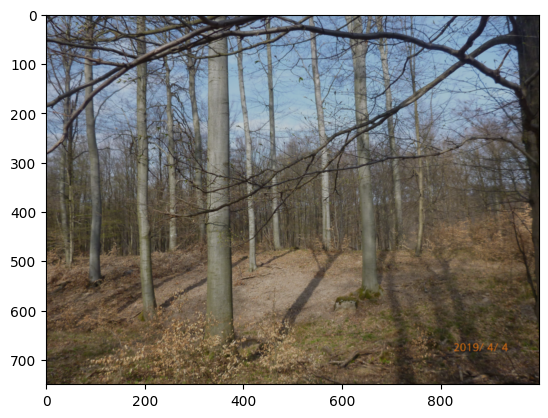

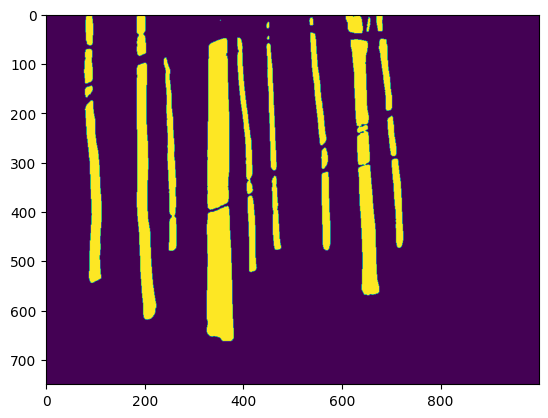

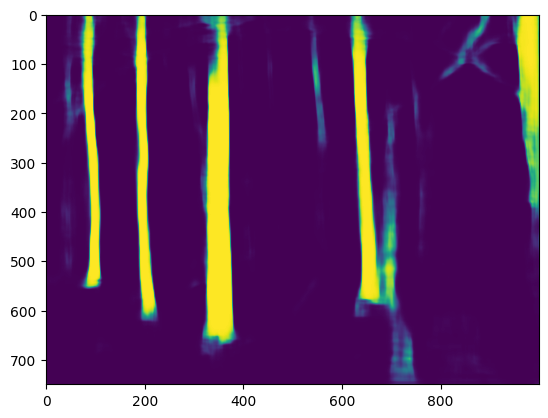

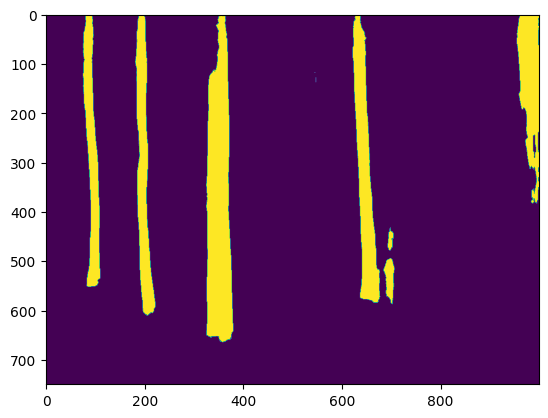

In [36]:
eval(210)

In [33]:
def plotter(num):
    import matplotlib.pyplot as plt

    num_images_per_row = 5
    # Calculate the number of rows needed
    num_rows = (num + num_images_per_row - 1) // num_images_per_row

    # Increase the plot size
    fig, axs = plt.subplots(num_rows * 2, num_images_per_row, figsize=(20, 8 * num_rows))

    for i, idx in enumerate(range(num)):
        input_image = val_dataset[idx * 13][0].detach().cpu().numpy()
        pred = unet(val_dataset[idx * 13][0].cuda().unsqueeze(0)).detach().cpu().numpy()
        bin_pred = (pred > 0.8).astype(int)[0]

        # Determine the row for plotting
        row = i // num_images_per_row

        # Calculate the column index within the current row
        col = i % num_images_per_row

        # Plot in the appropriate subplot
        axs[row * 2, col].imshow(np.transpose(input_image, [1, 2, 0]))
        axs[row * 2, col].set_title(f"Image {idx}")
        axs[row * 2, col].axis('off')

        axs[row * 2 + 1, col].imshow(np.transpose(bin_pred, (1, 2, 0)))
        axs[row * 2 + 1, col].set_title(f"Binary Prediction {idx}")
        axs[row * 2 + 1, col].axis('off')

    plt.tight_layout()
    plt.show()

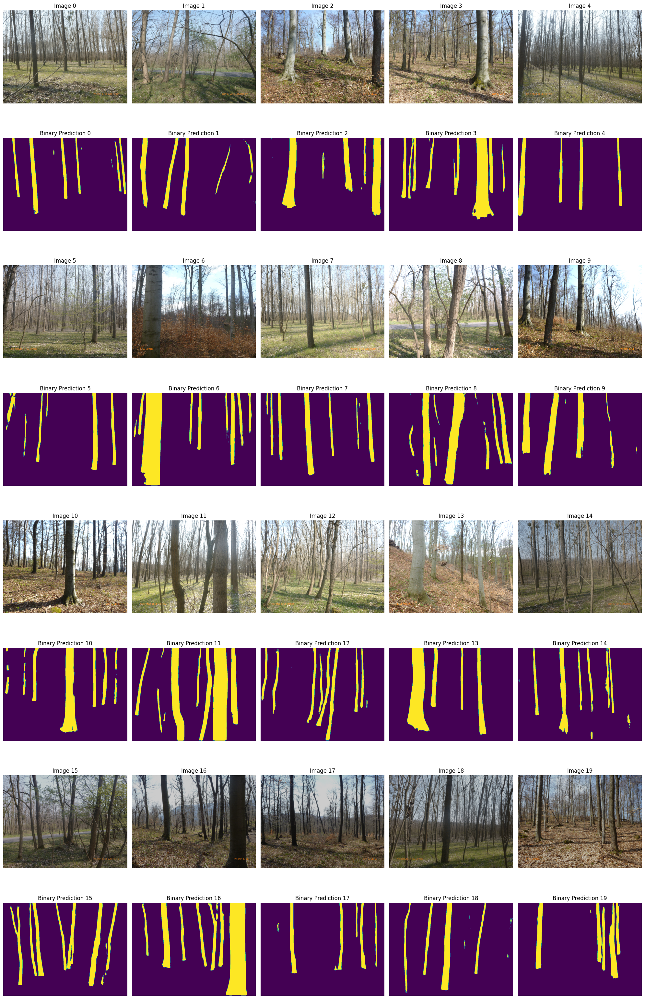

In [34]:
plotter(20)

In [21]:
predictions, results = unet.predict(val_loader, device=device)

In [22]:
torch.save(unet.state_dict(), 'unet_final.pth')

In [23]:
path = "path"
unet.load_state_dict(torch.load(path, map_location=device))

FileNotFoundError: [Errno 2] No such file or directory: 'path'